## Evaluation & Exploration

In [153]:
import pandas as pd
import torch
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sentence_transformers import SentenceTransformer, LoggingHandler, losses, models, util
from sentence_transformers.readers import InputExample
from sentence_transformers.evaluation import EmbeddingSimilarityEvaluator

### Explore data

In [23]:
# prepare corpus
dataset = pd.read_csv('./data/raw_data.csv')
dataset.shape

(17055, 5)

In [174]:
# basic corpus analysis
corpus_label_counts = dataset.value_counts(['label'])
corpus_label_counts

label            
restaurant-search    3042
movie-search         2669
flight-search        2293
music-search         1527
pizza-order          1376
coffee-order         1260
movie-ticket         1213
auto-repair-appt     1098
food-order           1009
ride-book             997
restaurant-book       571
dtype: int64

In [243]:
# generate per-label data for cleaning
for label in corpus_label_counts.index.tolist():
    label = label[0]
    df = dataset[dataset['label'] == label]
    df.to_csv("data_" + label+".csv")

#### Issues reported for each label's data:

1. auto-repair-appt: difference between "my car has an issue" vs. "my car has an issue please help book an appointment for it". Some dialogues (e.g. "looks like my maintenance lights are on" need inference to know that user actually wants a car appointment. How does an ML model learn that?). 10% corruption rate

2. coffee-order: 6% corruption rate
3. food-order: to make similar queries more explicit, cleaned out things like "I wanna get some food" (could be both food-order, or restaurant reservation, or restaurant-search). Also eliminated things like "That sounds great, I'll order two." Since we only look at single query and not dialog context.

general other issues: 
- hypothetical dialogues are very flowery, real dialog assistant dialogues are much more curt

Potential ideas:
1. use QA/websearch model: what user asks is strongly correlated to world knowledge, e.g. JLo => music
2. use inference model: e.g. "I'm hungry => find restaurants"

### Data Split

In [515]:
train_data_labels = ['auto-repair-appt', 'coffee-order', 'flight-search', 'food-order', 'movie-search', 'ride-book']
test_data_labels = ['auto-repair-appt', 'coffee-order', 'flight-search', 'food-order', 'hotel-search', 'movie-search', 'music-search', 'ride-book', 'pizza-order']

In [516]:
# # old data split: all labels in test corpus are also present in training corpus
# train_samples, dev_samples, test_samples = [], [], []
# for f in clean_data_labels:
#     filename = "./data/clean_csv/data_" + f + ".csv"
#     df = pd.read_csv(filename)[:900]
#     train_samples.append(df[:300])  
#     dev_samples.append(df[300 : 350])
#     test_samples.append(df[350:])
# train_corpus = pd.concat(train_samples)
# dev_corpus = pd.concat(dev_samples)
# test_corpus = pd.concat(test_samples)
# print("train corpus size: ", train_corpus.shape)
# print("dev corpus size: ", dev_corpus.shape)
# print("test corpus size: ", test_corpus.shape)

In [531]:
# improve data split:
train_samples, dev_samples, test_samples = [], [], []
for f in test_data_labels:
    filename = "./data/clean_csv/data_" + f + ".csv"
    df = pd.read_csv(filename)[:900]
    if f in train_data_labels:
        train_samples.append(df[:360])
        dev_samples.append(df[360:430])
        test_samples.append(df[430:])
    else:
        test_samples.append(df[:470])
train_corpus = pd.concat(train_samples)
dev_corpus = pd.concat(dev_samples)
test_corpus = pd.concat(test_samples)
print("train corpus size: ", train_corpus.shape)
print("dev corpus size: ", dev_corpus.shape)
print("test corpus size: ", test_corpus.shape)

train corpus size:  (2160, 4)
dev corpus size:  (420, 4)
test corpus size:  (4230, 4)


In [532]:
# create training sentence pairs
train_pair_corpus = []
train_corpus = train_corpus.sample(frac=1) # randomize order first
# first, create similar pairs
for label in clean_data_labels:
    same_label_data = train_corpus[train_corpus['label'] == label].reset_index(drop=True)
    utterance_list = same_label_data['utterance']
    for i in range(len(utterance_list) - 1):
        for j in range(i + 1, len(utterance_list)):
            utter1, utter2 = utterance_list[i], utterance_list[j]
            if (utter1 != utter2):
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)   # TODO: should we use baseline model score as similarity score?
                train_pair_corpus.append(inp_example)
    print(len(train_pair_corpus))
num_sim_pairs = len(train_pair_corpus)
print("Number of similar pairs in training data: ", num_sim_pairs)
# then, create dissimilar pairs
for idx in range(len(clean_data_labels) - 1):
    same_label_data = train_corpus[train_corpus['label'] == clean_data_labels[idx]].reset_index(drop=True)[:180]
    diff_label_data = train_corpus[train_corpus['label'].isin(clean_data_labels[idx + 1:])].reset_index(drop=True)[:180]
    for utter1 in same_label_data['utterance']:
        for utter2 in diff_label_data['utterance']:
            inp_example = InputExample(texts=[utter1, utter2], label=0.2)   # TODO: should we use baseline model score as similarity score?
            train_pair_corpus.append(inp_example)
train_pair_corpus = pd.Series(train_pair_corpus).sample(frac=1)
print("Number of dissimilar pairs in training data: ", len(train_pair_corpus) - num_sim_pairs)
print("total training data size: ", len(train_pair_corpus))

64620
129240
193860
258480
258480
323100
323100
387720
Number of similar pairs in training data:  387720
Number of dissimilar pairs in training data:  162000
total training data size:  549720


In [533]:
# create dev sentence pairs
dev_pair_corpus = []
dev_corpus = dev_corpus.sample(frac=1) # randomize order first
# first, create similar pairs
for label in clean_data_labels:
    same_label_data = dev_corpus[dev_corpus['label'] == label].reset_index(drop=True)
    utterance_list = same_label_data['utterance']
    for i in range(len(utterance_list) - 1):
        for j in range(i + 1, len(utterance_list)):
            utter1, utter2 = utterance_list[i], utterance_list[j]
            if (utter1 != utter2):
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)   # TODO: should we use baseline model score as similarity score?
                dev_pair_corpus.append(inp_example)
    print(len(dev_pair_corpus))
num_sim_dev_pairs = len(dev_pair_corpus)
print("Number of similar pairs in dev data: ", num_sim_dev_pairs)
# then, create dissimilar pairs
for idx in range(len(clean_data_labels) - 1):
    same_label_data = dev_corpus[dev_corpus['label'] == clean_data_labels[idx]].reset_index(drop=True)[:25]
    diff_label_data = dev_corpus[dev_corpus['label'].isin(clean_data_labels[idx + 1:])].reset_index(drop=True)[:25]
    for utter1 in same_label_data['utterance']:
        for utter2 in diff_label_data['utterance']:
            inp_example = InputExample(texts=[utter1, utter2], label=0.2)   # TODO: should we use baseline model score as similarity score?
            dev_pair_corpus.append(inp_example)
dev_pair_corpus = pd.Series(dev_pair_corpus).sample(frac=1)
print("Number of dissimilar pairs in dev data: ", len(dev_pair_corpus) - num_sim_dev_pairs)
print("total validation data size: ", len(dev_pair_corpus))

2415
4830
7245
9660
9660
12075
12075
14490
Number of similar pairs in dev data:  14490
Number of dissimilar pairs in dev data:  3125
total validation data size:  17615


In [298]:
print(train_pair_corpus[100])

<InputExample> label: 1.0, texts: Hey can you schedule an appointment for my car?; Hi, please book me an appointment with Intelligent Auto Solutions to get my oil change and tires rotated.


In [381]:
test_corpus = test_corpus.reset_index(drop=True)
print(test_corpus.shape)
test_corpus.head(5)

(4400, 4)


,instruction_id,conversation_id,utterance,label
0,auto-repair-appt-1,dlg-58095eee-6729-4135-a762-17e89af2c8a9,I need a car appointment.,auto-repair-appt
1,auto-repair-appt-1,dlg-58bed34b-8598-4a8a-bbaf-f15e3c186c5f,"Hi, I need you to book me an appointment at In...",auto-repair-appt
2,auto-repair-appt-1,dlg-5931b427-2a17-452a-b193-b122f86aa5c0,"Assistant, please schedule car maintence with ...",auto-repair-appt
3,auto-repair-appt-1,dlg-59356fc3-b351-4881-ad72-9cbb21c43004,I need to make an appointment to have my car f...,auto-repair-appt
4,auto-repair-appt-1,dlg-59b3eb21-a59c-4af5-a644-b2198cf59676,I need to make a car repair appointment with I...,auto-repair-appt


In [501]:
# # special test - pizza order corpus
# test_pizza_corpus = pd.read_csv("./data/clean_csv/data_pizza-order.csv")[:550]
# test_pizza_corpus = test_pizza_corpus.reset_index(drop=True)
# print(test_pizza_corpus.head(5))
# test_corpus = pd.concat([test_corpus, test_pizza_corpus]).reset_index(drop=True)
# test_corpus.shape

,instruction_id,conversation_id,utterance,label
0,pizza-ordering-2,dlg-0013673c-31c6-4565-8fac-810e173a5c53,I want to order a pizza from Bertuccis in Chel...,pizza-order
1,pizza-ordering-2,dlg-001d8bb1-6f25-4ecd-986a-b7eeb5fa4e19,Hi I'd like to order two large pizzas.,pizza-order
2,pizza-ordering-2,dlg-0034fae9-a3bc-4a0b-b0c7-127f16e5dcb1,I would like to order something from Bosses Pi...,pizza-order
3,pizza-ordering-2,dlg-003a10c4-9fdd-47da-bd56-1439c6acb37c,I want to order a pizza.,pizza-order
4,pizza-ordering-2,dlg-0053c980-6339-4df1-86ce-e2442205d970,Hey I'd like to order some pizza from papa johns.,pizza-order


### Knowledge Testing

Premise: does having world knowledge on entities help improve performance of model? 

In [429]:
import spacy
spacy_model = spacy.load("en_core_web_sm")

In [446]:
masking_map = {
 'EVENT': 'entity0',
 'FAC': 'entity1',
 'GPE': 'entity2',
 'LOC': 'entity3',
 'NORP': 'entity4',
 'ORG': 'entity5',
 'PERSON': 'entity6',
 'PRODUCT': 'entity7',
 'WORK_OF_ART': 'entity8'}

In [456]:
def mask_entity(u):
    doc = spacy_model(u)
    idxs = [0]
    masks = []
    ret = ""
    for ent in doc.ents:
        if ent.label_ in masking_map:
            idxs.append(ent.start_char)
            idxs.append(ent.end_char)
            masks.append(masking_map[ent.label_])
    if (len(idxs) > 1 and len(masks) > 0):
        for i in range(0, len(idxs) - 1, 2):
            ret = ret + u[idxs[i] : idxs[i + 1]] + masks[int(i / 2)]
        ret += u[idxs[-1] :]
        return ret
    else :
        return u

In [459]:
train_corpus['utterance'] = train_corpus['utterance'].apply(mask_entity)
test_corpus['utterance'] = test_corpus['utterance'].apply(mask_entity)

### Model Evaluation

In [417]:
# # load baseline model
# baseline_model = SentenceTransformer('paraphrase-distilroberta-base-v1')
# test_corpus_embeddings = baseline_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

In [225]:
# or, use custom model
# crude_model = SentenceTransformer('./models/crude')
# test_corpus_embeddings = crude_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)

In [391]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/finetune')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([4950, 768])

In [503]:
# or, use custom model
finetune_model = SentenceTransformer('./models/qa')
test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
test_corpus_embeddings.shape

torch.Size([4950, 768])

In [468]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/finetune_corrupted')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([4950, 768])

In [476]:
# # # or, use custom model
# finetune_model = SentenceTransformer('./models/qa_corrupted')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([4950, 768])

In [534]:
test_corpus_dist = test_corpus['label'].value_counts()
test_corpus_dist

coffee-order        470
ride-book           470
movie-search        470
pizza-order         470
flight-search       470
hotel-search        470
music-search        470
food-order          470
auto-repair-appt    470
Name: label, dtype: int64

In [505]:
# Find the closest k sentences of the corpus for each query sentence based on cosine similarity
top_k = 550 # is this something we should tune for? Currently try to capture all possible results
# top_k = min(5, len(corpus))
results = []
for i in range(len(test_corpus)):
#     query_embedding = baseline_model.encode(query, convert_to_tensor=True)
    query_embedding = test_corpus_embeddings[i]
    query = test_corpus['utterance'][i]

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    cos_scores = util.pytorch_cos_sim(query_embedding, test_corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k, sorted=True) # top one query is input itself
    print(cos_scores.shape)
    print(top_results[0].shape)
    results.append(top_results)

    print("\n\n======================\n\n")
    print("Query:", query)
    
    print("\nTop 5 most similar sentences in corpus:")
    for score, idx in zip(top_results[0][:5], top_results[1][:5]):
        print(score, idx.item())
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))
    
    print("\nTop 5 least similar sentences in corpus:")
    for score, idx in zip(top_results[0][-4:], top_results[1][-4:]):
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))

print(len(results))

torch.Size([4950])
torch.Size([550])




Query: I need a car appointment.

Top 5 most similar sentences in corpus:
tensor(1.0000) 0
I need a car appointment. (Score: 1.0000)
tensor(0.9966) 325
I need to get a car book appointment please (Score: 0.9966)
tensor(0.9965) 361
I need to schedule a car appointment (Score: 0.9965)
tensor(0.9959) 9
I would like to schedule a car appointment please (Score: 0.9959)
tensor(0.9959) 410
I wanna schedule a car appointment (Score: 0.9959)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.8080)
I was wondering how much an oil change would cost me? (Score: 0.8011)
i need oil change (Score: 0.7934)
I have a car that needs help. (Score: 0.7903)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need you to book me an appointment at Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 1
Hi, I need you to book me an appointment at Intellige

tensor(0.9931) 14
I have some car issues and need to make an appointment (Score: 0.9931)
tensor(0.9928) 208
Hi i'm driving and my car is acting funny can you make an appointment for me to take it in (Score: 0.9928)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7863)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7853)
Hey, it's me, I'm heading back to the office. (Score: 0.7803)
I was wondering how much an oil change would cost me? (Score: 0.7719)
torch.Size([4950])
torch.Size([550])




Query: Hey Google, I need to make an appointment with a repair shop quick.

Top 5 most similar sentences in corpus:
tensor(1.0000) 13
Hey Google, I need to make an appointment with a repair shop quick. (Score: 1.0000)
tensor(0.9949) 515
Hello, I need to schedule an appointment to have my car repaired. (Score: 0.9949)
tensor(0.9946) 4385
Hi, I need to schedule an appointment with car repai

tensor(0.9994) 49
I need to make an appointment with a mechanic. (Score: 0.9994)
tensor(0.9982) 254
I need to schedule an appointment with a car mechanic. (Score: 0.9982)
tensor(0.9979) 37
Hi. Will you schedule me an appointment with a mechanic. (Score: 0.9979)
tensor(0.9978) 416
I need to schedule a mechanic appointment. (Score: 0.9978)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7848)
I was wondering how much an oil change would cost me? (Score: 0.7807)
Hey, it's me, I'm heading back to the office. (Score: 0.7767)
i need oil change (Score: 0.7755)
torch.Size([4950])
torch.Size([550])




Query: HI I need to book an appointment with Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 27
HI I need to book an appointment with Intelligent Auto Solutions (Score: 1.0000)
tensor(0.9980) 214
I need to book an appointment with Intelligent Auto Solutions. (Score: 0.9980)
t

torch.Size([4950])
torch.Size([550])




Query: I would like to schedule an appointment with Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 42
I would like to schedule an appointment with Intelligent Auto Solutions (Score: 1.0000)
tensor(0.9994) 494
I would like to schedule an appointment with Intelligent Auto Solutions. (Score: 0.9994)
tensor(0.9990) 433
I would like to schedule an appointment at Intelligent Auto Solutions. (Score: 0.9990)
tensor(0.9988) 460
Hello, I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.9988)
tensor(0.9988) 538
I'd like to schedule an appointment with Intelligent Auto Solutions, please. (Score: 0.9988)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7877)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7836)
Hey, it's me, I'm heading back to the office. (Score: 0.7834)
I was wondering ho

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to schedule an appointment to make an appointment to take my car to a mechanic to get checked out

Top 5 most similar sentences in corpus:
tensor(1.0000) 57
Hi, I'd like to schedule an appointment to make an appointment to take my car to a mechanic to get checked out (Score: 1.0000)
tensor(0.9967) 190
Hey, can I schedule an appointment for my car to be looked at? (Score: 0.9967)
tensor(0.9963) 441
I want to make an appointment to get my car worked on at Intelligent Auto Solutions.. (Score: 0.9963)
tensor(0.9961) 354
Hello, will you schedule an appointment for my car to be looked at?  (Score: 0.9961)
tensor(0.9958) 400
Hey assistant. Can you book me an appointment to have my car looked at? (Score: 0.9958)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7774)
Hey, it's me, I'm heading back to the office. (Score: 0.7770)
I need my 2012 Kia Forte worked on by a professional at Intelligent A

torch.Size([4950])
torch.Size([550])




Query: I have a car that needs help.

Top 5 most similar sentences in corpus:
tensor(1.0000) 72
I have a car that needs help. (Score: 1.0000)
tensor(0.9763) 4204
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.9763)
tensor(0.9723) 3948
i need a car pick up (Score: 0.9723)
tensor(0.9686) 216
Hey there, I need to take the van into the shop. (Score: 0.9686)
tensor(0.9461) 4594
hi there becky i need your help (Score: 0.9461)

Top 5 least similar sentences in corpus:
If possible, I would like to schedule an appointment for my car, as it is making a sharp noise seemingly coming from the engine. (Score: 0.7400)
Hello, my car is having problems as I speak and I need you to make me an appointment. (Score: 0.7399)
I need to schedule an appointment for my car (Score: 0.7399)
Hey assistant I need to schedule an appointment at the auto shop. (Score: 0.7399)
torch.Size([4950])
torch.Size([550])




Query: I need to make an appointment for

torch.Size([4950])
torch.Size([550])




Query: Hello, can you please make me an appointment with the mechanic for my car?

Top 5 most similar sentences in corpus:
tensor(1.) 89
Hello, can you please make me an appointment with the mechanic for my car? (Score: 1.0000)
tensor(0.9981) 142
I need you to book an appointment for my car to go to the mechanic. (Score: 0.9981)
tensor(0.9977) 419
Hi, can you help me set up an appointment to take my car to the mechanic? (Score: 0.9977)
tensor(0.9976) 21
I need you to make me an appointment with an auto mechanic for my car. (Score: 0.9976)
tensor(0.9976) 60
Hi, please make an appointment with my mechanic to check my car. (Score: 0.9976)

Top 5 least similar sentences in corpus:
Hey, it's me, I'm heading back to the office. (Score: 0.7777)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7774)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7749)
I was wondering how much an oil 

torch.Size([4950])
torch.Size([550])




Query: Hey. My car is messed up, can I bring it in sometime soon?

Top 5 most similar sentences in corpus:
tensor(1.0000) 106
Hey. My car is messed up, can I bring it in sometime soon? (Score: 1.0000)
tensor(0.9913) 192
Hey Jack, my car is acting funky. I think I need to take it in (Score: 0.9913)
tensor(0.9839) 144
Yo man I need to get my car in (Score: 0.9839)
tensor(0.9838) 87
Hello Jane, I hope your day is going fabulous. I need my car serviced. (Score: 0.9838)
tensor(0.9830) 253
David. How are you? Listen, I really need to get the car in quick, I'm having some trouble on the road. (Score: 0.9830)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.8629)
I was wondering how much an oil change would cost me? (Score: 0.8521)
hi there becky i need your help (Score: 0.8383)
i need oil change (Score: 0.8371)
torch.Size([4950])
torch.Size([550])




Query: Hi, my car is having a problem. C

tensor(1.) 123
Hey! I need to take my car into a mechanic ASAP. (Score: 1.0000)
tensor(0.9980) 100
Hey I need to get my car into the mechanic ASAP! (Score: 0.9980)
tensor(0.9974) 279
Hello, I need to take my car to a mechanic. (Score: 0.9974)
tensor(0.9968) 544
I need to take my car to the mechanic. (Score: 0.9968)
tensor(0.9960) 390
Hey Sue. I need to get an appointment with an auto mechanic. My car is having problems.  (Score: 0.9960)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7821)
Hey, it's me, I'm heading back to the office. (Score: 0.7802)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7790)
I was wondering how much an oil change would cost me? (Score: 0.7669)
torch.Size([4950])
torch.Size([550])




Query: Can you schedule a car repair for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 124
Can you schedule a car repair for me? (Score: 1.0000)
tensor

torch.Size([4950])
torch.Size([550])




Query: Can you find me an appointment today at Intelligent Auto Solutions?

Top 5 most similar sentences in corpus:
tensor(1.) 139
Can you find me an appointment today at Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.9989) 511
can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9989)
tensor(0.9989) 499
Can you make me an appointment at Intelligent Auto Solutions? (Score: 0.9989)
tensor(0.9988) 161
Can you get me an appointment at Intelligent Auto Solutions? (Score: 0.9988)
tensor(0.9987) 504
Hey, can you schedule me an appointment at Intelligent Auto Solutions? (Score: 0.9987)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.8033)
I was wondering how much an oil change would cost me? (Score: 0.7977)
i need oil change (Score: 0.7900)
Hey, it's me, I'm heading back to the office. (Score: 0.7846)
torch.Size([4950])
torch.Size([550])




Query: Hey Kate! I'm calling to see if you 

tensor(1.0000) 151
Stella, hi, can you get me an appointment at Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.9983) 497
Hey, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9983)
tensor(0.9980) 1
Hi, I need you to book me an appointment at Intelligent Auto Solutions (Score: 0.9980)
tensor(0.9980) 158
Hello, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9980)
tensor(0.9980) 444
Hey, can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9980)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.8108)
I was wondering how much an oil change would cost me? (Score: 0.8009)
i need oil change (Score: 0.7938)
Hey, it's me, I'm heading back to the office. (Score: 0.7833)
torch.Size([4950])
torch.Size([550])




Query: Hey, Carlos. I need you to schedule an appointment with Intelligent Auto Solutions. My back bumper got wrecked.

Top 5 most similar sentences in corpus:
tensor(

torch.Size([4950])
torch.Size([550])




Query: Hello Google! I need for you to book me an appointment with Intelligent Auto Solutions quickly! My car is overheating.

Top 5 most similar sentences in corpus:
tensor(1.0000) 164
Hello Google! I need for you to book me an appointment with Intelligent Auto Solutions quickly! My car is overheating. (Score: 1.0000)
tensor(0.9966) 199
Hey Susie, my car's been acting weird. Can you set an appointment for me with Intelligent Auto Solutions? (Score: 0.9966)
tensor(0.9958) 322
Hey, I need to book an appointment with Intelligent Auto Solutions for my car. (Score: 0.9958)
tensor(0.9958) 152
Hey, Carlos. I need you to schedule an appointment with Intelligent Auto Solutions. My back bumper got wrecked. (Score: 0.9958)
tensor(0.9956) 387
Hey, I'm having a bit of car trouble right now. Could you book me an appointment at Intelligent Auto Solutions? (Score: 0.9956)

Top 5 least similar sentences in corpus:
Hey, it's me, I'm heading back to the office. (

tensor(0.9975) 288
Hey! Could you book an appointment at the auto repair shop for my car?  (Score: 0.9975)
tensor(0.9971) 177
Hi, this is Bob Nash. Can you please schedule an appointment to have my car looked at and possibly repaired? (Score: 0.9971)
tensor(0.9970) 229
Hi I need to book an appointment for my car to get repaired. (Score: 0.9970)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7989)
Hey, it's me, I'm heading back to the office. (Score: 0.7961)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7957)
I was wondering how much an oil change would cost me? (Score: 0.7878)
torch.Size([4950])
torch.Size([550])




Query: Want to schedule a car appointment

Top 5 most similar sentences in corpus:
tensor(1.) 180
Want to schedule a car appointment (Score: 1.0000)
tensor(0.9989) 35
Need to schedule a car appointment (Score: 0.9989)
tensor(0.9975) 410
I wanna schedule a car

tensor(0.9969) 518
Hi, can you make appointment with Intelligent Auto Solutions? (Score: 0.9969)
tensor(0.9969) 139
Can you find me an appointment today at Intelligent Auto Solutions? (Score: 0.9969)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.8098)
I was wondering how much an oil change would cost me? (Score: 0.7985)
Hey, it's me, I'm heading back to the office. (Score: 0.7922)
i need oil change (Score: 0.7873)
torch.Size([4950])
torch.Size([550])




Query: Hello I need a appointment made at Intelligent Auto Solutions please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 196
Hello I need a appointment made at Intelligent Auto Solutions please. (Score: 1.0000)
tensor(0.9989) 246
Hello, I need to make an appointment at Intelligent Auto Solutions. (Score: 0.9989)
tensor(0.9987) 281
I need to schedule an appointment at Intelligent Auto Solutions. (Score: 0.9987)
tensor(0.9987) 176
Hi, I 

tensor(0.9983) 415
Hi, can you make an appointment for my car. (Score: 0.9983)
tensor(0.9983) 283
I want to book an appointment for my car (Score: 0.9983)
tensor(0.9982) 259
Hi, I'd like to book an appointment for my car (Score: 0.9982)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7947)
Hey, it's me, I'm heading back to the office. (Score: 0.7933)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7911)
I was wondering how much an oil change would cost me? (Score: 0.7840)
torch.Size([4950])
torch.Size([550])




Query: Hi Roy. I need you to call my auto repair shop "Intelligent Auto Solutions", and make an appointment for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 213
Hi Roy. I need you to call my auto repair shop "Intelligent Auto Solutions", and make an appointment for me. (Score: 1.0000)
tensor(0.9971) 255
I need to book an appointment at the auto repair 

torch.Size([4950])
torch.Size([550])




Query: Panda I'm having issues with my truck I need to set up an appointment to have it looked at

Top 5 most similar sentences in corpus:
tensor(1.0000) 228
Panda I'm having issues with my truck I need to set up an appointment to have it looked at (Score: 1.0000)
tensor(0.9956) 116
Hey, I need you to make an appointment to get my car looked at (Score: 0.9956)
tensor(0.9947) 153
Hey, can you set up an appointment for me to have my car looked at this week? (Score: 0.9947)
tensor(0.9946) 428
Hi, I need to book an appointment to get my car looked at. (Score: 0.9946)
tensor(0.9946) 413
I need to book an appointment to get my car looked at. (Score: 0.9946)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7901)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7753)
Hey, it's me, I'm heading back to the office. (Score: 0.7746)
I was wondering 

torch.Size([4950])
torch.Size([550])




Query: I'd like to schedule a car repair at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 239
I'd like to schedule a car repair at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9945) 375
Do you have time today to call about making an auto repair appoint for my car? (Score: 0.9945)
tensor(0.9942) 521
Hi I would like to send my car to Intelligent Auto Solutions. (Score: 0.9942)
tensor(0.9941) 74
I need to take my car into Intelligent Auto Solutions (Score: 0.9941)
tensor(0.9939) 167
Hey, assistant. I need car to be serviced. Could you book an appointment at Intelligent Auto Solutions for me? (Score: 0.9939)

Top 5 least similar sentences in corpus:
Hi Mimi. I am flying back into town for my court appearance on Monday. (Score: 0.8181)
I was wondering how much an oil change would cost me? (Score: 0.8101)
Hey, it's me, I'm heading back to the office. (Score: 0.8028)
I have a car that needs help. (Score: 0.

torch.Size([4950])
torch.Size([550])




Query: I really am having some issues with my 2016 Buick Enclave.

Top 5 most similar sentences in corpus:
tensor(1.) 252
I really am having some issues with my 2016 Buick Enclave. (Score: 1.0000)
tensor(0.9396) 225
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.9396)
tensor(0.9344) 4370
 I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems.  (Score: 0.9344)
tensor(0.9332) 327
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.9332)
tensor(0.9249) 3984
Hey Jan . I need car in 30 minutes . (Score: 0.9249)

Top 5 least similar sentences in corpus:
I would like to request a ride from Lyft. (Score: 0.7184)
Hello, I need a ride to the Great Northern Mall. (Score: 0.7182)
I would like to get a ride ordered (Score: 0.7181)
Can I get a ride via 

torch.Size([4950])
torch.Size([550])




Query: I would like to change my headlight

Top 5 most similar sentences in corpus:
tensor(1.0000) 264
I would like to change my headlight (Score: 1.0000)
tensor(0.9590) 141
Hi I have an AB123 light going off on my car (Score: 0.9590)
tensor(0.9412) 87
Hello Jane, I hope your day is going fabulous. I need my car serviced. (Score: 0.9412)
tensor(0.9399) 106
Hey. My car is messed up, can I bring it in sometime soon? (Score: 0.9399)
tensor(0.9396) 33
hi sally i need you to make an appointment to get the headlight fixed on my 2006 hyundai sonata, it failed inspection (Score: 0.9396)

Top 5 least similar sentences in corpus:
i need oil change (Score: 0.8271)
Hi, I need to be picked up, please. (Score: 0.8253)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.8223)
I was wondering how much an oil change would cost me? (Score: 0.8170)
torch.Size([4950])
torch.Size([550])




Query: I need you to make an appointment for me please.

torch.Size([4950])
torch.Size([550])




Query: hello I have a 2010 ford fusion and I need to get it repaired, can you help?

Top 5 most similar sentences in corpus:
tensor(1.0000) 276
hello I have a 2010 ford fusion and I need to get it repaired, can you help? (Score: 1.0000)
tensor(0.9700) 150
Hi I am having problems with my car. Could you book a repair shop for me for my 2017 Honda Civic (Score: 0.9700)
tensor(0.9688) 506
Hi, I need to get my car repaired. (Score: 0.9688)
tensor(0.9687) 475
Hello, can you please schedule an auto repair for me? (Score: 0.9687)
tensor(0.9675) 435
Hello, I need to get my car repaired? (Score: 0.9675)

Top 5 least similar sentences in corpus:
I have a car that needs help. (Score: 0.8243)
Hi, I need to be picked up, please. (Score: 0.8166)
i need oil change (Score: 0.8123)
Hey, it's me, I'm heading back to the office. (Score: 0.8060)
torch.Size([4950])
torch.Size([550])




Query: I need a appointment for my car asap.

Top 5 most similar sentences in cor

I was wondering how much an oil change would cost me? (Score: 0.8577)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.8444)
i need oil change (Score: 0.8385)
I would like to change my 12V battery (Score: 0.8384)
torch.Size([4950])
torch.Size([550])




Query: Hey Sally. I just got to work and my car is making an awful sound when I turn. I am afraid to drive it home!

Top 5 most similar sentences in corpus:
tensor(1.0000) 292
Hey Sally. I just got to work and my car is making an awful sound when I turn. I am afraid to drive it home! (Score: 1.0000)
tensor(0.9902) 432
Hello Assistant, This is Kenny Imes, I am driving and my car is making a squealing noise under the hood every time I turn. I need to get into Intelligent Auto Solutions as soon as possible. (Score: 0.9902)
tensor(0.9893) 64
My car is making strange noises, I think I need to go to the auto repair shop. (Score: 0.9893)
tensor(0.9890) 121
Hey Google..I think i need to service my car. Of late i hear some no

torch.Size([4950])
torch.Size([550])




Query: I need you to call Intelligent Auto Solutions and see when I can get them to look at my car.

Top 5 most similar sentences in corpus:
tensor(1.0000) 306
I need you to call Intelligent Auto Solutions and see when I can get them to look at my car. (Score: 1.0000)
tensor(0.9964) 114
Hello, I would like to for you call Intelligent Auto Solutions to schedule an appointment for my car. (Score: 0.9964)
tensor(0.9955) 22
Hello, please make me an appointment at Intelligent Auto Solutions to bring my car in. (Score: 0.9955)
tensor(0.9954) 322
Hey, I need to book an appointment with Intelligent Auto Solutions for my car. (Score: 0.9954)
tensor(0.9952) 115
Hello, I need you to call Intelligent Auto Solutions and make me an appointment as soon as possible. (Score: 0.9952)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7887)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Sco

I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7510)
I was wondering how much an oil change would cost me? (Score: 0.7442)
torch.Size([4950])
torch.Size([550])




Query: Hi. Can you please help me book an appointment to get my car fixed?

Top 5 most similar sentences in corpus:
tensor(1.0000) 321
Hi. Can you please help me book an appointment to get my car fixed? (Score: 1.0000)
tensor(0.9987) 313
Hi can you book me an appointment to get my car fixed? (Score: 0.9987)
tensor(0.9980) 465
Hey I need to make an appointment to get my car fixed (Score: 0.9980)
tensor(0.9977) 238
Hi, can I schedule an appointment for my car to get fixed? (Score: 0.9977)
tensor(0.9977) 287
Hello, I would like you to book an appointment to have my car repaired (Score: 0.9977)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7884)
I need my 2012 Kia Forte worked on by a professional at Intelligent Au

tensor(0.9981) 473
Hello John, I need you to book a service appointment for my car at Intelligent Auto Solutions. (Score: 0.9981)
tensor(0.9974) 181
Hi, I need to make an appointment with Intelligent Auto Solutions. (Score: 0.9974)
tensor(0.9974) 477
Hi I need to make an appointment with Intelligent Auto Solutions (Score: 0.9974)
tensor(0.9974) 317
Hi, I'm calling for a car appointment at "Intelligent Auto Solutions". (Score: 0.9974)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.8032)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7933)
Hey, it's me, I'm heading back to the office. (Score: 0.7927)
I was wondering how much an oil change would cost me? (Score: 0.7893)
torch.Size([4950])
torch.Size([550])




Query: Hey! I was wondering if you could set me up an appointment with Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 333
Hey! I was wondering if you could set me up an appointmen

torch.Size([4950])
torch.Size([550])




Query: Good morning Renee. I need you to schedule an appointment for my vehicle?

Top 5 most similar sentences in corpus:
tensor(1.0000) 345
Good morning Renee. I need you to schedule an appointment for my vehicle? (Score: 1.0000)
tensor(0.9964) 324
I need to schedule an appointment for my car (Score: 0.9964)
tensor(0.9963) 101
I need to schedule an appointment for my vehicle (Score: 0.9963)
tensor(0.9959) 421
Hi I need to schedule an appointment for my car (Score: 0.9959)
tensor(0.9957) 472
I would like you schedule an appointment for my car. (Score: 0.9957)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7978)
Hey, it's me, I'm heading back to the office. (Score: 0.7910)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7798)
I was wondering how much an oil change would cost me? (Score: 0.7767)
torch.Size([4950])
torch.Size([550])





tensor(1.0000) 356
I need to make an appointment at Intelligent Auto Imports this week. (Score: 1.0000)
tensor(0.9990) 207
I need to make an appointment at Intelligent Auto Imports. (Score: 0.9990)
tensor(0.9964) 351
Hi, I need an appointment scheduled at Intelligent Auto Solutions. (Score: 0.9964)
tensor(0.9961) 246
Hello, I need to make an appointment at Intelligent Auto Solutions. (Score: 0.9961)
tensor(0.9960) 241
I need to make an appointment with Intelligent Auto Solutions asap. (Score: 0.9960)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7942)
Hi, I need to be picked up, please. (Score: 0.7921)
Hey, it's me, I'm heading back to the office. (Score: 0.7863)
I was wondering how much an oil change would cost me? (Score: 0.7820)
torch.Size([4950])
torch.Size([550])




Query: Hey, I need to get my car into the shop relatively soon.

Top 5 most similar sentences in corpus:
tensor(1.0000) 357
Hey, I need to get my ca

tensor(0.9984) 273
Hi Lisa, I need you to book an auto repair appointment for me. (Score: 0.9984)
tensor(0.9981) 520
I need to make an auto repair appointment. (Score: 0.9981)
tensor(0.9980) 338
Hello, I need an auto repair appointment. (Score: 0.9980)
tensor(0.9974) 122
Hi there, I need to make an appointment with an auto repair shop. (Score: 0.9974)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7949)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7910)
Hey, it's me, I'm heading back to the office. (Score: 0.7868)
I was wondering how much an oil change would cost me? (Score: 0.7846)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to set up an appointment to get my car checked out.

Top 5 most similar sentences in corpus:
tensor(1.0000) 371
Hi, I'd like to set up an appointment to get my car checked out. (Score: 1.0000)
tensor(0.9988) 112
Hi, Angela? I need t

tensor(0.9919) 489
Haley, our Honda Civic is making a noise. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 0.9919)
tensor(0.9861) 87
Hello Jane, I hope your day is going fabulous. I need my car serviced. (Score: 0.9861)
tensor(0.9850) 62
Hello, could you please call Tom's Cadillac Service to book an appointment for my car? (Score: 0.9850)

Top 5 least similar sentences in corpus:
i need oil change (Score: 0.8584)
Need to get my breaks looked at. (Score: 0.8532)
I WOULD LIKE TO PLACE AN ORDER WITH DOMINOES (Score: 0.8483)
hi there becky i need your help (Score: 0.8451)
torch.Size([4950])
torch.Size([550])




Query: I think I need to schedule a check up for my car.

Top 5 most similar sentences in corpus:
tensor(1.0000) 384
I think I need to schedule a check up for my car. (Score: 1.0000)
tensor(0.9958) 449
Hi, I need to book an appointment for a tune up for my car, please. (Score: 0.9958)
tensor(0.9952) 362
I need to set an appointment to get my car checke

tensor(0.9993) 214
I need to book an appointment with Intelligent Auto Solutions. (Score: 0.9993)
tensor(0.9993) 176
Hi, I need to book an appointment at Intelligent Auto Solutions. (Score: 0.9993)
tensor(0.9993) 281
I need to schedule an appointment at Intelligent Auto Solutions. (Score: 0.9993)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7926)
I was wondering how much an oil change would cost me? (Score: 0.7864)
Hey, it's me, I'm heading back to the office. (Score: 0.7823)
i need oil change (Score: 0.7818)
torch.Size([4950])
torch.Size([550])




Query: i need oil change

Top 5 most similar sentences in corpus:
tensor(1.0000) 396
i need oil change (Score: 1.0000)
tensor(0.9710) 53
Hey, I need an oil change. (Score: 0.9710)
tensor(0.9589) 55
Hi, I'd like to get an oil change (Score: 0.9589)
tensor(0.9407) 505
I was wondering how much an oil change would cost me? (Score: 0.9407)
tensor(0.9350) 34
I need to get an oil change next week. (Score:

tensor(0.9960) 116
Hey, I need you to make an appointment to get my car looked at (Score: 0.9960)
tensor(0.9958) 411
Hello I'd like to make an appointment to get my car looked at today (Score: 0.9958)

Top 5 least similar sentences in corpus:
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.8054)
Hey, it's me, I'm heading back to the office. (Score: 0.7925)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7869)
I was wondering how much an oil change would cost me? (Score: 0.7705)
torch.Size([4950])
torch.Size([550])




Query: Hello, I need to schedule some maintenance on my car. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 408
Hello, I need to schedule some maintenance on my car.  (Score: 1.0000)
tensor(0.9944) 249
I need to schedule maintenance on my vehicle. (Score: 0.9944)
tensor(0.9934) 206
I need to get my car in for servicing. (Score: 0.9934)
tensor(0.9924) 459
Hi, I need to have my car serviced at 

torch.Size([4950])
torch.Size([550])




Query: Hey! I need you to schedule an appointment for me to have my car looked at. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 423
Hey! I need you to schedule an appointment for me to have my car looked at.  (Score: 1.0000)
tensor(0.9980) 516
I need to schedule an appointment to get my car looked at. (Score: 0.9980)
tensor(0.9980) 428
Hi, I need to book an appointment to get my car looked at. (Score: 0.9980)
tensor(0.9978) 378
I need to make an appointment to have my car looked at. (Score: 0.9978)
tensor(0.9975) 185
Hi, I need to make an appointment to have my car looked at (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7746)
Hey, it's me, I'm heading back to the office. (Score: 0.7738)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7518)
I was wondering how much an oil change would cost me? (Score: 0.7439)
torch.Size([4950])
torc

torch.Size([4950])
torch.Size([550])




Query: Hi, I want to get someone to look at my car. Can you help?

Top 5 most similar sentences in corpus:
tensor(1.0000) 439
Hi, I want to get someone to look at my car. Can you help? (Score: 1.0000)
tensor(0.9915) 545
Hello. I need to bring my car in for service. (Score: 0.9915)
tensor(0.9903) 274
Hey, I need to get my car in to the shop. Can you schedule it for me? (Score: 0.9903)
tensor(0.9887) 217
Jessica? I need to bring my car in for a repair somewhere. Do you know any good places? (Score: 0.9887)
tensor(0.9886) 118
Hello, I need to take my car to get it repaired. (Score: 0.9886)

Top 5 least similar sentences in corpus:
Hey, it's me, I'm heading back to the office. (Score: 0.8209)
I have a car that needs help. (Score: 0.8204)
Hi Mimi. I am flying back into town for my court appearance on Monday. (Score: 0.8159)
I was wondering how much an oil change would cost me? (Score: 0.8118)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd li

torch.Size([4950])
torch.Size([550])




Query: I need to make an appointment to have my Jeep looked at.

Top 5 most similar sentences in corpus:
tensor(1.0000) 452
I need to make an appointment to have my Jeep looked at. (Score: 1.0000)
tensor(0.9963) 358
Hey I need to make an appointment at the dealership for my Jeep. (Score: 0.9963)
tensor(0.9928) 209
Hello, I need an appointment for a review of my vehicle? (Score: 0.9928)
tensor(0.9926) 63
I need to make an appointment to have my car serviced (Score: 0.9926)
tensor(0.9926) 356
I need to make an appointment at Intelligent Auto Imports this week. (Score: 0.9926)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.8066)
I was wondering how much an oil change would cost me? (Score: 0.7998)
i need oil change (Score: 0.7887)
I have a car that needs help. (Score: 0.7819)
torch.Size([4950])
torch.Size([550])




Query: Hi, I have to schedule an appointment for my car.

Top 5 most similar sentences in cor

torch.Size([4950])
torch.Size([550])




Query: I need to make an appointment to get my car fixed at Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 463
I need to make an appointment to get my car fixed at Intelligent Auto Solutions (Score: 1.0000)
tensor(0.9980) 443
I need you to schedule an appointment to get my car fixed please (Score: 0.9980)
tensor(0.9980) 308
I need to make an appointment to get my car serviced at Intelligent Auto Solutions. (Score: 0.9980)
tensor(0.9980) 3
I need to make an appointment to have my car fixed (Score: 0.9980)
tensor(0.9980) 490
I need to make an appointment for my car at Intelligent Auto Solutions (Score: 0.9980)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7838)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7787)
Hey, it's me, I'm heading back to the office. (Score: 0.7763)
I was wondering how much an oil change would cost m

torch.Size([4950])
torch.Size([550])




Query: I have alot of warning lights on including my check engine light. I need to take it in for service

Top 5 most similar sentences in corpus:
tensor(1.0000) 476
I have alot of warning lights on including my check engine light. I need to take it in for service (Score: 1.0000)
tensor(0.9919) 41
Mark, I need to schedule an appointment to find out why the check engine light is on in the Fiesta. (Score: 0.9919)
tensor(0.9901) 517
Hey! I think I need to go to the auto shop. The check engine light keeps coming on and I hear a sputter. Can you help me out? I'm currently driving. (Score: 0.9901)
tensor(0.9899) 215
Hey, I keep forgetting that I have a headlight out and I need to get in and get it fixed. Do you think you could help me out with that, I am driving right now. (Score: 0.9899)
tensor(0.9896) 512
Hey Carrie, I need you to check the availability at Intelligent Auto Solutions for me; there is something not right with my car. (Score: 0.9896)



tensor(0.9983) 86
Hi Joe - I need you to make an appointment for my car. (Score: 0.9983)
tensor(0.9983) 99
Hi, I need to make an appointment for my car please. (Score: 0.9983)
tensor(0.9980) 127
Hi I need to make an appointment for my car. (Score: 0.9980)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7914)
Hey, it's me, I'm heading back to the office. (Score: 0.7877)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7717)
I was wondering how much an oil change would cost me? (Score: 0.7635)
torch.Size([4950])
torch.Size([550])




Query: Haley, our Honda Civic is making a noise. Can you please get me an appointment at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.) 489
Haley, our Honda Civic is making a noise. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9936) 69
Haley, the Lexus is not letting me close all doors with the 

tensor(0.9994) 497
Hey, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9994)
tensor(0.9994) 84
Hey! Can you book me an appointment at Intelligent Auto Solutions? (Score: 0.9994)
tensor(0.9993) 364
Hey, Tim. Can you schedule me an appointment at Intelligent Auto Solutions? (Score: 0.9993)
tensor(0.9992) 444
Hey, can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9992)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7992)
I was wondering how much an oil change would cost me? (Score: 0.7910)
i need oil change (Score: 0.7837)
Hey, it's me, I'm heading back to the office. (Score: 0.7834)
torch.Size([4950])
torch.Size([550])




Query: I was wondering how much an oil change would cost me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 505
I was wondering how much an oil change would cost me? (Score: 1.0000)
tensor(0.9600) 53
Hey, I need an oil change. (Score: 0.9600)
tensor(0.9568) 55
Hi, I

tensor(0.9981) 370
Hi, Greg. I need to make an auto repair appointment. (Score: 0.9981)
tensor(0.9975) 337
Hello, I need you to schedule an auto repair appointment  (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hi, I need to be picked up, please. (Score: 0.7871)
I was wondering how much an oil change would cost me? (Score: 0.7823)
Sorry, I had to step away for a bit. What was I doing earlier? (Score: 0.7801)
i need oil change (Score: 0.7784)
torch.Size([4950])
torch.Size([550])




Query: Hi I would like to send my car to Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.) 521
Hi I would like to send my car to Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9981) 299
Can you send my car to Intelligent Auto Solutions? (Score: 0.9981)
tensor(0.9977) 304
Hi assistant! Need to get my car into Intelligent Auto Solutions asap (Score: 0.9977)
tensor(0.9957) 317
Hi, I'm calling for a car appointment at "Intelligent Auto Solutions". (Score: 0.9957)
t

tensor(0.9953) 542
Hi, I'm wondering if I can schedule an appointment for an oil change and tune up? (Score: 0.9953)

Top 5 least similar sentences in corpus:
i need oil change (Score: 0.7949)
Hi, I need to be picked up, please. (Score: 0.7944)
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.7905)
Hey, it's me, I'm heading back to the office. (Score: 0.7847)
torch.Size([4950])
torch.Size([550])




Query: Hi there, I'm hoping to book an appointment for car repair.

Top 5 most similar sentences in corpus:
tensor(1.0000) 537
Hi there, I'm hoping to book an appointment for car repair. (Score: 1.0000)
tensor(0.9987) 188
Hi, I really need to make an appointment for car repair. (Score: 0.9987)
tensor(0.9980) 4385
Hi, I need to schedule an appointment with car repair. (Score: 0.9980)
tensor(0.9979) 287
Hello, I would like you to book an appointment to have my car repaired (Score: 0.9979)
tensor(0.9978) 20
Hi. I need to make an appointment for a ca

torch.Size([4950])
torch.Size([550])




Query: I want to place a coffee order at Starbucks for pickup.

Top 5 most similar sentences in corpus:
tensor(1.) 553
I want to place a coffee order at Starbucks for pickup. (Score: 1.0000)
tensor(0.9986) 896
I want to order a Starbucks coffee for pickup. (Score: 0.9986)
tensor(0.9986) 603
Can you place an order to pickup coffee for me at Starbucks? (Score: 0.9986)
tensor(0.9984) 832
Id like to place a coffee order for Starbucks. (Score: 0.9984)
tensor(0.9983) 1067
I would like you to place an order at Starbucks for coffee for me. (Score: 0.9983)

Top 5 least similar sentences in corpus:
I want a large double sugar.  (Score: 0.8515)
Okay Google, can you find me the closest Papa John's (Score: 0.8494)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8459)
Can I get a blond cinnamon shortbread latte? (Score: 0.8426)
torch.Size([4950])
torch.Size([550])




Query: I'd like a grande Americano from Starbucks

Top 5 most similar sentences in corpus:
tensor

torch.Size([4950])
torch.Size([550])




Query: I need to get some Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.) 570
I need to get some Starbucks. (Score: 1.0000)
tensor(0.9983) 991
I'd like to get some Starbucks (Score: 0.9983)
tensor(0.9973) 1085
I want to order some Starbucks. (Score: 0.9973)
tensor(0.9971) 838
Can you go get me some Starbucks? (Score: 0.9971)
tensor(0.9969) 872
I want to get a drink from Starbucks. (Score: 0.9969)

Top 5 least similar sentences in corpus:
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8616)
Okay Google, can you find me the closest Papa John's (Score: 0.8559)
Hey is Domino's open (Score: 0.8536)
I want a large double sugar.  (Score: 0.8405)
torch.Size([4950])
torch.Size([550])




Query: Hi there, can you order me a coffee from Starbucks??

Top 5 most similar sentences in corpus:
tensor(1.) 571
Hi there, can you order me a coffee from Starbucks?? (Score: 1.0000)
tensor(0.9995) 566
Hey Google, can you order me a coffee from Starbucks? (S

tensor(1.0000) 585
Ally, I'm in need of some coffee. Which is closer, Starbucks or Peets? (Score: 1.0000)
tensor(0.9957) 1080
I'm having a rough day. Can you order me a coffee from Starbucks? (Score: 0.9957)
tensor(0.9954) 947
Good morning. Can you order a coffee from Starbucks for me? (Score: 0.9954)
tensor(0.9953) 940
Hi there. I'd like to have you pick me up a Starbucks coffee. (Score: 0.9953)
tensor(0.9952) 644
Hey, can you order a coffee for me to a Starbucks nearby? (Score: 0.9952)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8505)
Hey is Domino's open (Score: 0.8449)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8415)
I want a large double sugar.  (Score: 0.8306)
torch.Size([4950])
torch.Size([550])




Query: Can you order me a grande flat white?

Top 5 most similar sentences in corpus:
tensor(1.0000) 586
Can you order me a grande flat white? (Score: 1.0000)
tensor(0.9151) 561
Could you please pick me up an Americano? I n

tensor(0.9986) 629
Hello sir. Can you get me some coffee from Starbucks? (Score: 0.9986)
tensor(0.9982) 927
Hey can you order me a coffee from Starbucks, please? (Score: 0.9982)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8483)
I want a large double sugar.  (Score: 0.8391)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8386)
Hey is Domino's open (Score: 0.8372)
torch.Size([4950])
torch.Size([550])




Query: I'm really in the mood for some Starbucks. Can you order me a drink? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 602
I'm really in the mood for some Starbucks. Can you order me a drink?  (Score: 1.0000)
tensor(0.9971) 866
Hi, I'd like to order a drink from Starbucks! (Score: 0.9971)
tensor(0.9970) 1083
Hey, can you order a drink from Starbucks for me? (Score: 0.9970)
tensor(0.9969) 957
Good morning. Can you order me a drink from Starbucks for pickup? (Score: 0.9969)
tensor(0.9968) 557
Can you help me order a drin

torch.Size([4950])
torch.Size([550])




Query: I would like to order a Freshly Brewed Pikes Place Coffee from Starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 618
I would like to order a Freshly Brewed Pikes Place Coffee from Starbucks (Score: 1.0000)
tensor(0.9939) 644
Hey, can you order a coffee for me to a Starbucks nearby? (Score: 0.9939)
tensor(0.9936) 765
Hey, I need you to order me a coffee from Starbucks for pick-up. (Score: 0.9936)
tensor(0.9936) 1090
Hi, can you order me a coffee drink at Starbucks on Agoura Rd in Calabasas and i will pick up when it's ready (Score: 0.9936)
tensor(0.9933) 1082
Hi Blanca, could you order a coffee for me at Starbucks? (Score: 0.9933)

Top 5 least similar sentences in corpus:
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8440)
Okay Google, can you find me the closest Papa John's (Score: 0.8368)
Hey is Domino's open (Score: 0.8294)
I want a large double sugar.  (Score: 0.8269)
torch.Size([4950])
torch.Size([550])




Query: Hi, Can

torch.Size([4950])
torch.Size([550])




Query: I want to order something from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 635
I want to order something from Starbucks. (Score: 1.0000)
tensor(0.9995) 963
I would like to order something from Starbucks. (Score: 0.9995)
tensor(0.9981) 850
Hi, I'd like to order something from Starbucks. (Score: 0.9981)
tensor(0.9979) 677
Hi, I'll need you to order me something from Starbucks. (Score: 0.9979)
tensor(0.9971) 969
Hi. I'd like to make an order from Starbucks. (Score: 0.9971)

Top 5 least similar sentences in corpus:
Can you order me a grande flat white? (Score: 0.8768)
Can I get a blond cinnamon shortbread latte? (Score: 0.8745)
Donna, I'm in the mood for Papa Johns. Are you free to place an order for me? (Score: 0.8697)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8693)
torch.Size([4950])
torch.Size([550])




Query: Hi Sam, can you order me a Starbucks? Order online and I will grab it when I'm d

tensor(0.9977) 1098
hey jaime, can you order me a coffee from starbucks? (Score: 0.9977)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8411)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8400)
I want a large double sugar.  (Score: 0.8343)
Hey is Domino's open (Score: 0.8333)
torch.Size([4950])
torch.Size([550])




Query: Hey, Sami. Need a Starbucks coffee. Good time?

Top 5 most similar sentences in corpus:
tensor(1.0000) 651
Hey, Sami. Need a Starbucks coffee. Good time? (Score: 1.0000)
tensor(0.9965) 998
Hey. I'd like a Starbucks coffee. (Score: 0.9965)
tensor(0.9964) 947
Good morning. Can you order a coffee from Starbucks for me? (Score: 0.9964)
tensor(0.9961) 601
Hey Google, order me some coffee from Starbucks. (Score: 0.9961)
tensor(0.9960) 801
Please, Mary, do mind ordering coffee from Starbucks? (Score: 0.9960)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8451)
OR

torch.Size([4950])
torch.Size([550])




Query: Please order a decafe Venti Caramel Macchiato

Top 5 most similar sentences in corpus:
tensor(1.0000) 667
Please order a decafe Venti Caramel Macchiato (Score: 1.0000)
tensor(0.9827) 599
Hey there. Would you please order me a Caramel Cloud Macchiato at the Starbucks on Gregory? (Score: 0.9827)
tensor(0.9824) 634
Hi! I'm craving Starbucks and I would like to order a Caramel Cloud Macchiato. (Score: 0.9824)
tensor(0.9822) 742
Hi, Can I get a Caramel Macchiato, please? (Score: 0.9822)
tensor(0.9820) 1003
Can you order me a Caffe Latte (Score: 0.9820)

Top 5 least similar sentences in corpus:
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8707)
Okay Google, can you find me the closest Papa John's (Score: 0.8685)
Can I get a blond cinnamon shortbread latte? (Score: 0.8683)
I want a large double sugar.  (Score: 0.8663)
torch.Size([4950])
torch.Size([550])




Query: Diane, I'd like you to get a large black and white mocha.

torch.Size([4950])
torch.Size([550])




Query: I'd like a grande caramel cloud macchiato for pick up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 684
I'd like a grande caramel cloud macchiato for pick up. (Score: 1.0000)
tensor(0.9892) 782
Hello, I would like to order a caramel macchiato. (Score: 0.9892)
tensor(0.9885) 1010
Can i order a iced can you order me a caramel macchiato grande with 2% milk (Score: 0.9885)
tensor(0.9840) 849
Hey. Get me a venti salted caramel mocha with no whipcream (Score: 0.9840)
tensor(0.9835) 1020
Hey, can you please order an Iced Caramel Macchiato from Peet's? (Score: 0.9835)

Top 5 least similar sentences in corpus:
i want a coffee from starbucks (Score: 0.9077)
Can you get me a Starbucks? (Score: 0.9064)
Where is the closest Starbucks to me right now? (Score: 0.9061)
I think Im feeling coffee. (Score: 0.9028)
torch.Size([4950])
torch.Size([550])




Query: hi i want to order coffee from starbucks 

Top 5 most similar sentences in corpus:
ten

tensor(1.0000) 700
Hi, I want to order a coffee from Starbucks please. (Score: 1.0000)
tensor(0.9996) 560
Hello I would like to order a coffee from Starbucks. (Score: 0.9996)
tensor(0.9995) 1052
Hello, I'd like to order a coffee from Starbucks. (Score: 0.9995)
tensor(0.9993) 1046
Hi, I'd like to order a coffee from Starbucks (Score: 0.9993)
tensor(0.9993) 1012
Hi, I want to order a coffee from Starbucks (Score: 0.9993)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8453)
I want a large double sugar.  (Score: 0.8410)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8396)
Hey is Domino's open (Score: 0.8347)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you please put in a coffee order for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 701
Hi, can you please put in a coffee order for me? (Score: 1.0000)
tensor(0.9963) 1027
Hello there! Could you place a coffee order for pick up for me? (Score: 0.9963)
tensor(0.995

torch.Size([4950])
torch.Size([550])




Query: Can you order a coffee for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 716
Can you order a coffee for me? (Score: 1.0000)
tensor(0.9991) 656
Hey, can you order a coffee for me? (Score: 0.9991)
tensor(0.9987) 794
Hey, could you order a coffee for me? (Score: 0.9987)
tensor(0.9985) 702
Can I order a coffee? (Score: 0.9985)
tensor(0.9982) 665
Hi can I order a coffee? (Score: 0.9982)

Top 5 least similar sentences in corpus:
I want a large double sugar.  (Score: 0.8429)
Okay Google, can you find me the closest Papa John's (Score: 0.8417)
Can I get a blond cinnamon shortbread latte? (Score: 0.8384)
I'd like to place an order from Pielogy. (Score: 0.8379)
torch.Size([4950])
torch.Size([550])




Query: Hello, how are you? Will you place an order for me with Starbucks? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 717
Hello, how are you? Will you place an order for me with Starbucks?  (Score: 1.0000)
tensor(0.9982) 109

torch.Size([4950])
torch.Size([550])




Query: Can you get me a coffee from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 732
Can you get me a coffee from Starbucks? (Score: 1.0000)
tensor(0.9993) 840
Hey, can you get me a coffee from Starbucks? (Score: 0.9993)
tensor(0.9992) 831
Can you please order me a coffee from Starbucks? (Score: 0.9992)
tensor(0.9991) 709
Could you order me a coffee from Starbucks? (Score: 0.9991)
tensor(0.9988) 904
Hi, can you grab me a coffee from Starbucks? (Score: 0.9988)

Top 5 least similar sentences in corpus:
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8464)
Okay Google, can you find me the closest Papa John's (Score: 0.8379)
Hey is Domino's open (Score: 0.8366)
I want a large double sugar.  (Score: 0.8168)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a coffee to pick up at Peets.

Top 5 most similar sentences in corpus:
tensor(1.0000) 733
I'd like to order a coffee to pick up at Peets. (Score: 1.0000)
tensor(0.9

torch.Size([4950])
torch.Size([550])




Query: will you put in an order for me at Peets?

Top 5 most similar sentences in corpus:
tensor(1.0000) 749
will you put in an order for me at Peets? (Score: 1.0000)
tensor(0.9893) 710
Can you place an order at Peets?  (Score: 0.9893)
tensor(0.9880) 558
I would like to place an order at Pete's. (Score: 0.9880)
tensor(0.9873) 4916
I want to put in an order from Donato's (Score: 0.9873)
tensor(0.9821) 4720
I need to place an order from Rosemie’s. (Score: 0.9821)

Top 5 least similar sentences in corpus:
Hi there. I'd like to order some pizza from Pizza Hut. (Score: 0.8256)
Will you order me a pizza for dinner? (Score: 0.8248)
I want to order some pizzas from Donatello's Pizza (Score: 0.8238)
Does Round Table Pizza deliver? (Score: 0.8227)
torch.Size([4950])
torch.Size([550])




Query: Where is the nearest Starbucks? I need a coffee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 750
Where is the nearest Starbucks? I need a coffee. (Scor

torch.Size([4950])
torch.Size([550])




Query: Hey, I need you to order me a coffee from Starbucks for pick-up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 765
Hey, I need you to order me a coffee from Starbucks for pick-up. (Score: 1.0000)
tensor(0.9988) 786
Hey, can I have you order me a coffee from Starbucks. (Score: 0.9988)
tensor(0.9988) 1068
Hi Jane, I'd like to order a coffee from Starbucks and have you pick it up for me. (Score: 0.9988)
tensor(0.9984) 734
Hey, I need you to pick me up a coffee from Starbucks. (Score: 0.9984)
tensor(0.9982) 763
Hello, I would like to order a coffee for pickup from Starbucks. (Score: 0.9982)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8486)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8410)
I want a large double sugar.  (Score: 0.8404)
Hey is Domino's open (Score: 0.8385)
torch.Size([4950])
torch.Size([550])




Query: I need to order a coffee from the Starbucks on college ro

tensor(1.0000) 781
Hello, I would like to order a Caffè Latte from Starbucks. (Score: 1.0000)
tensor(0.9968) 852
Hello, I'd like to order an iced latte from Starbucks. (Score: 0.9968)
tensor(0.9958) 1029
Hello [Assistant], I would like you to order me a Caramel Macchiato from Starbucks please. (Score: 0.9958)
tensor(0.9957) 707
Hello. I would like to place an order for a drink from Starbucks. (Score: 0.9957)
tensor(0.9954) 952
Hey, I would like a Caramel Macchiato from Starbucks. (Score: 0.9954)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8636)
Can I get a blond cinnamon shortbread latte? (Score: 0.8618)
I want a large double sugar.  (Score: 0.8613)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8598)
torch.Size([4950])
torch.Size([550])




Query: Hello, I would like to order a caramel macchiato.

Top 5 most similar sentences in corpus:
tensor(1.0000) 782
Hello, I would like to order a caramel macchiato

torch.Size([4950])
torch.Size([550])




Query: Hey Anne, I'd like to order coffee 

Top 5 most similar sentences in corpus:
tensor(1.) 798
Hey Anne, I'd like to order coffee  (Score: 1.0000)
tensor(0.9979) 824
Hi I want to order coffee please? (Score: 0.9979)
tensor(0.9971) 855
Hey, I want to order a coffee now. (Score: 0.9971)
tensor(0.9968) 893
I'd like to order some coffee (Score: 0.9968)
tensor(0.9967) 903
Hello, I want to order a coffee to pick up before work. (Score: 0.9967)

Top 5 least similar sentences in corpus:
Can I get a blond cinnamon shortbread latte? (Score: 0.8606)
I want a large double sugar.  (Score: 0.8595)
I'd like to place an order from Pielogy. (Score: 0.8561)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8561)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you place an order at Starbucks for me?

Top 5 most similar sentences in corpus:
tensor(1.) 799
Hey, can you place an order at Starbucks for me? (Score: 1.0000)
tensor(0.9984)

torch.Size([4950])
torch.Size([550])




Query: Order a coffee

Top 5 most similar sentences in corpus:
tensor(1.0000) 811
Order a coffee (Score: 1.0000)
tensor(0.9959) 901
I want a coffee (Score: 0.9959)
tensor(0.9953) 702
Can I order a coffee? (Score: 0.9953)
tensor(0.9948) 665
Hi can I order a coffee? (Score: 0.9948)
tensor(0.9948) 821
Order a coffee from Starbucks (Score: 0.9948)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8394)
Hey is Domino's open (Score: 0.8366)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8348)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8303)
torch.Size([4950])
torch.Size([550])




Query: Good morning Grace, I would like you to help me order coffee from Peets.

Top 5 most similar sentences in corpus:
tensor(1.0000) 812
Good morning Grace, I would like you to help me order coffee from Peets. (Score: 1.0000)
tensor(0.9962) 657
Hello, I am tired! Are you available to order some c

torch.Size([4950])
torch.Size([550])




Query: Order a coffee from Starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 821
Order a coffee from Starbucks (Score: 1.0000)
tensor(0.9975) 709
Could you order me a coffee from Starbucks? (Score: 0.9975)
tensor(0.9975) 666
Please order a coffee from Starbucks for me. (Score: 0.9975)
tensor(0.9975) 590
OK Google order me a coffee from Starbucks (Score: 0.9975)
tensor(0.9975) 652
I want to order a coffee from Starbucks. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8414)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8406)
Hey is Domino's open (Score: 0.8384)
I want a large double sugar.  (Score: 0.8213)
torch.Size([4950])
torch.Size([550])




Query: I would like to order a coffee from starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 822
I would like to order a coffee from starbucks? (Score: 1.0000)
tensor(0.9996) 1061
I'd like to order a co

torch.Size([4950])
torch.Size([550])




Query: I will like to order a Cinnamon Cloud Macchiato

Top 5 most similar sentences in corpus:
tensor(1.) 839
I will like to order a Cinnamon Cloud Macchiato (Score: 1.0000)
tensor(0.9958) 580
I would like an Iced Cinnamon Cloud macchiato (Score: 0.9958)
tensor(0.9859) 847
I would like to order the Iced Caramel Cloud Macchiato from starbucks. (Score: 0.9859)
tensor(0.9848) 653
I would like a Caramel Macchiato. (Score: 0.9848)
tensor(0.9841) 646
Greetings! I would like to order a tall Cinnamon Dolce Latte. (Score: 0.9841)

Top 5 least similar sentences in corpus:
I'd like to place an order from Pielogy. (Score: 0.8926)
Can I get a blond cinnamon shortbread latte? (Score: 0.8925)
Donna, I'm in the mood for Papa Johns. Are you free to place an order for me? (Score: 0.8912)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8900)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you get me a coffee from Starbucks?

Top 5 mo

tensor(0.9980) 593
I need to order a coffee. (Score: 0.9980)
tensor(0.9980) 793
Hi, I'm calling to order a coffee. (Score: 0.9980)

Top 5 least similar sentences in corpus:
I want a large double sugar.  (Score: 0.8611)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8599)
Can I get a blond cinnamon shortbread latte? (Score: 0.8597)
I'd like to place an order from Pielogy. (Score: 0.8578)
torch.Size([4950])
torch.Size([550])




Query: I would like you to place a order for a coffee drink for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 856
I would like you to place a order for a coffee drink for me. (Score: 1.0000)
tensor(0.9979) 905
Hello assistant. I would like to place a coffee drink order. (Score: 0.9979)
tensor(0.9976) 787
Hello there, I would like for you to order some coffee drink. (Score: 0.9976)
tensor(0.9975) 1015
Hi, I need you to place a coffee drink order for me, can you do that right now? (Score: 0.9975)
tensor(0.9973) 610
Hello, I would

tensor(0.9965) 1057
 Hello, can you run by Starbucks and pick up a coffee for me?  (Score: 0.9965)
tensor(0.9965) 976
Can I get a coffee at Starbucks? (Score: 0.9965)
tensor(0.9965) 880
Hey can you pick me up a coffee from Starbucks? (Score: 0.9965)
tensor(0.9965) 840
Hey, can you get me a coffee from Starbucks? (Score: 0.9965)

Top 5 least similar sentences in corpus:
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.8548)
Hey is Domino's open (Score: 0.8493)
Okay Google, can you find me the closest Papa John's (Score: 0.8484)
I want a large double sugar.  (Score: 0.8266)
torch.Size([4950])
torch.Size([550])




Query: I want to get a drink from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 872
I want to get a drink from Starbucks. (Score: 1.0000)
tensor(0.9990) 565
I would like to order a drink from Starbucks. (Score: 0.9990)
tensor(0.9983) 1086
I would like to order a drink from Starbucks  (Score: 0.9983)
tensor(0.9983) 672
Could you 

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm going to need to place a pick up order for Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 887
Hi, I'm going to need to place a pick up order for Starbucks. (Score: 1.0000)
tensor(0.9974) 1001
I'm in the mood for Starbucks, can you order for me to pick up? (Score: 0.9974)
tensor(0.9971) 1062
I need you to place an order for Starbucks for me. (Score: 0.9971)
tensor(0.9970) 949
Can you put in an order at Starbucks for pick up, please? (Score: 0.9970)
tensor(0.9969) 985
Hi, could you place a pick up order from Starbucks for me? (Score: 0.9969)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8715)
I want a large double sugar.  (Score: 0.8656)
Donna, I'm in the mood for Papa Johns. Are you free to place an order for me? (Score: 0.8603)
Can I get a blond cinnamon shortbread latte? (Score: 0.8598)
torch.Size([4950])
torch.Size([550])




Query: can you place a st

tensor(0.9977) 855
Hey, I want to order a coffee now. (Score: 0.9977)
tensor(0.9971) 1089
Hey, can you order a coffee for me for pick up? (Score: 0.9971)
tensor(0.9969) 918
Hey I'd like to pickup a coffee from peets. (Score: 0.9969)
tensor(0.9969) 875
Hey, could you place a coffee order for me for pick-up? (Score: 0.9969)

Top 5 least similar sentences in corpus:
I want a large double sugar.  (Score: 0.8635)
Can I get a blond cinnamon shortbread latte? (Score: 0.8607)
I'd like to place an order from Pielogy. (Score: 0.8596)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8578)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you grab me a coffee from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.) 904
Hi, can you grab me a coffee from Starbucks? (Score: 1.0000)
tensor(0.9997) 892
Hi Jack, can you grab me a coffee from Starbucks? (Score: 0.9997)
tensor(0.9994) 840
Hey, can you get me a coffee from Starbucks? (Score: 0.9994)
tensor(0.9993) 927
H

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to make an order at Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 920
Hi, I'd like to make an order at Starbucks. (Score: 1.0000)
tensor(0.9989) 969
Hi. I'd like to make an order from Starbucks. (Score: 0.9989)
tensor(0.9986) 592
Hi, I'd like to make an order from Starbucks (Score: 0.9986)
tensor(0.9980) 797
Hi, I want to place an order with Starbucks. (Score: 0.9980)
tensor(0.9980) 1074
I need you to place an order for me at Starbucks. (Score: 0.9980)

Top 5 least similar sentences in corpus:
I want a large double sugar.  (Score: 0.8714)
Okay Google, can you find me the closest Papa John's (Score: 0.8628)
Donna, I'm in the mood for Papa Johns. Are you free to place an order for me? (Score: 0.8616)
Can I get a blond cinnamon shortbread latte? (Score: 0.8609)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, I'd like to order a drink from Starbucks.

Top 5 most similar sentences in corpus:
tens

tensor(0.9971) 594
Hi, can you order a cup of coffee for me. (Score: 0.9971)
tensor(0.9969) 794
Hey, could you order a coffee for me? (Score: 0.9969)
tensor(0.9967) 656
Hey, can you order a coffee for me? (Score: 0.9967)
tensor(0.9966) 992
Hey could you order me some coffee? (Score: 0.9966)

Top 5 least similar sentences in corpus:
I want a large double sugar.  (Score: 0.8557)
I'd like to place an order from Pielogy. (Score: 0.8501)
Can I get a blond cinnamon shortbread latte? (Score: 0.8483)
Donna, I'm in the mood for Papa Johns. Are you free to place an order for me? (Score: 0.8482)
torch.Size([4950])
torch.Size([550])




Query: Assistant, order a coffee for me for pickup.

Top 5 most similar sentences in corpus:
tensor(1.0000) 936
Assistant, order a coffee for me for pickup. (Score: 1.0000)
tensor(0.9964) 903
Hello, I want to order a coffee to pick up before work. (Score: 0.9964)
tensor(0.9961) 1018
Hello PA, can you order me coffee for pickup? (Score: 0.9961)
tensor(0.9960) 608
He

tensor(1.0000) 948
Hey can you order me something at Starbucks? (Score: 1.0000)
tensor(0.9982) 799
Hey, can you place an order at Starbucks for me? (Score: 0.9982)
tensor(0.9978) 663
Hi, Can you order me some Starbucks for pickup? (Score: 0.9978)
tensor(0.9976) 556
Hey Jean, could you order Starbucks for me? (Score: 0.9976)
tensor(0.9976) 748
Hey, could you please order me something from Starbucks? (Score: 0.9976)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8675)
Hey is Domino's open (Score: 0.8642)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8602)
I want a large double sugar.  (Score: 0.8480)
torch.Size([4950])
torch.Size([550])




Query: Can you put in an order at Starbucks for pick up, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 949
Can you put in an order at Starbucks for pick up, please? (Score: 1.0000)
tensor(0.9985) 695
Hey, can you put in an order for me at Starbucks? (Score: 0.9985)
tensor(0.9981)

torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like to order a coffee drink from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 961
Hello, I'd like to order a coffee drink from Starbucks. (Score: 1.0000)
tensor(0.9996) 1039
Hi. I'd like to order a coffee drink from Starbucks. (Score: 0.9996)
tensor(0.9994) 1013
Hi, I need to order a coffee drink from Starbucks. (Score: 0.9994)
tensor(0.9992) 1052
Hello, I'd like to order a coffee from Starbucks. (Score: 0.9992)
tensor(0.9990) 614
Hi, I need you to order me a coffee drink from Starbucks.  (Score: 0.9990)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8435)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8423)
I want a large double sugar.  (Score: 0.8385)
Hey is Domino's open (Score: 0.8379)
torch.Size([4950])
torch.Size([550])




Query: Hi I'd like to order a Iced Caffe Latte

Top 5 most similar sentences in corpus:
tensor(1.0000) 962
Hi I'd like to or

tensor(1.) 974
Hello, can you order some coffee drinks from Starbucks for me? (Score: 1.0000)
tensor(0.9989) 886
Can you order a coffee drink from Starbucks for me? (Score: 0.9989)
tensor(0.9988) 595
Hey, can I order a coffee drink from Starbucks for pickup? (Score: 0.9988)
tensor(0.9987) 917
Hello! Could you order me a coffee drink from Starbucks? (Score: 0.9987)
tensor(0.9983) 566
Hey Google, can you order me a coffee from Starbucks? (Score: 0.9983)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8448)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8423)
I want a large double sugar.  (Score: 0.8381)
Hey is Domino's open (Score: 0.8362)
torch.Size([4950])
torch.Size([550])




Query: I need a coffee, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 975
I need a coffee, please. (Score: 1.0000)
tensor(0.9974) 593
I need to order a coffee. (Score: 0.9974)
tensor(0.9973) 1088
I would like a coffee. (Score: 0.9973)
tensor(

tensor(1.) 989
Hi, can you pick up a coffee for me at Starbucks? (Score: 1.0000)
tensor(0.9994) 848
Hi there, can you pick up some coffee for me at Starbucks? (Score: 0.9994)
tensor(0.9988) 792
Hi, can you order a coffee for me at Starbucks. (Score: 0.9988)
tensor(0.9986) 807
Hey can you order a coffee from Starbucks for me? (Score: 0.9986)
tensor(0.9984) 880
Hey can you pick me up a coffee from Starbucks? (Score: 0.9984)

Top 5 least similar sentences in corpus:
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8468)
Okay Google, can you find me the closest Papa John's (Score: 0.8432)
Hey is Domino's open (Score: 0.8366)
I want a large double sugar.  (Score: 0.8308)
torch.Size([4950])
torch.Size([550])




Query: Can you order a drink for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 990
Can you order a drink for me? (Score: 1.0000)
tensor(0.9975) 833
Hey can I order a drink for there please? (Score: 0.9975)
tensor(0.9960) 764
Can you order me a drink please? (Score: 0.9960)
te

torch.Size([4950])
torch.Size([550])




Query: Hey I'm craving coffee, can you do a Starbucks order for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1005
Hey I'm craving coffee, can you do a Starbucks order for me? (Score: 1.0000)
tensor(0.9994) 706
Hey! I'm craving coffee, could you place a Starbucks order for me? (Score: 0.9994)
tensor(0.9982) 786
Hey, can I have you order me a coffee from Starbucks. (Score: 0.9982)
tensor(0.9977) 1073
Hi Bob, could you place an order for a coffee for me from Starbucks? (Score: 0.9977)
tensor(0.9977) 792
Hi, can you order a coffee for me at Starbucks. (Score: 0.9977)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8480)
I want a large double sugar.  (Score: 0.8438)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8401)
Can I get a blond cinnamon shortbread latte? (Score: 0.8374)
torch.Size([4950])
torch.Size([550])




Query: Could you please order me a venti iced pumpkin spice latte 

torch.Size([4950])
torch.Size([550])




Query: Hi, can you please order me a Starbucks coffee drink? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 1021
Hi, can you please order me a Starbucks coffee drink?  (Score: 1.0000)
tensor(0.9988) 917
Hello! Could you order me a coffee drink from Starbucks? (Score: 0.9988)
tensor(0.9985) 640
I'd like to order a Starbucks coffee drink please. (Score: 0.9985)
tensor(0.9984) 571
Hi there, can you order me a coffee from Starbucks?? (Score: 0.9984)
tensor(0.9982) 927
Hey can you order me a coffee from Starbucks, please? (Score: 0.9982)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8457)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8456)
Hey is Domino's open (Score: 0.8365)
I want a large double sugar.  (Score: 0.8346)
torch.Size([4950])
torch.Size([550])




Query: Hello, can you order a Caffè Mocha for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1022
Hello, can you 

tensor(1.0000) 1037
Hi, I'd like for you to pick up a cafe latte. (Score: 1.0000)
tensor(0.9884) 925
Hi. I want a latte (Score: 0.9884)
tensor(0.9881) 861
Hi could I please get a latte? (Score: 0.9881)
tensor(0.9878) 803
Hello assistant, I would like a small vanilla latte from Peet's pronto. (Score: 0.9878)
tensor(0.9863) 1063
Hi! I need to place an order for some coffee. (Score: 0.9863)

Top 5 least similar sentences in corpus:
I need a venti americano extra shot. (Score: 0.9106)
Hi, can you place an order at Ruby's Pizzeria? (Score: 0.9099)
I want a large double sugar.  (Score: 0.9044)
I will like some Dominoes Pizzas (Score: 0.9015)
torch.Size([4950])
torch.Size([550])




Query: Hi can you order a drink for me from Starbucks to pickup?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1038
Hi can you order a drink for me from Starbucks to pickup? (Score: 1.0000)
tensor(0.9982) 957
Good morning. Can you order me a drink from Starbucks for pickup? (Score: 0.9982)
tensor(0.9981)

Okay Google, can you find me the closest Papa John's (Score: 0.8601)
Hey is Domino's open (Score: 0.8534)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8477)
I want a large double sugar.  (Score: 0.8381)
torch.Size([4950])
torch.Size([550])




Query: I want to order a drink from Starbuck's 

Top 5 most similar sentences in corpus:
tensor(1.0000) 1054
I want to order a drink from Starbuck's  (Score: 1.0000)
tensor(0.9945) 699
I want to order a drink from Peet's  (Score: 0.9945)
tensor(0.9941) 705
I need to order a drink from Peet's (Score: 0.9941)
tensor(0.9927) 736
I want to order a drink from the StarBucks (Score: 0.9927)
tensor(0.9908) 1023
Hi, can you order me a drink from Peets? (Score: 0.9908)

Top 5 least similar sentences in corpus:
I'd like to place an order from Pielogy. (Score: 0.8852)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8832)
Hi, can you place an order at Ruby's Pizzeria? (Score: 0.8818)
I will like some Dominoes Pizzas (Score: 0.8812)
torch.Si

torch.Size([4950])
torch.Size([550])




Query: Hi there. I'd like to order a COFFEE DRINK from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1069
Hi there. I'd like to order a COFFEE DRINK from Starbucks. (Score: 1.0000)
tensor(0.9991) 1000
I want to order a COFFEE DRINK from Starbucks. (Score: 0.9991)
tensor(0.9960) 581
Hi. I'd like to order a drink from the closest Starbucks.  (Score: 0.9960)
tensor(0.9953) 781
Hello, I would like to order a Caffè Latte from Starbucks. (Score: 0.9953)
tensor(0.9949) 707
Hello. I would like to place an order for a drink from Starbucks. (Score: 0.9949)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8686)
I want a large double sugar.  (Score: 0.8645)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.8638)
Can I get a blond cinnamon shortbread latte? (Score: 0.8638)
torch.Size([4950])
torch.Size([550])




Query: Good Morning, I am hoping you can order a co

tensor(0.9988) 982
Will you order me a drink from Starbucks? (Score: 0.9988)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Score: 0.8534)
ORDER ME A WHITE CHOCOLATE MOCHA (Score: 0.8494)
Hey is Domino's open (Score: 0.8480)
I want a large double sugar.  (Score: 0.8390)
torch.Size([4950])
torch.Size([550])




Query: Hey, would you be able to order me a drink from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1084
Hey, would you be able to order me a drink from Starbucks? (Score: 1.0000)
tensor(0.9992) 971
Hey! I would like you to order me a drink from Starbucks. (Score: 0.9992)
tensor(0.9989) 1083
Hey, can you order a drink from Starbucks for me? (Score: 0.9989)
tensor(0.9988) 1075
Hey, will you order me a drink from Starbucks? (Score: 0.9988)
tensor(0.9984) 982
Will you order me a drink from Starbucks? (Score: 0.9984)

Top 5 least similar sentences in corpus:
Okay Google, can you find me the closest Papa John's (Sc

tensor(1.0000) 1100
I'd like help finding a round trip flight to Seattle, Washington. (Score: 1.0000)
tensor(0.9971) 1464
I would like help in finding a flight to Seattle, Washington. (Score: 0.9971)
tensor(0.9962) 1635
Hello. I would like help in finding a flight to Phoenix, Arizona. (Score: 0.9962)
tensor(0.9962) 1245
I would like help finding a flight to San Diego. (Score: 0.9962)
tensor(0.9962) 1593
Hi, I'd like help finding a flight to Atlanta, Georgia. (Score: 0.9962)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8508)
I would like to go to back to my house (Score: 0.8422)
Hi I would like to go back to my home (Score: 0.8386)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8277)
torch.Size([4950])
torc

tensor(0.9994) 1479
I'd like help finding a flight from Seattle to Chicago. (Score: 0.9994)
tensor(0.9993) 1534
I would like help finding a flight from Seattle to Miami. (Score: 0.9993)
tensor(0.9991) 1623
I need help finding a flight from San Francisco to Chicago. (Score: 0.9991)
tensor(0.9989) 1214
I would like help finding a flight to San Francisco. (Score: 0.9989)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8462)
I would like to go to back to my house (Score: 0.8415)
Hi I would like to go back to my home (Score: 0.8358)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8325)
torch.Size([4950])
torch.Size([550])




Query: I'd like to find a flight to Seattle, Washington.

Top 5 most similar sentences in 

torch.Size([4950])
torch.Size([550])




Query: Could you help me to select a round-trip flight from San Francisco to Puerto Rico, leaving today and returning in 4 days?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1133
Could you help me to select a round-trip flight from San Francisco to Puerto Rico, leaving today and returning in 4 days? (Score: 1.0000)
tensor(0.9965) 1169
Yes, I'd like to book a round-trip flight from San Francisco to Chicago. Leaving today and coming back in 2 days. (Score: 0.9965)
tensor(0.9963) 1346
Hi, I'm trying to book a flight from San Francisco to Boston leaving today and coming back in four days. (Score: 0.9963)
tensor(0.9962) 1323
I'm trying to book a round trip flight from San Francisco to Berlin, leaving today coming back in 4 days. (Score: 0.9962)
tensor(0.9956) 1390
Hello. I need to book a round trip flight from Seattle, Washington to Orlando, Florida. (Score: 0.9956)

Top 5 least similar sentences in corpus:
I would like to go to back to my

torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like to take a round trip ticket from Los Angeles to Salt Lake City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1150
Hello, I'd like to take a round trip ticket from Los Angeles to Salt Lake City. (Score: 1.0000)
tensor(0.9951) 1134
Hi. I'd like to take a round-trip ticket from San Francisco to LAX. (Score: 0.9951)
tensor(0.9928) 1267
I'd like to take a round trip ticket to Miami and Madrid. (Score: 0.9928)
tensor(0.9925) 1277
I'd like a round trip ticket from New York to Berlin. (Score: 0.9925)
tensor(0.9924) 1612
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.9924)

Top 5 least similar sentences in corpus:
I need to set up a multi-leg trip. (Score: 0.8592)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8590)
Hi I would like to go back to my home (Score: 0.8391)
I would like to go to back to my house (Score: 0.8370)
torch.Size([4950])
torch.Siz

tensor(0.9962) 1249
Hi. I need to find a flight from Seattle to Tampa, Florida. (Score: 0.9962)
tensor(0.9958) 1565
Hi. I need help finding a flight to Charlotte, North Carolina. (Score: 0.9958)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8444)
Hi I would like to go back to my home (Score: 0.8403)
I would like to go to back to my house (Score: 0.8399)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8390)
torch.Size([4950])
torch.Size([550])




Query: I'd like to take a round-trip ticket to LA to Miami.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1164
I'd like to take a round-trip ticket to LA to Miami. (Score: 1.0000)
tensor(0.9954) 1267
I'd like to take a round trip ticket to Miami and Madrid

torch.Size([4950])
torch.Size([550])




Query: I need to book a round-trip flight from Seattle to Miami.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1177
I need to book a round-trip flight from Seattle to Miami. (Score: 1.0000)
tensor(0.9996) 1167
I need to book a round-trip flight from Seattle to New York. (Score: 0.9996)
tensor(0.9991) 1546
I need to book a round trip flight from Seattle to Miami. (Score: 0.9991)
tensor(0.9990) 1311
I need to book a round-trip flight from Sacramento to Chicago. (Score: 0.9990)
tensor(0.9990) 1341
I need to book a round-trip flight from San Francisco to Houston. (Score: 0.9990)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8470)
Hi I would like to go back to my home (Score: 0.8455)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8418)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even

tensor(1.0000) 1192
Hi, I need help in booking a round-trip flight, please. (Score: 1.0000)
tensor(0.9990) 1502
I need help with booking a round-trip flight, please. (Score: 0.9990)
tensor(0.9987) 1199
Hi, I need help booking a round trip flight, Please. (Score: 0.9987)
tensor(0.9974) 1301
Hi, I'd like some help booking a round trip flight, please. (Score: 0.9974)
tensor(0.9962) 1471
Hello. I need a round-trip flight. (Score: 0.9962)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8506)
I would like to go to back to my house (Score: 0.8485)
Hi I would like to go back to my home (Score: 0.8466)
I need to set up a multi-leg trip. (Score: 0.8384)
torch.Size([4950])
torch.Size([550])




Query: Looking for help to book the cheapest round-trip airline flight between Sacramento and Seattle.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1193
Looking for help to book the cheapest round-trip airline flight between Sacr

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for a round-trip flight from Houston to London.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1205
Hi, I'm looking for a round-trip flight from Houston to London. (Score: 1.0000)
tensor(0.9986) 1483
Hi, I'm looking for a round-trip flight from New York City to Madrid. (Score: 0.9986)
tensor(0.9980) 1388
Hi, I'm looking to book a round-trip flight from Los Angeles to Denver. (Score: 0.9980)
tensor(0.9979) 1545
Hello. I need to book a round-trip flight from Miami to London. (Score: 0.9979)
tensor(0.9978) 1467
Hi, I'd like to book a round-trip flight from San Francisco to Houston. (Score: 0.9978)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8397)
Hi I would like to go back to my home (Score: 0.8374)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8348)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that c

torch.Size([4950])
torch.Size([550])




Query: I need help in finding a flight to Dublin, Ireland.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1218
I need help in finding a flight to Dublin, Ireland. (Score: 1.0000)
tensor(0.9986) 1372
I would like help finding a flight to Dublin, Ireland. (Score: 0.9986)
tensor(0.9985) 1140
I need help finding a flight to Paris, France. (Score: 0.9985)
tensor(0.9983) 1399
Hi, I need help in finding a flight to Berlin, Germany. (Score: 0.9983)
tensor(0.9981) 1206
Hi, I need help finding a flight to Glasgow, Scotland. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8529)
I would like to go to back to my house (Score: 0.8406)
Hi I would like to go back to my home (Score: 0.8325)
I need to set up a multi-leg trip. (Score: 0.8280)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding a flight from New York City to the Bahamas.

Top 5 most simil

tensor(0.9968) 1554
Hi there, I'm looking for a round-trip flight from Sacramento to Denver. I want to leave today and return in 3 days. And I would like the time of both flights to be the latest possible. (Score: 0.9968)
tensor(0.9967) 1346
Hi, I'm trying to book a flight from San Francisco to Boston leaving today and coming back in four days. (Score: 0.9967)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8421)
Hi I would like to go back to my home (Score: 0.8388)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8324)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8220)
torch.Size([4950])
torch.Size([550])




Query: Hi, I wanted to find a round-trip commercial airline flight departing from San Francisco an

tensor(0.9949) 1442
I really need to find a flight to Pittsburgh, Pennsylvania, please. (Score: 0.9949)
tensor(0.9948) 1579
Can you help me get a flight? I'm going from San Francisco to Houston. (Score: 0.9948)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8548)
I would like to go to back to my house (Score: 0.8440)
Hi I would like to go back to my home (Score: 0.8436)
I need to set up a multi-leg trip. (Score: 0.8399)
torch.Size([4950])
torch.Size([550])




Query: I would like help finding a flight to Honolulu.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1248
I would like help finding a flight to Honolulu. (Score: 1.0000)
tensor(0.9989) 1421
I would like help finding a flight to Phoenix. (Score: 0.9989)
tensor(0.9989) 1488
I would like help finding a flight to Zurich. (Score: 0.9989)
tensor(0.9986) 1245
I would like help finding a flight to San Diego. (Score: 0.9986)
tensor(0.9986) 1233
I would like help

torch.Size([4950])
torch.Size([550])




Query: Hello. I would like to book a trip to Philadelphia, Pennsylvania, on July 2nd, 2017.

Top 5 most similar sentences in corpus:
tensor(1.) 1264
Hello. I would like to book a trip to Philadelphia, Pennsylvania, on July 2nd, 2017. (Score: 1.0000)
tensor(0.9852) 1559
Hi Assistant, I'd like to book a trip to Rome to visit my cousin. (Score: 0.9852)
tensor(0.9842) 1541
Yeah, I want to get a round-trip to Barcelona. (Score: 0.9842)
tensor(0.9823) 1490
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.9823)
tensor(0.9809) 1102
Hi, I'm looking to book a round trip from San Francisco to The Bahamas. (Score: 0.9809)

Top 5 least similar sentences in corpus:
I need to set up a multi-leg trip. (Score: 0.8806)
Hi, I need help in searching flight. (Score: 0.8737)
I would like to go to Cleveland city hall (Score: 0.8565)
Hi I would like to go back to my home (Score: 0.8544)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, I w

tensor(0.9992) 1596
I would like help finding a flight to Dublin. (Score: 0.9992)
tensor(0.9992) 1189
Hello. I'd like help finding a flight to Amsterdam. (Score: 0.9992)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8436)
I would like to go to back to my house (Score: 0.8392)
Hi I would like to go back to my home (Score: 0.8301)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8251)
torch.Size([4950])
torch.Size([550])




Query: I'd like a round trip ticket from New York to Berlin.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1277
I'd like a round trip ticket from New York to Berlin. (Score: 1.0000)
tensor(0.9954) 1612
Hi. Could you help me find a round-trip ticket from New York City to Puerto Ric

tensor(0.9932) 1403
Yes. I need a roundtrip commercial airline flight, please. Can you help me? (Score: 0.9932)
tensor(0.9922) 1349
Hi, I would like to find a commercial airline flight to Maine. (Score: 0.9922)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8538)
I would like to go to back to my house (Score: 0.8487)
Hi. I'm looking for the cheapest round-trip commercial ticket. (Score: 0.8476)
I need to set up a multi-leg trip. (Score: 0.8451)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm trying to make a business flight to Boston, Massachusetts.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1289
Hi. I'm trying to make a business flight to Boston, Massachusetts. (Score: 1.0000)
tensor(0.9956) 1319
Hi, I'm looking to get a round trip commercial flight from San Francisco to Houston. (Score: 0.9956)
tensor(0.9945) 1524
I'm looking for a round-trip commercial flight from Seattle to Miami, please. (Scor

torch.Size([4950])
torch.Size([550])




Query: I need to find two tickets to London, England leaving on the 26th and returning on the 1st.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1299
I need to find two tickets to London, England leaving on the 26th and returning on the 1st. (Score: 1.0000)
tensor(0.9891) 1474
I want two tickets to Barcelona, Spain and return. (Score: 0.9891)
tensor(0.9806) 1516
Hello, I'd like to inquire about two tickets to Fort Worth from 1st to 7th April. (Score: 0.9806)
tensor(0.9780) 1277
I'd like a round trip ticket from New York to Berlin. (Score: 0.9780)
tensor(0.9766) 1379
Hello, I'd like to get two tickets to Amsterdam, please. (Score: 0.9766)

Top 5 least similar sentences in corpus:
Hi, I need help in searching flight. (Score: 0.8668)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8631)
I need to set up a multi-leg trip. (Score: 0.8469)
I would like to go to Cleveland city hall (Score: 0.8440)
torch.Size([4950])
t

Query: I would like to find a flight to Orlando, Florida.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1310
I would like to find a flight to Orlando, Florida. (Score: 1.0000)
tensor(0.9984) 1117
I'd like to find a flight to Seattle, Washington. (Score: 0.9984)
tensor(0.9981) 1512
I would like to book a flight to Miami, Florida. (Score: 0.9981)
tensor(0.9976) 1221
I would like help finding a flight to Denver, Colorado. (Score: 0.9976)
tensor(0.9975) 1398
I'd like to find a flight to San Diego. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8525)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8446)
I would like to go to back to my house (Score: 0.8443)
Hi I would like to go back to m

tensor(1.0000) 1324
I need help finding a flight to Seattle, Washington. (Score: 1.0000)
tensor(0.9991) 1464
I would like help in finding a flight to Seattle, Washington. (Score: 0.9991)
tensor(0.9986) 1518
I'd like help finding a flight to Atlanta, Georgia. (Score: 0.9986)
tensor(0.9986) 1140
I need help finding a flight to Paris, France. (Score: 0.9986)
tensor(0.9985) 1155
I would like help finding a flight to Houston, Texas. (Score: 0.9985)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8497)
I would like to go to back to my house (Score: 0.8425)
Hi I would like to go back to my home (Score: 0.8355)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8328)
torch.Size([4950])
torch.Size([550])




Query: Hi Ass

torch.Size([4950])
torch.Size([550])




Query: I need help selecting a flight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1340
I need help selecting a flight. (Score: 1.0000)
tensor(0.9976) 1473
I need help searching for a flight. (Score: 0.9976)
tensor(0.9967) 1394
I need help finding a flight, please. (Score: 0.9967)
tensor(0.9964) 1610
I need help in booking a flight, please. (Score: 0.9964)
tensor(0.9959) 1441
I need help booking a flight, please. (Score: 0.9959)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8478)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8473)
I need to set up a multi-leg trip. (Score: 0.8405)
Hi I would like to go back to my home (Score: 0.8402)
torch.Size([4950])
torch.Size([550])




Query: I need to book a round-trip flight from San Francisco to Houston.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1341
I need to book a round-trip flight from San Francisco to H

tensor(1.0000) 1356
I need a flight to London. (Score: 1.0000)
tensor(0.9979) 1320
Hello, I need a flight to London, please. (Score: 0.9979)
tensor(0.9974) 1527
I need a flight from San Francisco to London. (Score: 0.9974)
tensor(0.9970) 1386
Hi. I need a flight to New York City. (Score: 0.9970)
tensor(0.9969) 1605
I need a flight to Los Angeles. (Score: 0.9969)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8413)
I would like to go to back to my house (Score: 0.8411)
Hi I would like to go back to my home (Score: 0.8349)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8291)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for a one-way flight to Seattle.

Top 5 most similar sentences in corpus:

tensor(1.0000) 1371
I would like your help finding a flight to London. (Score: 1.0000)
tensor(0.9985) 1222
Hi. I would like help finding a flight to London. (Score: 0.9985)
tensor(0.9985) 1537
I would like help in finding a flight to Paris. (Score: 0.9985)
tensor(0.9985) 1424
Hello. I'd like help in finding a flight to London. (Score: 0.9985)
tensor(0.9985) 1596
I would like help finding a flight to Dublin. (Score: 0.9985)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8440)
I would like to go to back to my house (Score: 0.8402)
Hi I would like to go back to my home (Score: 0.8286)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8243)
torch.Size([4950])
torch.Size([550])




Query: I would like help finding a

torch.Size([4950])
torch.Size([550])




Query: Hi. I need a flight to New York City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1386
Hi. I need a flight to New York City. (Score: 1.0000)
tensor(0.9981) 1597
Hi, I need a flight to San Francisco, please. (Score: 0.9981)
tensor(0.9980) 1605
I need a flight to Los Angeles. (Score: 0.9980)
tensor(0.9976) 1592
Hi. I would like a flight to Seattle. (Score: 0.9976)
tensor(0.9970) 1356
I need a flight to London. (Score: 0.9970)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8478)
I would like to go to back to my house (Score: 0.8445)
Hi I would like to go back to my home (Score: 0.8392)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8390)
torch.Size([49

torch.Size([4950])
torch.Size([550])




Query: Hi Assistant. Can you help me find a round-trip flight from New York City to the Bahamas?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1402
Hi Assistant. Can you help me find a round-trip flight from New York City to the Bahamas? (Score: 1.0000)
tensor(0.9982) 1256
Hi. Can you help me find a round-trip flight from New York City to Puerto Rico? (Score: 0.9982)
tensor(0.9975) 1219
Hi, I need help finding a flight from New York City to the Bahamas. (Score: 0.9975)
tensor(0.9974) 1515
Hi. I would like to find a round-trip flight from Seattle to New York City. Can you help me with that? (Score: 0.9974)
tensor(0.9967) 1406
Today, I need help in putting together a round-trip flight from New York City to the Bahamas. (Score: 0.9967)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8389)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8383)
Hi I would like to go back to 

tensor(0.9969) 1643
I need to find a flight to Los Angeles, California, please. (Score: 0.9969)
tensor(0.9966) 1589
Hello, I need to find a flight from Seattle, Washington to New York City. Can you help me with that? (Score: 0.9966)
tensor(0.9963) 1485
I'd like help finding a flight from LAX to JFK. (Score: 0.9963)
tensor(0.9962) 1318
Hi. I need help finding a flight to Oakland, California. (Score: 0.9962)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8576)
I would like to go to back to my house (Score: 0.8530)
Hi I would like to go back to my home (Score: 0.8457)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8379)
torch.Size([4950])
torch.Size([550])




Query: Hi. I need help booking a round-trip commerc

tensor(0.9949) 1215
Hi. I need to schedule a flight from New York City. (Score: 0.9949)
tensor(0.9946) 1303
Hi, I'm looking for a flight to LAX. (Score: 0.9946)
tensor(0.9944) 1594
I'm looking for a flight from New York today. (Score: 0.9944)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8480)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8447)
Hi I would like to go back to my home (Score: 0.8427)
I need to set up a multi-leg trip. (Score: 0.8282)
torch.Size([4950])
torch.Size([550])




Query: Hi. Can you help me find a round-trip airline ticket.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1435
Hi. Can you help me find a round-trip airline ticket. (Score: 1.0000)
tensor(0.9980) 1558
Hi. Can you help me to find a round trip airline ticket? (Score: 0.9980)
tensor(0.9911) 1359
Hi. Could you help me find a round-trip airline ticket from Los Angeles to Paris? (Score: 0.9911)
tensor(0.9910) 1403
Yes. I need 

tensor(0.9948) 1115
Hi. Yes, I need to get a flight from Seattle to Boston for February 28th to March 3rd. (Score: 0.9948)
tensor(0.9945) 1517
Yeah, Hi. I need a round-trip flight from from JFK to San Francisco on April 23rd. Returning on April 25 in the morning, please, In first class. (Score: 0.9945)

Top 5 least similar sentences in corpus:
Hi I would like to go back to my home (Score: 0.8421)
I would like to go to back to my house (Score: 0.8421)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8350)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8231)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm leaving out of Seattle and going to Salt Lake City. I need a flight for 4 days.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1451
H

tensor(1.0000) 1466
Hello. I would like help inn finding a flight to Munich, Germany. (Score: 1.0000)
tensor(0.9966) 1187
Hi. I would like help finding a flight to Berlin, Germany. (Score: 0.9966)
tensor(0.9964) 1201
I would like help finding a flight to Munich, Germany. (Score: 0.9964)
tensor(0.9964) 1454
Hello. I would like help finding a flight to Houston, Texas. (Score: 0.9964)
tensor(0.9963) 1478
Hi. I would like help in finding a flight to Miami, Florida. (Score: 0.9963)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8624)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8552)
I would like to go to back to my house (Score: 0.8518)
Hi I would like to go back to my home (Score: 0.8513)
torch.Size([4950])
t

tensor(0.9952) 1231
Hello. I'd like to book a round-trip flight from San Francisco to Denver. I'll be leaving today and coming back on the 10th, and I'd like to depart in the evening. (Score: 0.9952)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8458)
Hi I would like to go back to my home (Score: 0.8412)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8404)
I need to set up a multi-leg trip. (Score: 0.8192)
torch.Size([4950])
torch.Size([550])




Query: I'll be leaving from Sacramento, California and traveling to Houston, Texas. And I'm going to be leaving today and returning in 4 days. For both days I'd like the latest possible flight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1482
I'll be leaving from Sacramento, California and traveling to Houston, Texas. And I'm going to be leaving today and returning in 4 days. For both days I'd like the latest possible flight. (Score: 1.0000)
tensor(0.9940) 1523


tensor(0.9990) 1276
I would like help finding a flight to Amsterdam. (Score: 0.9990)
tensor(0.9990) 1596
I would like help finding a flight to Dublin. (Score: 0.9990)
tensor(0.9989) 1426
I would like help finding a flight to Oslo. (Score: 0.9989)
tensor(0.9989) 1621
I would like help finding a flight to Madrid, Spain. (Score: 0.9989)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8477)
I would like to go to back to my house (Score: 0.8406)
Hi I would like to go back to my home (Score: 0.8329)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8276)
torch.Size([4950])
torch.Size([550])




Query: Hi assistant. I want a flight to Tacoma, Washington.

Top 5 most similar sentences in corpus:
tensor(1.) 1498
Hi assis

tensor(1.0000) 1512
I would like to book a flight to Miami, Florida. (Score: 1.0000)
tensor(0.9987) 1407
Hi, I'd like to book a flight to Tampa, Florida. (Score: 0.9987)
tensor(0.9983) 1212
I'd like to book a flight to San Francisco. (Score: 0.9983)
tensor(0.9982) 1628
I'd like to book a flight to New York. (Score: 0.9982)
tensor(0.9981) 1310
I would like to find a flight to Orlando, Florida. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8509)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8468)
I would like to go to back to my house (Score: 0.8463)
Hi I would like to go back to my home (Score: 0.8382)
torch.Size([4950])
torch.Size([550])




Query: Can you help me book a flight to Boston?



tensor(0.9977) 1275
I would like to schedule a round-trip commercial airline flight from Los Angeles to New York City. (Score: 0.9977)
tensor(0.9973) 1573
I'd like to find a round trip commercial airline flight from the USA to Madrid. (Score: 0.9973)
tensor(0.9973) 1173
I'd like a round-trip commercial airline flight from Los Angeles to Denver. (Score: 0.9973)
tensor(0.9969) 1271
I'd like a round-trip commercial airline flight from Sacramento to Denver. (Score: 0.9969)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8370)
Hi I would like to go back to my home (Score: 0.8360)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8330)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8262)
torch.Size([4950])
torch.Siz

tensor(0.9987) 1341
I need to book a round-trip flight from San Francisco to Houston. (Score: 0.9987)

Top 5 least similar sentences in corpus:
I would like to go to back to my house (Score: 0.8440)
Hi I would like to go back to my home (Score: 0.8435)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8397)
I need to set up a multi-leg trip. (Score: 0.8306)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking to book a flight from New York City to Portland, Oregon.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1547
Hi, I'm looking to book a flight from New York City to Portland, Oregon. (Score: 1.0000)
tensor(0.9982) 1153
I'd like to book a flight from San Francisco to New York City. (Score: 0.9982)
tensor(0.9979) 1626
Hi, I'm looking to book a flight from Miami to Amsterdam. (Score: 0.9979)
tensor(0.9977) 1312
Hi, I'd like to book a flight to New York. (Score: 0.9977)
tensor(0.9976) 1601
Hi, I'm looking to book a flight to Charlotte, North C

tensor(0.9964) 1337
I'm looking for a round-trip flight from Los Angeles to Chicago. (Score: 0.9964)
tensor(0.9964) 1194
Yeah, I'm looking for a roundtrip flight from LA to New York City. (Score: 0.9964)
tensor(0.9961) 1524
I'm looking for a round-trip commercial flight from Seattle to Miami, please. (Score: 0.9961)

Top 5 least similar sentences in corpus:
Hi I would like to go back to my home (Score: 0.8448)
I would like to go to back to my house (Score: 0.8412)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8410)
I need to set up a multi-leg trip. (Score: 0.8270)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, I want to look for a flight.

Top 5 most similar sentences in corpus:
tensor(1.) 1563
Hi Assistant, I want to look for a flight. (Score: 1.0000)
tensor(0.9962) 1279
Hello, I'm looking for a flight. (Score: 0.9962)
tensor(0.9950) 1473
I need help searching for a flight. (Score: 0.9950)
tensor(0.9945) 1269
Hello, I would like to help findi

tensor(1.) 1579
Can you help me get a flight? I'm going from San Francisco to Houston. (Score: 1.0000)
tensor(0.9963) 1575
Yeah. Could you help me book a flight from LA to Houston? (Score: 0.9963)
tensor(0.9954) 1442
I really need to find a flight to Pittsburgh, Pennsylvania, please. (Score: 0.9954)
tensor(0.9953) 1513
Can you help me book a flight to Boston? (Score: 0.9953)
tensor(0.9949) 1613
Hello. I need to get a flight to Orlando, Florida. (Score: 0.9949)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8524)
I would like to go to back to my house (Score: 0.8412)
I need to set up a multi-leg trip. (Score: 0.8363)
Hi I would like to go back to my home (Score: 0.8356)
torch.Size([4950])
torch.Size([550])




Query: I need help finding a flight from Los Angeles to Denver.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1580
I need help finding a flight from Los Angeles to Denver. (Score: 1.0000)
tensor(0.9993) 

tensor(1.0000) 1595
Find a round-trip commercial airline flight from LA to Miami. (Score: 1.0000)
tensor(0.9965) 1271
I'd like a round-trip commercial airline flight from Sacramento to Denver. (Score: 0.9965)
tensor(0.9965) 1173
I'd like a round-trip commercial airline flight from Los Angeles to Denver. (Score: 0.9965)
tensor(0.9959) 1573
I'd like to find a round trip commercial airline flight from the USA to Madrid. (Score: 0.9959)
tensor(0.9958) 1457
Find a round-trip commercial airline flight, from New York City to Jamaica. I'm leaving today, October 5th. (Score: 0.9958)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8457)
I would like to go to back to my house (Score: 0.8407)
Hi I would like to go back to my home (Score: 0.8377)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go 

tensor(0.9954) 1277
I'd like a round trip ticket from New York to Berlin. (Score: 0.9954)
tensor(0.9927) 1267
I'd like to take a round trip ticket to Miami and Madrid. (Score: 0.9927)
tensor(0.9924) 1134
Hi. I'd like to take a round-trip ticket from San Francisco to LAX. (Score: 0.9924)
tensor(0.9924) 1150
Hello, I'd like to take a round trip ticket from Los Angeles to Salt Lake City. (Score: 0.9924)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8560)
I need to set up a multi-leg trip. (Score: 0.8551)
Hi. I'm looking for the cheapest round-trip commercial ticket. (Score: 0.8409)
Hi I would like to go back to my home (Score: 0.8261)
torch.Size([4950])
torch.Size([550])




Query: Hello. I need to get a flight to Orlando, Florida.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1613
Hello. I need to get a flight to Orlando, Florida. (Score: 1.0000)
tensor(0.9978) 1491
Hello. I need to get a flight to San Diego. 

I would like to go to back to my house (Score: 0.8412)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8401)
Hi I would like to go back to my home (Score: 0.8390)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8272)
torch.Size([4950])
torch.Size([550])




Query: Hi. I need a flight from LA to London.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1627
Hi. I need a flight from LA to London. (Score: 1.0000)
tensor(0.9986) 1210
I need a flight from LA to Amsterdam. (Score: 0.9986)
tensor(0.9975) 1152
Hi. I need a flight from San Diego San Francisco to Denver. (Score: 0.9975)
tensor(0.9973) 1151
Hi. I need to find a flight from Seattle to Chicago. (Score: 0.9973)
tensor(0.9970) 1577
Hello. I need to book a flight from Los Angeles to Denver. (Sc

tensor(0.9982) 1493
Hello. I would like help finding a flight to Rome in Italy. (Score: 0.9982)

Top 5 least similar sentences in corpus:
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8570)
I would like to go to back to my house (Score: 0.8489)
Hi I would like to go back to my home (Score: 0.8421)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.8352)
torch.Size([4950])
torch.Size([550])




Query: I need to find a flight to Los Angeles, California, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1643
I need to find a flight to Los Angeles, California, please. (Score: 1.0000)
tensor(0.9982) 1398
I'd like to find a flight to San Diego. (Score: 0.9982)
tensor(0.9980) 1272
I'd like help finding a flight to Los Angeles. (Score: 0.9980)
te

torch.Size([4950])
torch.Size([550])




Query: Hi. I was wondering if you can help me make a take-out order.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1659
Hi. I was wondering if you can help me make a take-out order. (Score: 1.0000)
tensor(0.9956) 1717
Yeah. I was wondering if you could help me place a takeout order, please? (Score: 0.9956)
tensor(0.9954) 2174
Hi, I need to place a takeout order. Can you help me with that? (Score: 0.9954)
tensor(0.9945) 2159
Hi, I need to place some order for take out. (Score: 0.9945)
tensor(0.9945) 1805
Hi, I would like to order some take-out. (Score: 0.9945)

Top 5 least similar sentences in corpus:
Can you order us a Large meat lovers pizza with stuffed crust? (Score: 0.9679)
Hi, I would like to order a medium pizza (Score: 0.9678)
Hi, I'm trying to get a order from the Barbecue for my team. (Score: 0.9677)
Hi, I'd like to place an order for a pizza. (Score: 0.9677)
torch.Size([4950])
torch.Size([550])




Query: Hi, I want to order 

tensor(1.0000) 1675
Hello. I'm looking to order takeout food for three people. I'm looking for Mexican food. (Score: 1.0000)
tensor(0.9974) 1944
Hi, I was wondering if I can order some takeout food for three people. (Score: 0.9974)
tensor(0.9970) 2096
Hey. I am looking to order some takeout food for one person. (Score: 0.9970)
tensor(0.9968) 1794
Hi. I'd like to order some take-out food for three people. (Score: 0.9968)
tensor(0.9967) 1788
Hi assistant. I'd like to order some takeout food for three people. I'd like to order some Chinese food, please. (Score: 0.9967)

Top 5 least similar sentences in corpus:
Hi, can you order a few pizzas for me? (Score: 0.9446)
Oh yes, I'd like Burrito for myself, please. (Score: 0.9445)
I'm looking for take out. (Score: 0.9443)
Hi there. I'd like to order some pizza from Pizza Hut. (Score: 0.9440)
torch.Size([4950])
torch.Size([550])




Query: Hi. I would like to order food for takeout for two people. The type of food I'm looking at is sandwiches.

T

torch.Size([4950])
torch.Size([550])




Query: Hi, I need to place an order for takeout.

Top 5 most similar sentences in corpus:
tensor(1.) 1690
Hi, I need to place an order for takeout. (Score: 1.0000)
tensor(0.9987) 1681
Yeah, I'd like to place an order for takeout. (Score: 0.9987)
tensor(0.9986) 1886
I'd like to place an order for takeout, please. (Score: 0.9986)
tensor(0.9977) 1786
Hi. I'd like to order takeout. (Score: 0.9977)
tensor(0.9975) 2148
I want to order some takeout. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hi Assistant. Could you please order 2 pizzas? (Score: 0.9605)
I would like for you to put in an order for me for lunch from Tamarindo. (Score: 0.9604)
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.9601)
Hi. I'd like to order a pizza. (Score: 0.9596)
torch.Size([4950])
torch.Size([550])




Query: I need to order hot dogs.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1691
I need to 

tensor(0.9978) 1688
Hi, I'd like to order takeout soup for two people, please. (Score: 0.9978)
tensor(0.9973) 2067
Hello. I'd like to order some soup for takeout. (Score: 0.9973)
tensor(0.9965) 2111
Hi, I'm trying to order some takeout for two people. We are hoping to order a couple of large soups, one chicken noodle, and the other tomato. (Score: 0.9965)

Top 5 least similar sentences in corpus:
Hello. I'm looking to get some poke for three people. (Score: 0.9413)
Hi, can you order a few pizzas for me? (Score: 0.9412)
I would like to order a pizza from pizza hut. (Score: 0.9411)
Hi. I was hoping you could help me to order a take out of Pokey for two. (Score: 0.9409)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, I would like to order take out food for two people.

Top 5 most similar sentences in corpus:
tensor(1.) 1704
Hi Assistant, I would like to order take out food for two people. (Score: 1.0000)
tensor(0.9994) 1962
Hello Assistant, I'd like to order some take out fo

torch.Size([4950])
torch.Size([550])




Query: Yeah. I was wondering if you could help me place a takeout order, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1717
Yeah. I was wondering if you could help me place a takeout order, please? (Score: 1.0000)
tensor(0.9983) 2174
Hi, I need to place a takeout order. Can you help me with that? (Score: 0.9983)
tensor(0.9956) 1659
Hi. I was wondering if you can help me make a take-out order. (Score: 0.9956)
tensor(0.9951) 1886
I'd like to place an order for takeout, please. (Score: 0.9951)
tensor(0.9945) 1690
Hi, I need to place an order for takeout. (Score: 0.9945)

Top 5 least similar sentences in corpus:
I'd like to order a couple pizzas to go from CPK. (Score: 0.9692)
Hi, I would like to order a pizza from Roma pizza please. (Score: 0.9692)
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 0.9692)
I will like to order some pizzas from Pizza Hut (Score: 0.9691)
torch.Size([4950])
torch.Size([550])




Hello. My friends and I want to get some burgers. (Score: 0.8284)
Hi, I was wanting to order some food from Casa Sanchez. (Score: 0.8278)
torch.Size([4950])
torch.Size([550])




Query: Hello. I want to place an order for some Greek food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1733
Hello. I want to place an order for some Greek food. (Score: 1.0000)
tensor(0.9960) 1854
Hi. I would like to order some food. (Score: 0.9960)
tensor(0.9948) 2133
Hello Assistant, I would like to order some Mexican food. (Score: 0.9948)
tensor(0.9941) 2102
I'd like to order some food. (Score: 0.9941)
tensor(0.9940) 1828
Hello. I'd like to order some Italian food. (Score: 0.9940)

Top 5 least similar sentences in corpus:
Can I get two medium pizzas? (Score: 0.9671)
I don't feel like cooking tonight. I'm thinking pizza. Can you order me one? (Score: 0.9669)
Hi. I'd like to order a pizza. (Score: 0.9669)
Hi, I would like to order a pizza from Roma pizza please. (Score: 0.9667)
torch.Size([4950])

torch.Size([4950])
torch.Size([550])




Query: Hi. I would like to order the same meal from the same place I ordered from last weekend.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1747
Hi. I would like to order the same meal from the same place I ordered from last weekend. (Score: 1.0000)
tensor(0.9886) 1873
Hi, today I need your help ordering food for take out. I ordered food last weekend at Casa Sanchez. I'm looking to reorder the same thing. (Score: 0.9886)
tensor(0.9871) 2071
Hi, can I order the same last meal I had last week from Cribbs' Fantastic? (Score: 0.9871)
tensor(0.9869) 1796
I need your help in ordering food for takeout. I believe that I ordered a meal from Casa Sanchez and I'd like to reorder that. (Score: 0.9869)
tensor(0.9863) 2057
Hi Assistant. I would like to order some Italian food for two people for take out. Can you help me? (Score: 0.9863)

Top 5 least similar sentences in corpus:
Hello! I was calling to order a small sized Spicy Chicken Pizza. (Scor

tensor(1.0000) 1763
I'd like to place an order of burritos for breakfast, please. (Score: 1.0000)
tensor(0.9968) 2048
I need to make an order for three breakfast burritos. (Score: 0.9968)
tensor(0.9949) 2168
Hey, I'd like to order some breakfast burritos for the three of us here. (Score: 0.9949)
tensor(0.9946) 1831
Hello. I need to order breakfast burritos. (Score: 0.9946)
tensor(0.9942) 2114
Hi, we are looking to buy some breakfast burritos. Can you help us with that? (Score: 0.9942)

Top 5 least similar sentences in corpus:
Hey, I would like to order two pizzas (Score: 0.9566)
I'd like a large pizza, do you have any specials. (Score: 0.9565)
Hi I'd like to order a few pizzas from Jim's Pizzeria. (Score: 0.9563)
Hey there, I'm trying to get some pizzas from pizza hut (Score: 0.9559)
torch.Size([4950])
torch.Size([550])




Query: I am looking to order some food for takeout for three people and I'd like to order some breakfast burritos.

Top 5 most similar sentences in corpus:
tensor(1

tensor(1.0000) 1779
Hi Assistant, I'd like to order food for take out for one person. I just want breakfast burritos. (Score: 1.0000)
tensor(0.9965) 2136
Hi. Today, I need your help to order food for take out for two people and I'm looking for burritos. (Score: 0.9965)
tensor(0.9965) 1877
Hi, I would like to order quick food for takeout for one person, please. (Score: 0.9965)
tensor(0.9964) 1696
Hi Assistant, I would like to order some food for three people for takeout, please. I'd like some Thai food. (Score: 0.9964)
tensor(0.9962) 1657
I'd like to order some food for takeout for one person. (Score: 0.9962)

Top 5 least similar sentences in corpus:
I would like for you to put in an order for me for lunch from Tamarindo. (Score: 0.9520)
I want to order some pizzas from Donatello's Pizza (Score: 0.9518)
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.9515)
Hi. I was hoping you could help me to order a take out of Pokey for two. (Sc

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to order some food from Crepes Fantastic.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1795
Hi. I'd like to order some food from Crepes Fantastic. (Score: 1.0000)
tensor(0.9936) 2133
Hello Assistant, I would like to order some Mexican food. (Score: 0.9936)
tensor(0.9927) 1733
Hello. I want to place an order for some Greek food. (Score: 0.9927)
tensor(0.9921) 1766
Hi, I'm wondering if you could order some Mexican food for my girlfriend and me. (Score: 0.9921)
tensor(0.9921) 1854
Hi. I would like to order some food. (Score: 0.9921)

Top 5 least similar sentences in corpus:
Hi. I'd like to order a pizza. (Score: 0.9658)
I'd like two hot dogs with ketchup tomatoes, just a small amount of onions, pickles, mustard, a couple Jalapenos and medium order of fries for both. (Score: 0.9658)
Hello, I'd like to order barbecue chicken with fries. (Score: 0.9657)
I would like to order a pizza from pizza hut. (Score: 0.9656)
torch.

tensor(0.9974) 4420
Hi, I want to order a pizza. (Score: 0.9974)
tensor(0.9971) 4428
Hi, I am calling to order a pizza. (Score: 0.9971)
tensor(0.9969) 4621
Hi. I'd like to order a pizza please. (Score: 0.9969)
tensor(0.9965) 4733
Hi, I am calling to have you order me a pizza. (Score: 0.9965)

Top 5 least similar sentences in corpus:
Hi, I need to get takeout. (Score: 0.9530)
do you mind ordering a pizza from dominos for me? (Score: 0.9527)
Hello, I'd like to reorder a meal from Crabs Fantastic. (Score: 0.9527)
Hi. I'd like to take out some food tonight. (Score: 0.9526)
torch.Size([4950])
torch.Size([550])




Query: Hi, I was wanting to order some pasta take out for two.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1809
Hi, I was wanting to order some pasta take out for two. (Score: 1.0000)
tensor(0.9982) 1999
Hi there, I'm looking to order pasta take out for three. (Score: 0.9982)
tensor(0.9968) 1984
I want to order pasta, take out for three people, please. (Score: 0.9968)


tensor(0.9944) 4946
I want to get a pizza with half mushroom, half onion, and ranch crust. (Score: 0.9944)
tensor(0.9936) 4830
I would like to order a large pizza with sausage, black olive and extra cheese. (Score: 0.9936)
tensor(0.9932) 1818
Hi there, I would like to order a take out for pizza for one person. I'm looking for a personal size pan pizza with sausage, fresh mushroom, onion, garlic and blended broccoli. (Score: 0.9932)
tensor(0.9931) 1946
Hi, I was looking to order some pizza for take out. (Score: 0.9931)

Top 5 least similar sentences in corpus:
Hello, i would like to order a large cheese pizza (Score: 0.9660)
Hi, I'd like to order a burger for one. (Score: 0.9659)
Hello I would like to order some pizza from Pizza Hut. (Score: 0.9658)
Hi, I want to order a pizza. (Score: 0.9658)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm looking for take-out.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1820
Hi. I'm looking for take-out. (Score: 1.0000)
tensor(0.99

tensor(0.9967) 2178
Hello, I'd like to order take-out burgers for three people. (Score: 0.9967)

Top 5 least similar sentences in corpus:
I would like to order a pizza from pizza hut. (Score: 0.9558)
Hello, I'm looking for soup. Can you help me with that? (Score: 0.9556)
Hi. I'd like to order a pizza. (Score: 0.9555)
Hi. I just want to finish off that Italian order we had for two people. (Score: 0.9550)
torch.Size([4950])
torch.Size([550])




Query: Hi, I was wondering if you could help me order some Italian food for take-out?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1835
Hi, I was wondering if you could help me order some Italian food for take-out? (Score: 1.0000)
tensor(0.9978) 2169
Hi, I would like to order some Italian food for take out. (Score: 0.9978)
tensor(0.9972) 2118
Yeah, I want to order some Italian food for take out. (Score: 0.9972)
tensor(0.9969) 2190
Hi, I'm looking to order some Greek food for take-out. (Score: 0.9969)
tensor(0.9968) 1671
Hi. I would lik

tensor(1.0000) 1849
Hi. I'm going to place a couple of takeout order for a couple sandwiches. (Score: 1.0000)
tensor(0.9974) 1721
Hi there. I was wanting an order takeout for two. I wanted sandwiches. (Score: 0.9974)
tensor(0.9965) 1898
Hi, I would like to order takeout for three, please. (Score: 0.9965)
tensor(0.9964) 1799
Hello, I'd like to order sandwiches for takeout, please. (Score: 0.9964)
tensor(0.9963) 1860
Hi there, I want to order some takeout for three. (Score: 0.9963)

Top 5 least similar sentences in corpus:
I need to order hot dogs. (Score: 0.9582)
Hi. I'd like to order a pizza. (Score: 0.9580)
Hi, I want to take an order for three people. (Score: 0.9576)
I'd like to order a couple pizzas to go from CPK. (Score: 0.9570)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order some takeout food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1850
I'd like to order some takeout food. (Score: 1.0000)
tensor(0.9988) 1754
I'd like to place an order for takeou

torch.Size([4950])
torch.Size([550])




Query: Hi. Can I have Thai food for takeout for one person?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1870
Hi. Can I have Thai food for takeout for one person? (Score: 1.0000)
tensor(0.9976) 2110
Hi. I want to get Thai food takeout food just for me. (Score: 0.9976)
tensor(0.9975) 1963
Can you help me to find some Thai takeout food for two people? (Score: 0.9975)
tensor(0.9970) 1907
Hi, I'm looking to order some Thai food for takeout. (Score: 0.9970)
tensor(0.9960) 1877
Hi, I would like to order quick food for takeout for one person, please. (Score: 0.9960)

Top 5 least similar sentences in corpus:
Hi, can you order a few pizzas for me? (Score: 0.9456)
I'd like a large pizza, do you have any specials. (Score: 0.9454)
Hey. I am hungry and ready to eat. (Score: 0.9453)
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 0.9451)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order for two burritos.

T

torch.Size([4950])
torch.Size([550])




Query: I'd like to place an order for takeout, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1886
I'd like to place an order for takeout, please. (Score: 1.0000)
tensor(0.9989) 1681
Yeah, I'd like to place an order for takeout. (Score: 0.9989)
tensor(0.9986) 1690
Hi, I need to place an order for takeout. (Score: 0.9986)
tensor(0.9982) 1927
I'd like to place an order for take-out, please. (Score: 0.9982)
tensor(0.9979) 1979
I'd like to order takeout. (Score: 0.9979)

Top 5 least similar sentences in corpus:
I want to order some pizzas from Donatello's Pizza (Score: 0.9618)
I'd like to order a couple pizzas to go from CPK. (Score: 0.9615)
Hi Assistant. Could you please order 2 pizzas? (Score: 0.9614)
Hi. I'd like to order a pizza. (Score: 0.9612)
torch.Size([4950])
torch.Size([550])




Query: I want to order some takeout for three people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1887
I want to order some takeout f

torch.Size([4950])
torch.Size([550])




Query: Hi, I am interested in ordering some poke.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1901
Hi, I am interested in ordering some poke. (Score: 1.0000)
tensor(0.9892) 1964
Hello. I'm looking to get some poke for three people. (Score: 0.9892)
tensor(0.9891) 1684
Hello, Assistant I'd like to order some poke food. (Score: 0.9891)
tensor(0.9857) 1806
Hi. I was hoping you could help me to order a take out of Pokey for two. (Score: 0.9857)
tensor(0.9835) 1716
Hi. I'd like to order a couple of gyros. (Score: 0.9835)

Top 5 least similar sentences in corpus:
Hi, I'd like to order some food for three people. (Score: 0.9475)
Hi Assistant. I would like to order some Italian food for two people for take out. Can you help me? (Score: 0.9474)
I need to order food for takeout. (Score: 0.9474)
Hi. Today I need your help getting take-out for one person. I'm looking to get Italian food. (Score: 0.9474)
torch.Size([4950])
torch.Size([550])




Qu

torch.Size([4950])
torch.Size([550])




Query: I'd like to order porkfish salad food takeout for three people, Please.

Top 5 most similar sentences in corpus:
tensor(1.) 1917
I'd like to order porkfish salad food takeout for three people, Please. (Score: 1.0000)
tensor(0.9956) 1904
I would like to order barbecue food for take-out for three people. (Score: 0.9956)
tensor(0.9949) 1959
I'd like to order a takeout for three people. Some Thai food, please. (Score: 0.9949)
tensor(0.9948) 1678
Hi, I'd like to order barbecue takeout for one. (Score: 0.9948)
tensor(0.9947) 2080
Hi, I'd like to order pork food for take-out for one person, please. (Score: 0.9947)

Top 5 least similar sentences in corpus:
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.9429)
I'm looking to order a take out for two people and my wife really likes great food, so can you recommend a great restaurant? (Score: 0.9429)
I'm looking for take out. (Score: 0.9429)
He

torch.Size([4950])
torch.Size([550])




Query: Hello, I need to order take-out food for three people and I need some soup.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1933
Hello, I need to order take-out food for three people and I need some soup. (Score: 1.0000)
tensor(0.9979) 1688
Hi, I'd like to order takeout soup for two people, please. (Score: 0.9979)
tensor(0.9976) 1944
Hi, I was wondering if I can order some takeout food for three people. (Score: 0.9976)
tensor(0.9973) 1914
Hello, I just need to order take-out food for three people. I need to order some pork food. (Score: 0.9973)
tensor(0.9973) 1794
Hi. I'd like to order some take-out food for three people. (Score: 0.9973)

Top 5 least similar sentences in corpus:
Hello. I'm looking to get some poke for three people. (Score: 0.9432)
Hi, can you order a few pizzas for me? (Score: 0.9431)
I need to order hot dogs. (Score: 0.9429)
I want to order some pizzas from Donatello's Pizza (Score: 0.9425)
torch.Size([4950])
tor

tensor(0.9970) 2149
Hi, I was wondering if you could help me to place an order for hot dogs for take out. (Score: 0.9970)
tensor(0.9961) 1781
I'd like to order a hot dog take out for two. (Score: 0.9961)
tensor(0.9957) 2135
Hi, I'd like to place an order for takeout. I'm looking for hot dogs. (Score: 0.9957)

Top 5 least similar sentences in corpus:
Hi, I'm on my way home and I want to pick up some pizza. Can you put that together for me? (Score: 0.9640)
I'd like to order the same thing I ordered last week from Larry's Grill, please. (Score: 0.9638)
Hi, I would like to order a pizza from Roma pizza please. (Score: 0.9636)
Hi, can you order a couple Pizzas for lunch? (Score: 0.9635)
torch.Size([4950])
torch.Size([550])




Query: Hi assistant, I'm looking for take out food and would like some burgers today, can you help me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1949
Hi assistant, I'm looking for take out food and would like some burgers today, can you help me? (Score: 

torch.Size([4950])
torch.Size([550])




Query: Hello. I'm looking to get some poke for three people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1964
Hello. I'm looking to get some poke for three people. (Score: 1.0000)
tensor(0.9892) 1901
Hi, I am interested in ordering some poke. (Score: 0.9892)
tensor(0.9830) 1684
Hello, Assistant I'd like to order some poke food. (Score: 0.9830)
tensor(0.9812) 1806
Hi. I was hoping you could help me to order a take out of Pokey for two. (Score: 0.9812)
tensor(0.9790) 2039
Hi, I would like to order a Poke bowl for one. (Score: 0.9790)

Top 5 least similar sentences in corpus:
I'd like to order out tonight. Order some take-out food Chinese. (Score: 0.9436)
Hi Cheryl, I would like to order my favorite pizza. (Score: 0.9436)
Hi. I'd like to place an order for takeout. I was hoping to get some soup, please. (Score: 0.9435)
Hi. I'd like to order food for a takeout for two people, and i'm looking for Chinese food. (Score: 0.9435)
torch.Size([

tensor(0.9981) 1744
Hi there, I would like to order some takeout pizza. (Score: 0.9981)
tensor(0.9968) 1761
I would like to order pizza for takeout. (Score: 0.9968)
tensor(0.9968) 2166
Hello. I like to order food for takeout. I'd like to have pizza. (Score: 0.9968)
tensor(0.9965) 1707
I was wanting to order takeout pizza for three. (Score: 0.9965)

Top 5 least similar sentences in corpus:
Hi. I just want to finish off that Italian order we had for two people. (Score: 0.9622)
I need to order a pizza from pizza hut. (Score: 0.9622)
John, could you please order me enough pizza for 10 people? (Score: 0.9621)
 Hello, I’d like to order a pizza, please. (Score: 0.9619)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order takeout burgers for two people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1981
I'd like to order takeout burgers for two people. (Score: 1.0000)
tensor(0.9981) 1834
I'd like to order burgers for takeout. (Score: 0.9981)
tensor(0.9980) 2178
Hello, I'

torch.Size([4950])
torch.Size([550])




Query: Hello, I have been ordering Thai. Can we go back to the order I was placing an hour ago?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1997
Hello, I have been ordering Thai. Can we go back to the order I was placing an hour ago? (Score: 1.0000)
tensor(0.9757) 2055
My husband and I want to get some Chinese food, can you take an order? (Score: 0.9757)
tensor(0.9744) 4557
Hi, I was hoping to place an order for take out. What is the wait time? (Score: 0.9744)
tensor(0.9739) 1652
I'd like to order Mexican for two. (Score: 0.9739)
tensor(0.9735) 2013
Hello, Assistant, I want to continue my takeout Chinese order that we previously discussed. (Score: 0.9735)

Top 5 least similar sentences in corpus:
I will like to order some pizzas from Pizza Hut (Score: 0.9433)
Hi, I wanted to order food for takeout. (Score: 0.9432)
Hi, I need help in ordering takeout for three people, please. (Score: 0.9432)
I'd like to order some takeout for two peop

torch.Size([4950])
torch.Size([550])




Query: I would like to order some take out food. Can you help me order some Indian food?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2009
I would like to order some take out food. Can you help me order some Indian food? (Score: 1.0000)
tensor(0.9974) 1775
Yeah, I was wondering if you could help me to order some take out food for an Indian food. (Score: 0.9974)
tensor(0.9966) 2129
I'd like to order some Indian food to take out. (Score: 0.9966)
tensor(0.9959) 1950
Hello, I'd like to order a takeout Indian food for one person. (Score: 0.9959)
tensor(0.9956) 2012
Hi there, I would like to order some take out Chinese food. (Score: 0.9956)

Top 5 least similar sentences in corpus:
Hello, i need to resume a take-out order that was being placed. (Score: 0.9512)
Hi, I'd like to place an order for a pizza. (Score: 0.9512)
Hi. I need an order of fajitas. I want beef fajitas, no guacamole, no onions, beef enchiladas with no guacamole and then I 

torch.Size([4950])
torch.Size([550])




Query: Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2020
Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing. (Score: 1.0000)
tensor(0.9923) 1667
Yeah, reorder some food. Sarah's Pizza, I guess. (Score: 0.9923)
tensor(0.9916) 4697
Hello, I would like to order a pizza for carry-out. (Score: 0.9916)
tensor(0.9913) 1872
Hello, I like to take out some pizza at Steers Pizza. I'd like to repeat my last order. (Score: 0.9913)
tensor(0.9909) 4865
Hi, I would like to order two large pizzas to go. (Score: 0.9909)

Top 5 least similar sentences in corpus:
I need to order a pizza for pick up please. (Score: 0.9710)
I'd like to place an order of burritos for breakfast, please. (Score: 0.9709)
I would like to order some takeout food for three people, can you help me? (Score: 0.9709)
I would like to order somethi

tensor(0.9992) 1985
Hi, I want to order take out for one person. (Score: 0.9992)
tensor(0.9974) 2015
Hi, I'd like to order take out for two people, please. (Score: 0.9974)
tensor(0.9972) 2167
Hi, I like to order take out. (Score: 0.9972)

Top 5 least similar sentences in corpus:
I want to order some Tikka pizza. (Score: 0.9644)
Hey, I'm wanting to get a pizza for dinner from Pizza Hut. (Score: 0.9644)
Hi, I would like to order a pizza. (Score: 0.9642)
Hello, I'd like to order one pizza please. (Score: 0.9640)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like takeout food for two people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2033
Hi. I'd like takeout food for two people. (Score: 1.0000)
tensor(0.9992) 1842
Hi. I'm looking for takeout food for two people. (Score: 0.9992)
tensor(0.9988) 1661
Hi, I would like help ordering takeout food for three people. (Score: 0.9988)
tensor(0.9984) 1711
I would like to order takeout food for two people. (Score: 0.9984)
tensor

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for takeout for three people, please.

Top 5 most similar sentences in corpus:
tensor(1.) 2044
Hi, I'm looking for takeout for three people, please. (Score: 1.0000)
tensor(0.9987) 2034
Hi. I'm looking to takeout for three people, please. (Score: 0.9987)
tensor(0.9984) 2154
Hi, I need to order takeout for three people, please. (Score: 0.9984)
tensor(0.9982) 1653
Hi. I'd like to order takeout for three people, please. (Score: 0.9982)
tensor(0.9982) 1682
Hi, I need help in ordering takeout for three people, please. (Score: 0.9982)

Top 5 least similar sentences in corpus:
Hi, I want to take an order for three people. (Score: 0.9514)
I want to order some Tikka pizza. (Score: 0.9513)
Hi, can you order a few pizzas for me? (Score: 0.9513)
I would like to order a pizza from pizza hut. (Score: 0.9511)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order Indian take out for two.

Top 5 most similar sentences in corpus:

torch.Size([4950])
torch.Size([550])




Query: Hello Assistant. I'd like to order some takeout food for just myself. Some Italian food, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2053
Hello Assistant. I'd like to order some takeout food for just myself. Some Italian food, please. (Score: 1.0000)
tensor(0.9983) 1897
Hello Assistant, I'd like to order some takeout food for just myself. And I'd like to order some gyros, Please. (Score: 0.9983)
tensor(0.9975) 1669
Hello Assistant, I'd like to order some takeout food for three people. (Score: 0.9975)
tensor(0.9971) 2043
Hi Assistant, I need help with ordering takeout food for one person, and I'd like to order some Greek food. (Score: 0.9971)
tensor(0.9970) 1696
Hi Assistant, I would like to order some food for three people for takeout, please. I'd like some Thai food. (Score: 0.9970)

Top 5 least similar sentences in corpus:
I'd like to order Mexican for two. (Score: 0.9524)
Hey! Can you order a couple pizzas from Mart

torch.Size([4950])
torch.Size([550])




Query: Hi, can I order the same last meal I had last week from Cribbs' Fantastic?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2071
Hi, can I order the same last meal I had last week from Cribbs' Fantastic? (Score: 1.0000)
tensor(0.9871) 1747
Hi. I would like to order the same meal from the same place I ordered from last weekend. (Score: 0.9871)
tensor(0.9830) 1873
Hi, today I need your help ordering food for take out. I ordered food last weekend at Casa Sanchez. I'm looking to reorder the same thing. (Score: 0.9830)
tensor(0.9825) 1701
Hello. I'd like to repeat my takeout food order from last weekend at Casa Sanchez. (Score: 0.9825)
tensor(0.9818) 1942
I would like to reorder a meal from Krebs fantastic. (Score: 0.9818)

Top 5 least similar sentences in corpus:
I want to order some Tikka pizza. (Score: 0.9444)
Hi. I'd like to place an order at a restaurant that I made an order last week. (Score: 0.9444)
Hey there, I'm trying to get s

tensor(0.9973) 1981
I'd like to order takeout burgers for two people. (Score: 0.9973)
tensor(0.9966) 1834
I'd like to order burgers for takeout. (Score: 0.9966)

Top 5 least similar sentences in corpus:
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 0.9569)
Hi, I'd like to order a lamb gyro. (Score: 0.9564)
Hello, I'd like to order Hot dogs for one. (Score: 0.9562)
I'm looking to order a take out for two people and my wife really likes great food, so can you recommend a great restaurant? (Score: 0.9562)
torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like to order some gyro.

Top 5 most similar sentences in corpus:
tensor(1.) 2087
Hello, I'd like to order some gyro. (Score: 1.0000)
tensor(0.9873) 1878
Hello, I would like to order a gyros for myself, Please. (Score: 0.9873)
tensor(0.9830) 1716
Hi. I'd like to order a couple of gyros. (Score: 0.9830)
tensor(0.9808) 4721
I would like to order from Sal's Pizzeria today. (Score: 0.9808)
tensor(0.9806) 1

tensor(0.9946) 2062
Hi. I would like to order food for take-out for two people. And the type I'm looking at is barbecue food. (Score: 0.9946)
tensor(0.9943) 2124
Hi, I'd like to order some take-out food tonight for myself. (Score: 0.9943)

Top 5 least similar sentences in corpus:
I want to order some pizzas from Donatello's Pizza (Score: 0.9622)
Hey Becky! I'm thinking of grabbing a pizza from Pizza Hut for dinner tonight and was wondering if you could go ahead and order it online for me. (Score: 0.9620)
I'd like to order Mexican for two. (Score: 0.9616)
I want to order some Tikka pizza. (Score: 0.9615)
torch.Size([4950])
torch.Size([550])




Query: I would like to order some takeout food for three people, can you help me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2100
I would like to order some takeout food for three people, can you help me? (Score: 1.0000)
tensor(0.9980) 1702
I was wondering if you could help me order some takeout food for a couple of people. (Score: 0

torch.Size([4950])
torch.Size([550])




Query: I need to order Thai food for two people, takeout.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2112
I need to order Thai food for two people, takeout. (Score: 1.0000)
tensor(0.9968) 1907
Hi, I'm looking to order some Thai food for takeout. (Score: 0.9968)
tensor(0.9967) 2185
I want to order takeout Indian food for two people, please. (Score: 0.9967)
tensor(0.9964) 1734
Hi. I like to order some Greek food for a take out for three people. (Score: 0.9964)
tensor(0.9960) 1959
I'd like to order a takeout for three people. Some Thai food, please. (Score: 0.9960)

Top 5 least similar sentences in corpus:
Hello, I’d like to order a large pizza with pepperoni and green peppers (Score: 0.9467)
Hi. I need an order of fajitas. I want beef fajitas, no guacamole, no onions, beef enchiladas with no guacamole and then I need an order of beef enchiladas with a side order of refined beans. (Score: 0.9465)
Hi, I would like to order a medium pizz

torch.Size([4950])
torch.Size([550])




Query: Hello, i need to resume a take-out order that was being placed.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2127
Hello, i need to resume a take-out order that was being placed. (Score: 1.0000)
tensor(0.9707) 1659
Hi. I was wondering if you can help me make a take-out order. (Score: 0.9707)
tensor(0.9691) 1972
Hello. I would like to resume my takeout order. (Score: 0.9691)
tensor(0.9668) 1817
Hi Assistant. I'm ordering takeout. And I was hoping you could help. (Score: 0.9668)
tensor(0.9661) 2051
I need to order takeout. (Score: 0.9661)

Top 5 least similar sentences in corpus:
Can you order me some pizzas from Round Table? (Score: 0.9314)
Hi, I need you to order me two large pizzas from Grotto. (Score: 0.9313)
I want to get a pizza with half mushroom, half onion, and ranch crust. (Score: 0.9310)
Hey. I am hungry and ready to eat. (Score: 0.9309)
torch.Size([4950])
torch.Size([550])




Query: Hello, I need to order takeout for 

torch.Size([4950])
torch.Size([550])




Query: I want to order Poke takeout for one.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2143
I want to order Poke takeout for one. (Score: 1.0000)
tensor(0.9966) 1724
Hello. I would like to order some takeout poke for one person. (Score: 0.9966)
tensor(0.9963) 1792
Hi. I want to order takeout poke for one person, please. (Score: 0.9963)
tensor(0.9951) 1855
I need to order take-out poke for three people. (Score: 0.9951)
tensor(0.9942) 2148
I want to order some takeout. (Score: 0.9942)

Top 5 least similar sentences in corpus:
Hi, can you order a couple Pizzas for lunch? (Score: 0.9616)
Hi, I'm on my way home and I want to pick up some pizza. Can you put that together for me? (Score: 0.9614)
I want to order some pizzas from Donatello's Pizza (Score: 0.9608)
Hi, I would like to order a pizza from Roma pizza please. (Score: 0.9608)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you help me get some gyros?

Top 5 most similar se

tensor(0.9816) 1941
Hi. I'd like to order barbecue for two. (Score: 0.9816)

Top 5 least similar sentences in corpus:
I'd like to order two large double cheeseburgers. (Score: 0.9478)
Hey, I'm wanting to get a pizza for dinner from Pizza Hut. (Score: 0.9476)
Hi, I need you to order me two large pizzas from Grotto. (Score: 0.9475)
Can I order a large eggplant parm pizza from Joe's Main Street? (Score: 0.9474)
torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like to order some Jaylos. I like them dipped in honey mustard and I like it to be a large order of Jaylos. Can you help me with that?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2157
Hello, I'd like to order some Jaylos. I like them dipped in honey mustard and I like it to be a large order of Jaylos. Can you help me with that? (Score: 1.0000)
tensor(0.9777) 2087
Hello, I'd like to order some gyro. (Score: 0.9777)
tensor(0.9755) 4448
Hello, I would like to place an order for carry out at Papa Johns. (Score: 0.97

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to get Italian takeout for two.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2173
Hi. I'd like to get Italian takeout for two. (Score: 1.0000)
tensor(0.9982) 1900
Hi. I was wanting to order Italian, takeout for two. (Score: 0.9982)
tensor(0.9967) 2088
Hi, I'd like to place a takeout for two people for Italian. (Score: 0.9967)
tensor(0.9962) 1784
Well, I would like to order takeout Italian for one person. (Score: 0.9962)
tensor(0.9961) 1751
I would like to order some Italian food for two people for takeout. (Score: 0.9961)

Top 5 least similar sentences in corpus:
Hi I would like to order a medium pizza (Score: 0.9543)
Hey I need you to order some pizza for me. (Score: 0.9541)
I'd like to order the same thing I ordered last week from Larry's Grill, please. (Score: 0.9541)
I want to order a pizza from pizza hut. (Score: 0.9538)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need to place a takeout order. Can y

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking to order some Greek food for take-out.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2190
Hi, I'm looking to order some Greek food for take-out. (Score: 1.0000)
tensor(0.9983) 2041
Hi, I was looking to order some Greek food for take out. (Score: 0.9983)
tensor(0.9980) 1995
Hi, I wanted to order some Greek food for takeout. (Score: 0.9980)
tensor(0.9976) 1859
Hi, I'd like some help ordering some food for take out, Greek food. (Score: 0.9976)
tensor(0.9974) 2042
Hello, I need help ordering some food for take-out for three people. (Score: 0.9974)

Top 5 least similar sentences in corpus:
I'd like to order the same thing I ordered last week from Larry's Grill, please. (Score: 0.9503)
Hello, I'd like to order Hot dogs for one. (Score: 0.9502)
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.9500)
Hi, can you order a few pizzas for me? (Score: 0.9500)
torch.Size([4

tensor(0.9986) 2524
Hi, I'd like to find out more about the hotel that I planned to stay at. (Score: 0.9986)
tensor(0.9985) 2334
Hi Assistant, I would like to find out more about the hotel I plan to stay at. (Score: 0.9985)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9060)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8447)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6038)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5611)
torch.Size([4950])
torch.Size([550])




Query: Hi. Could you help me find a hotel in Santa Fe, New Mexico?

Top 5 most similar sentences in corpus:
tensor(1.00

tensor(0.9975) 2234
I'd like help finding a hotel in New York City. Wake up pointing Hotel in New York City. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8974)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8417)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5930)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5556)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like help finding a hotel in Park City, Utah for the dates January 21st to January 23rd. I'd like it to be kinda casual occasional. And there will be me and one other person.

Top 5 most similar sentence

torch.Size([4950])
torch.Size([550])




Query: Yes, I'm looking for a hotel. I'm going to Palm Springs, California. Can you help me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2240
Yes, I'm looking for a hotel. I'm going to Palm Springs, California. Can you help me? (Score: 1.0000)
tensor(0.9984) 2326
Yes, I'm looking for a hotel. I'm staying in Palm Springs, California. Can you help me, please? (Score: 0.9984)
tensor(0.9978) 2601
Hello, I am looking for a hotel. I'm traveling to West Palm Beach, Florida. (Score: 0.9978)
tensor(0.9976) 2358
Hi, I need help finding a hotel in Palm Springs, California. I'll be arriving on December 1st. Staying for 4 days. (Score: 0.9976)
tensor(0.9975) 2637
Hi. I'd like to book a hotel and I'm looking for one in New Orleans, Louisiana. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8976)
Hello. I need help trying to find a room. The dates is going to be April 4

tensor(1.0000) 2256
I'd like help finding a hotel in St. Louis, Missouri. (Score: 1.0000)
tensor(0.9995) 2215
I need help in finding a hotel in St. Louis, Missouri. (Score: 0.9995)
tensor(0.9993) 2353
I'm trying to find a hotel in St. Louis, Missouri. (Score: 0.9993)
tensor(0.9991) 2618
Yeah, I'm looking for a hotel in St. Louis Missouri. (Score: 0.9991)
tensor(0.9990) 2336
Hi. I'm trying to find a hotel in St. Louis, Missouri. (Score: 0.9990)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9002)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8480)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5973)
Hello, I need to

tensor(1.0000) 2273
I'd like to find out more about hotel I plan to stay at. (Score: 1.0000)
tensor(0.9991) 2394
I'd like to find out more about the hotel I plan to stay at. (Score: 0.9991)
tensor(0.9987) 2686
Hello. I'd like to find out about a hotel I plan to stay at. (Score: 0.9987)
tensor(0.9987) 2252
Hi, I would like to find more about the hotel I plan to stay at. (Score: 0.9987)
tensor(0.9987) 2516
Hi, I would like to find out more about the hotel I plan to stay at. (Score: 0.9987)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9022)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8449)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at

tensor(0.9989) 2417
I need to find a hotel in Lubbock, Texas. (Score: 0.9989)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8992)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8485)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6024)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5429)
torch.Size([4950])
torch.Size([550])




Query: Hello, I need help with finding a hotel.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2289
Hello, I need help with finding a hotel. (Score: 1.0000)
tensor(0.9994) 2695
Hi, I need help finding a hotel. (Score: 0.9994)
tensor(0.9989) 2224
Hi Assista

torch.Size([4950])
torch.Size([550])




Query: I'd like help finding a hotel in New Orleans , I'll be there from April 24th through April 28th, a minimum of four stars, two rooms for four people near Tulane University. Free breakfast would be preferred.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2305
I'd like help finding a hotel in New Orleans , I'll be there from April 24th through April 28th, a minimum of four stars, two rooms for four people near Tulane University. Free breakfast would be preferred. (Score: 1.0000)
tensor(0.9970) 2571
Hello, I need to find a hotel in Palm Springs, California from October 19th to October 26th. For two guests. (Score: 0.9970)
tensor(0.9970) 2713
Hi, I'm looking forward to find a hotel in New Orleans, Louisiana for two people next Saturday. (Score: 0.9970)
tensor(0.9969) 2709
I need help finding a hotel in Palm Springs, California. I need it through March 20th through the 23rd or May 20th through the 23rd and for two guests. (Score: 0.99

torch.Size([4950])
torch.Size([550])




Query: Hi. I would like to find hotel for my summer vacation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2321
Hi. I would like to find hotel for my summer vacation. (Score: 1.0000)
tensor(0.9990) 2269
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9990)
tensor(0.9990) 2655
Hello. I like to find a hotel for my summer vacation. (Score: 0.9990)
tensor(0.9990) 2291
Hi. I would like to find a hotel for my summer vacation. (Score: 0.9990)
tensor(0.9989) 2382
Hello. I'd like to find a hotel for my summer vacation. (Score: 0.9989)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8998)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8488)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New Yo

torch.Size([4950])
torch.Size([550])




Query: Yes, I'm looking to book a hotel in St. Louis, Missouri.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2337
Yes, I'm looking to book a hotel in St. Louis, Missouri. (Score: 1.0000)
tensor(0.9987) 2574
Hi, I'm looking to book a hotel in Nashville, Tennessee, please. (Score: 0.9987)
tensor(0.9986) 2662
Yeah, I'm looking to book a hotel in Naples, Florida in June. (Score: 0.9986)
tensor(0.9982) 2586
Yes, I'm trying to find a hotel in St. Louis, Missouri. (Score: 0.9982)
tensor(0.9980) 2715
Hello Assistant, I'm looking to book a hotel in San Francisco. (Score: 0.9980)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.8987)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8597)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd

torch.Size([4950])
torch.Size([550])




Query: I'm trying to find a hotel in St. Louis, Missouri.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2353
I'm trying to find a hotel in St. Louis, Missouri. (Score: 1.0000)
tensor(0.9994) 2336
Hi. I'm trying to find a hotel in St. Louis, Missouri. (Score: 0.9994)
tensor(0.9993) 2256
I'd like help finding a hotel in St. Louis, Missouri. (Score: 0.9993)
tensor(0.9993) 2249
I am looking for a hotel in St. Louis, Missouri. (Score: 0.9993)
tensor(0.9992) 2215
I need help in finding a hotel in St. Louis, Missouri. (Score: 0.9992)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9015)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8527)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm

tensor(0.9994) 2628
Hi, I'd like help in finding a hotel in Park City, Utah. (Score: 0.9994)
tensor(0.9993) 2340
Hello. I'd like help in finding a hotel in Park City, Utah. (Score: 0.9993)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9019)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8483)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5971)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5520)
torch.Size([4950])
torch.Size([550])




Query: I would like to find out more about a hotel.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2369
I would like to find out more about a hot

tensor(0.9985) 2349
Hi assistant, I'm looking for a hotel in Palm Springs, California. (Score: 0.9985)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9034)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8505)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6018)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5417)
torch.Size([4950])
torch.Size([550])




Query: I'd like to help in finding a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2386
I'd like to help in finding a hotel in New Orleans. (Score: 1.0000)
tensor(0.9995) 2462
I'd like you to help in finding 

tensor(0.9950) 2635
I'd like to find a hotel room for my summer vacation. I'm going from June 16th to June 19th, 2017 to Carlsbad, California. (Score: 0.9950)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9137)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8599)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6223)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5377)
torch.Size([4950])
torch.Size([550])




Query: Hi, looking to book a hotel in Palm Springs, California, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2403
Hi, looking to book a hotel in Palm Springs, Califo

torch.Size([4950])
torch.Size([550])




Query: Hi, I would like help in finding a hotel in San Francisco, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2420
Hi, I would like help in finding a hotel in San Francisco, California. (Score: 1.0000)
tensor(0.9997) 2267
Hi, I'd like help finding a hotel in San Francisco, California. (Score: 0.9997)
tensor(0.9996) 2721
Hi, I'd like to help find a hotel in San Francisco, California. (Score: 0.9996)
tensor(0.9996) 2609
Hi, I'd like to help with finding a hotel in San Francisco, California. (Score: 0.9996)
tensor(0.9996) 2668
Hi. I would like help in finding a hotel in San Francisco. (Score: 0.9996)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.8976)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8465)
I should change things up to the hotels, but the instructions 

torch.Size([4950])
torch.Size([550])




Query: I'd like to find a hotel in Park City Utah.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2436
I'd like to find a hotel in Park City Utah. (Score: 1.0000)
tensor(0.9997) 2399
I'd like finding a hotel in Park City Utah. (Score: 0.9997)
tensor(0.9995) 2506
I'd like finding a hotel in Park City, Utah. (Score: 0.9995)
tensor(0.9994) 2308
I'm looking to find a hotel in Park City, Utah. (Score: 0.9994)
tensor(0.9993) 2484
I would like help finding a hotel in Park City, Utah. (Score: 0.9993)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8933)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8396)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want t

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like help to find a hotel for my summer vacation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2453
Hi. I'd like help to find a hotel for my summer vacation. (Score: 1.0000)
tensor(0.9995) 2442
I'd like to help to find a hotel for my summer vacation. (Score: 0.9995)
tensor(0.9994) 2542
I would like to help to find a hotel for my summer vacation. (Score: 0.9994)
tensor(0.9993) 2687
Hi, I like to find a hotel for my summer vacation. (Score: 0.9993)
tensor(0.9992) 2269
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9992)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9013)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8445)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out o

torch.Size([4950])
torch.Size([550])




Query: I was looking to book a hotel in Santa Fe, New Mexico from a week from today through the following Sunday.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2470
I was looking to book a hotel in Santa Fe, New Mexico from a week from today through the following Sunday. (Score: 1.0000)
tensor(0.9980) 2590
Hi. I would like to book a hotel in Santa Fe, New Mexico. Can you help me with that? (Score: 0.9980)
tensor(0.9979) 2201
Hi there. I'm looking to book a hotel in Santa Fe, New Mexico. (Score: 0.9979)
tensor(0.9976) 2358
Hi, I need help finding a hotel in Palm Springs, California. I'll be arriving on December 1st. Staying for 4 days. (Score: 0.9976)
tensor(0.9975) 2622
Hi. I'm looking for a hotel in Laguna Beach, California from June 7th to the 14th. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8942)
Hello. I need help trying to find a room. The dates i

tensor(0.9987) 2540
I want to find a hotel in San Francisco, California. (Score: 0.9987)
tensor(0.9985) 2428
I'm looking for a hotel in San Francisco, California. (Score: 0.9985)
tensor(0.9984) 2392
Hi. I'm looking for a hotel in San Francisco, California. (Score: 0.9984)
tensor(0.9984) 2244
I would like help finding a hotel in San Francisco, California. (Score: 0.9984)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.8969)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8408)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5843)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5479)
torch.Size(

tensor(0.9997) 2257
Hello, I'd like to find out more about a hotel I planned to stay at. (Score: 0.9997)
tensor(0.9993) 2686
Hello. I'd like to find out about a hotel I plan to stay at. (Score: 0.9993)
tensor(0.9992) 2516
Hi, I would like to find out more about the hotel I plan to stay at. (Score: 0.9992)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8986)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8414)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5970)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5540)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help in finding a 

tensor(1.0000) 2520
Hi, I'm looking for a hotel room. (Score: 1.0000)
tensor(0.9998) 2478
Hi. I'm looking for a hotel room. (Score: 0.9998)
tensor(0.9985) 2678
Hi there. I'm looking for a hotel room for this weekend. (Score: 0.9985)
tensor(0.9975) 2671
I would like help finding a hotel room, please. (Score: 0.9975)
tensor(0.9975) 2300
Hey, I'd like to find a hotel room. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hello. I would like help in finding a hotel to go see in a theater. (Score: 0.9050)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8479)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6061)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Sc

tensor(0.9995) 2664
I'd like to find a hotel in New Orleans. (Score: 0.9995)
tensor(0.9995) 2667
I want to find a hotel in New Orleans. (Score: 0.9995)
tensor(0.9993) 2280
I would like help finding a hotel in New Orleans. (Score: 0.9993)
tensor(0.9992) 2281
Hi, I want to find a hotel in New Orleans. (Score: 0.9992)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8965)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8457)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5918)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5392)
torch.Size([4950])
torch.Size([550])




Query: I'd like to find ou

torch.Size([4950])
torch.Size([550])




Query: Hi. I'm looking for a hotel in San Francisco.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2552
Hi. I'm looking for a hotel in San Francisco. (Score: 1.0000)
tensor(0.9999) 2723
Hi, I'm looking for a hotel in San Francisco. (Score: 0.9999)
tensor(0.9997) 2392
Hi. I'm looking for a hotel in San Francisco, California. (Score: 0.9997)
tensor(0.9996) 2562
Hey, I'm looking for a hotel in San Francisco. (Score: 0.9996)
tensor(0.9995) 2405
Hi, I'm looking for a hotel in San Francisco, California. (Score: 0.9995)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8973)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8443)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York a

tensor(0.9980) 2642
Hello, Assistant. I need help finding a hotel in Palm Springs, California. I'm going to be staying December 4th through December 7th for two people. (Score: 0.9980)
tensor(0.9979) 2385
Hello assistant. I need help finding a hotel in Palm Springs, California. Can you help me? (Score: 0.9979)
tensor(0.9979) 2659
Hi, there. I was wanting to find a hotel in Palm Springs, California. (Score: 0.9979)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.9010)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8497)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6094)
Hello, I need to find a restaurant in West Pal

tensor(0.9985) 2215
I need help in finding a hotel in St. Louis, Missouri. (Score: 0.9985)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9031)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8602)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6157)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5475)
torch.Size([4950])
torch.Size([550])




Query: I need help to find a hotel for my summer vacation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2587
I need help to find a hotel for my summer vacation. (Score: 1.0000)
tensor(0.9989) 2542
I would like to help to find a hotel for my 

tensor(1.0000) 2602
Hello, I would like help in finding a hotel, it would be for me and my wife, please. (Score: 1.0000)
tensor(0.9973) 2269
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9973)
tensor(0.9973) 2534
Hi, I'd like to find a hotel, please, in New Orleans. (Score: 0.9973)
tensor(0.9973) 2306
Hi. I'd like help in finding a hotel in San Francisco, please. (Score: 0.9973)
tensor(0.9972) 2542
I would like to help to find a hotel for my summer vacation. (Score: 0.9972)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.9005)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8489)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New 

tensor(0.9953) 2213
Hey, Can you help me find a hotel in Salem? (Score: 0.9953)
tensor(0.9951) 2282
I'd like to start a hotel search. (Score: 0.9951)
tensor(0.9950) 2695
Hi, I need help finding a hotel. (Score: 0.9950)

Top 5 least similar sentences in corpus:
Sorry, I'm looking to stay in St. Louis, Missouri. (Score: 0.9023)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8405)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5787)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5761)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm trying to find a hotel in Lou Brock, Texas.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2620
Hi, I'm tryin

tensor(0.9969) 2737
Hi. I'd like help finding a hotel in San Francisco. I will be staying with one guest on March 12th to March 15th. (Score: 0.9969)
tensor(0.9968) 2431
Hi. I'd like to find a hotel for my summer vacation. Somewhere I'm going to Carlsbad, California. (Score: 0.9968)
tensor(0.9964) 2548
I'd like help finding a hotel room in Palm Springs, California. (Score: 0.9964)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.9074)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8619)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6158)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5288)


tensor(0.9983) 2637
Hi. I'd like to book a hotel and I'm looking for one in New Orleans, Louisiana. (Score: 0.9983)
tensor(0.9982) 2545
Hello. I'd like to help in finding a hotel in New Orleans. (Score: 0.9982)
tensor(0.9981) 2278
Hello. I'd like help in finding a hotel in New Orleans. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8977)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8505)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.6206)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5359)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding a hotel i

tensor(1.0000) 2668
Hi. I would like help in finding a hotel in San Francisco. (Score: 1.0000)
tensor(0.9998) 2481
Hello. I would like help in finding a hotel in San Francisco. (Score: 0.9998)
tensor(0.9998) 2387
Hello. I'd like help in finding a hotel in San Francisco. (Score: 0.9998)
tensor(0.9997) 2306
Hi. I'd like help in finding a hotel in San Francisco, please. (Score: 0.9997)
tensor(0.9996) 2701
Hi, I'd like some help in finding a hotel in San Francisco. (Score: 0.9996)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.9000)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8471)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment

tensor(0.9978) 2310
I would like help finding a hotel in West Palm Beach, Florida. (Score: 0.9978)
tensor(0.9976) 2719
I'd like help finding a hotel in Park City Utah. (Score: 0.9976)
tensor(0.9976) 2484
I would like help finding a hotel in Park City, Utah. (Score: 0.9976)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8952)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8405)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5803)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5586)
torch.Size([4950])
torch.Size([550])




Query: Hi. Could you help me to find a hotel in Palm Springs, Califor

torch.Size([4950])
torch.Size([550])




Query: I was wondering if you could help me find a hotel for Phoenix this week.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2700
I was wondering if you could help me find a hotel for Phoenix this week. (Score: 1.0000)
tensor(0.9969) 2589
Hi, I was wondering if you could help me book a hotel in Madison, Wisconsin. (Score: 0.9969)
tensor(0.9967) 2378
Hi. Can you please assist me in finding a hotel in Phoenix? (Score: 0.9967)
tensor(0.9967) 2272
Hello! Yes, I'd like a help finding a hotel in San Francisco. (Score: 0.9967)
tensor(0.9965) 2570
Hi, can you please assist me to find a hotel in Phoenix? (Score: 0.9965)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.8920)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8534)
I should change things up to the hotels, but the instructions

torch.Size([4950])
torch.Size([550])




Query: Help me finding a hotel in New York City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2717
Help me finding a hotel in New York City. (Score: 1.0000)
tensor(0.9993) 2446
I like help finding a hotel in New York City. (Score: 0.9993)
tensor(0.9989) 2528
It might help find a hotel in New York City. (Score: 0.9989)
tensor(0.9988) 2680
Hi, I like help finding a hotel in New York City. (Score: 0.9988)
tensor(0.9987) 2514
I would like help finding a hotel in New York City. (Score: 0.9987)

Top 5 least similar sentences in corpus:
Yeah, I need a room for tonight through Tuesday, April 4th. (Score: 0.8997)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8440)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to 

tensor(0.9994) 2631
Hi. I need help finding a hotel in San Francisco, California. (Score: 0.9994)
tensor(0.9990) 2391
Hi, I need help finding a hotel in West Palm Beach. (Score: 0.9990)
tensor(0.9989) 2267
Hi, I'd like help finding a hotel in San Francisco, California. (Score: 0.9989)
tensor(0.9988) 2510
I need help in finding a hotel in Palm Springs, California. (Score: 0.9988)

Top 5 least similar sentences in corpus:
I need a room that's big enough for two people, two adults. (Score: 0.8977)
Hello. I need help trying to find a room. The dates is going to be April 4th to the April 6th, and I'm going to Nashville, Tennessee. (Score: 0.8431)
I should change things up to the hotels, but the instructions are for the flight.Yes. In that case, I'd like to fly out of New York. Even though I'm in New York at the moment, I want to go to Portland. Newark even though I'm in New York at the moment. (Score: 0.5946)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5499)
to

tensor(0.9969) 3039
I'd like to watch a movie at home, please. I'm looking to watch it on Amazon. (Score: 0.9969)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8817)
Can you tell me where La La Land is playing? (Score: 0.8542)
I would want it to be near the beach with an ocean view. (Score: 0.7926)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7897)
torch.Size([4950])
torch.Size([550])




Query: Today, I need some help in finding a movie to watch at home. I'm looking for a recent movie that came out. I'm looking for an action adventure to watch.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2751
Today, I need some help in finding a movie to watch at home. I'm looking for a recent movie that came out. I'm looking for an action adventure to watch. (Score: 1.0000)
tensor(0.9985) 3266
Today I need some help in finding a movie to rent and watch at

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like help finding a movie to go see in a theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2768
Hi, I'd like help finding a movie to go see in a theater. (Score: 1.0000)
tensor(0.9998) 2766
Hi, I would like help finding a movie to go see in the theater. (Score: 0.9998)
tensor(0.9997) 2878
Hi, I would like help finding a movie to see in a theater. (Score: 0.9997)
tensor(0.9997) 2767
Hello. I would like help in finding a movie to go see in a theater. (Score: 0.9997)
tensor(0.9997) 2897
Hi. I would like help in finding a movie to see in a theater. (Score: 0.9997)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8688)
Can you tell me where La La Land is playing? (Score: 0.8628)
I would want it to be near the beach with an ocean view. (Score: 0.7991)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Scor

tensor(0.9980) 2916
Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie. (Score: 0.9980)
tensor(0.9979) 2920
Hi. Today I need your help finding a movie to rent or watch at home. I'm looking to watch a historical type of movie, and one that's pretty much a favorite of film critics. I'm just not sure which ones are out right now. (Score: 0.9979)
tensor(0.9978) 3101
Hello. I'm looking for a movie to watch tonight at home. I was wondering if you could help me with that. And I was thinking about an action movie. How about something by John Woo? (Score: 0.9978)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8810)
Can you tell me where La La Land is playing? (Score: 0.8524)
I would want it to be near the beach with an ocean view. (Score: 0.7995)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7812)
torch.Size(

torch.Size([4950])
torch.Size([550])




Query: Hi. I would like to watch a movie tonight.

Top 5 most similar sentences in corpus:
tensor(1.) 2800
Hi. I would like to watch a movie tonight. (Score: 1.0000)
tensor(0.9994) 2782
Hi. I'd like to watch a movie at home tonight. (Score: 0.9994)
tensor(0.9990) 3218
Hi, I was looking to watch a movie at home tonight. (Score: 0.9990)
tensor(0.9983) 2801
I'd like help finding a movie to watch tonight. (Score: 0.9983)
tensor(0.9976) 3155
Hi. I'd like help finding a movie to watch at home tonight. (Score: 0.9976)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8821)
Can you tell me where La La Land is playing? (Score: 0.8489)
I would want it to be near the beach with an ocean view. (Score: 0.7896)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7788)
torch.Size([4950])
torch.Size([550])




Query: I'd like help finding

torch.Size([4950])
torch.Size([550])




Query: I would like you to help me find a movie to watch in a theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2816
I would like you to help me find a movie to watch in a theater. (Score: 1.0000)
tensor(0.9993) 3289
I would like help in finding a movie to go watch in a theater. (Score: 0.9993)
tensor(0.9992) 2869
I would like help finding a movie to watch in the theater. (Score: 0.9992)
tensor(0.9991) 3074
Hi. I would like you to help me in finding a movie to watch in a theater. (Score: 0.9991)
tensor(0.9991) 2889
I would like you to help me finding a movie to see in a theater. (Score: 0.9991)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8742)
Can you tell me where La La Land is playing? (Score: 0.8602)
I would want it to be near the beach with an ocean view. (Score: 0.7954)
I just booked a show in Dublin and I need to fly there tomorrow. Ca

tensor(0.9983) 3054
Hi, I'd like help finding a movie to watch at home. (Score: 0.9983)
tensor(0.9983) 2925
Hi, I'd like some assistance renting a movie to watch at home that is less than 2 hours long. (Score: 0.9983)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8825)
Can you tell me where La La Land is playing? (Score: 0.8567)
I would want it to be near the beach with an ocean view. (Score: 0.7985)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7873)
torch.Size([4950])
torch.Size([550])




Query: I need to rent a movie tonight through Amazon, and I want it to be thriller.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2833
I need to rent a movie tonight through Amazon, and I want it to be thriller. (Score: 1.0000)
tensor(0.9974) 3188
Hi. I'm trying to find a movie to rent or buy, And I was hoping you'd be able to help me. (Score: 0.9974)
tens

tensor(1.0000) 2849
I would like to see a romance or a comedy or maybe drama, something like that. (Score: 1.0000)
tensor(0.9922) 3298
Hi, I would like to watch a movie something that's a mystery, but also nothing too depressing. (Score: 0.9922)
tensor(0.9922) 3025
Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening? (Score: 0.9922)
tensor(0.9918) 2750
I'd like to watch a movie on iTunes tonight. I'd like to go with a comedy based on a true story, please. (Score: 0.9918)
tensor(0.9917) 3151
I would like help finding a movie to go see in a theater. I'd like to see a comedy. (Score: 0.9917)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8694)
Can you tell me where La La Land is playing? (Score: 0.8556)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7917)
I would want it 

tensor(0.9980) 2916
Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie. (Score: 0.9980)
tensor(0.9979) 2920
Hi. Today I need your help finding a movie to rent or watch at home. I'm looking to watch a historical type of movie, and one that's pretty much a favorite of film critics. I'm just not sure which ones are out right now. (Score: 0.9979)
tensor(0.9978) 2963
Hi. I'm looking for a movie to watch at home tonight. I want a film critic favorite. (Score: 0.9978)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8783)
Can you tell me where La La Land is playing? (Score: 0.8514)
I would want it to be near the beach with an ocean view. (Score: 0.7986)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7821)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to rent a movie, probably on Google Play.

To

torch.Size([4950])
torch.Size([550])




Query: Hi. I'm looking for a movie that's less than 2 hours that's a film critic favorite that's a Marvel Comic film.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2883
Hi. I'm looking for a movie that's less than 2 hours that's a film critic favorite that's a Marvel Comic film. (Score: 1.0000)
tensor(0.9964) 3212
Hello. I'm trying to find a movie that is less than 2 hours that's maybe an adventure film featuring Matt Damon. (Score: 0.9964)
tensor(0.9963) 2762
Hi. I'm looking for a movie that's less than 2 hours and that's a romance movie. (Score: 0.9963)
tensor(0.9953) 2994
Hi. I'm looking for a movie to watch at home, and I prefer it to be a historical movie less than 2 hours long, please. (Score: 0.9953)
tensor(0.9947) 2893
Hello. I need to find a movie that's a horror-movie, film critic favorite based on a true story. (Score: 0.9947)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it

torch.Size([4950])
torch.Size([550])




Query: I guess a comedy would be good. And can you find one where the lead actor is a female? It should be kind of old.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2899
I guess a comedy would be good. And can you find one where the lead actor is a female? It should be kind of old. (Score: 1.0000)
tensor(0.9905) 3048
I want it to be something that's fairly new, I guess. Yeah, basically a comedy. (Score: 0.9905)
tensor(0.9903) 3254
I would like to watch something that's an audience favorite, and I really like comedy movies. (Score: 0.9903)
tensor(0.9890) 3248
I would like for it to be a box office hit that's also a comedy. (Score: 0.9890)
tensor(0.9888) 2750
I'd like to watch a movie on iTunes tonight. I'd like to go with a comedy based on a true story, please. (Score: 0.9888)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8711)
Can you tell me wher

torch.Size([4950])
torch.Size([550])




Query: Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2916
Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie. (Score: 1.0000)
tensor(0.9983) 2963
Hi. I'm looking for a movie to watch at home tonight. I want a film critic favorite. (Score: 0.9983)
tensor(0.9980) 2783
Hi. I'm trying to get your help to recommend me a movie to watch at home. I'm looking for an action movie. (Score: 0.9980)
tensor(0.9980) 2866
Hi, I was wondering if you could help me find a movie to watch at home tonight. I'm looking for a film critic favorite. I think I'm in the mood for an animation movie. (Score: 0.9980)
tensor(0.9978) 3237
Hello. I'm looking for a movie to watch at home tonight. Can you help me with that? (Score: 0.9978)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thin

tensor(0.9981) 3259
Hello. I would like help finding a movie to go see in a theater. I would like to watch a comedy. (Score: 0.9981)
tensor(0.9981) 2894
I would like you to help to find a movie to go and see it at the theater. (Score: 0.9981)
tensor(0.9981) 3295
Hi, I would like help finding a movie to go see in a movie theater. (Score: 0.9981)
tensor(0.9981) 2835
Yes, I would like help finding a movie to go see in the theater. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8734)
Can you tell me where La La Land is playing? (Score: 0.8581)
I would want it to be near the beach with an ocean view. (Score: 0.8024)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7831)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm in Davis, California and I was wondering if you could help me find a movie to go and see tonight.

Top 5 most similar sente

tensor(0.9939) 2933
I would like help finding a movie to go see in a theater. To be precise, Mike Hardy the movie. (Score: 0.9939)
tensor(0.9936) 3255
Hi, I need your help in finding a movie that's a horror genre with the actor of Christopher Lee. (Score: 0.9936)

Top 5 least similar sentences in corpus:
Can you tell me where La La Land is playing? (Score: 0.8675)
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8622)
I would want it to be near the beach with an ocean view. (Score: 0.7854)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7828)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to plan a movie night. I'm in Austin, Texas near University of Texas.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2950
Hi. I'd like to plan a movie night. I'm in Austin, Texas near University of Texas. (Score: 1.0000)
tensor(0.9984) 2972
Hi, I'd like some help planning a movie night out. I

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm in Winston-Salem, North Carolina. I am near Hanes Mall and I would like to see a movie tonight and I am interested in comedies or adventure.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2965
Hi, I'm in Winston-Salem, North Carolina. I am near Hanes Mall and I would like to see a movie tonight and I am interested in comedies or adventure. (Score: 1.0000)
tensor(0.9979) 2812
Hello. I'm planning a movie night out, and I'm in Seattle near the University of Washington. I need to find an action movie. (Score: 0.9979)
tensor(0.9974) 3196
Hi, I need some help finding a movie to go watch in the theater. Right now I'm in Pasadena, California near the Rose Bowl. I'm looking for an action-adventure movie. (Score: 0.9974)
tensor(0.9973) 2901
Hi. I'm in Nashville, Tennessee. I'm near Vanderbilt University, and I'm planning to go out with some of my friends to see a movie. (Score: 0.9973)
tensor(0.9972) 3210
Hello. I'm in Seattle near

torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, I would like to watch a superhero in La Jolla, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2981
Hi Assistant, I would like to watch a superhero in La Jolla, California. (Score: 1.0000)
tensor(0.9880) 2755
Hi. I want to watch, maybe something like Marvel Comics. (Score: 0.9880)
tensor(0.9844) 3089
I am in La Jolla near UC San Diego and I want to watch a movie. (Score: 0.9844)
tensor(0.9835) 3002
Hi Assistant, I want to go to the movie. (Score: 0.9835)
tensor(0.9831) 2761
Hi, I'm in La Jolla near UC, San Diego and I need to see a movie for tonight. (Score: 0.9831)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8929)
Can you tell me where La La Land is playing? (Score: 0.8569)
I would want it to be near the beach with an ocean view. (Score: 0.8254)
I just booked a show in Dublin and I need to fly there tomorrow. Can y

tensor(0.9958) 3204
Hi, I'm trying to find a movie to watch in theaters tonight. (Score: 0.9958)
tensor(0.9958) 2938
I need help finding a movie with Billy Crystal that's in the romance genre. (Score: 0.9958)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8737)
Can you tell me where La La Land is playing? (Score: 0.8461)
I would want it to be near the beach with an ocean view. (Score: 0.7952)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7702)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm in New York City near Times Square. I need help finding a movie to watch tonight, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2998
Hi, I'm in New York City near Times Square. I need help finding a movie to watch tonight, please. (Score: 1.0000)
tensor(0.9990) 2856
I'm in New York City near Times Square, I need help in finding a movie to wat

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm in Davis, California and looking to see It at the movies.

Top 5 most similar sentences in corpus:
tensor(1.) 3015
Hi, I'm in Davis, California and looking to see It at the movies. (Score: 1.0000)
tensor(0.9967) 3030
Hello. I'm in Davis, California right now looking to see a movie. (Score: 0.9967)
tensor(0.9961) 3276
Hi, I'm looking to go see a movie. I'm in New York City near Times Square. (Score: 0.9961)
tensor(0.9960) 3166
Hello, I want to go out to see a movie tonight, I'm in Davis, California. (Score: 0.9960)
tensor(0.9957) 3010
Hi. I'm currently in Davis, California. I would like to see a movie out in theaters right now. (Score: 0.9957)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8787)
Can you tell me where La La Land is playing? (Score: 0.8594)
I would want it to be near the beach with an ocean view. (Score: 0.8166)
I just booked a sh

tensor(0.9960) 3197
I want a drama movie starring Tom Cruise. (Score: 0.9960)
tensor(0.9952) 3255
Hi, I need your help in finding a movie that's a horror genre with the actor of Christopher Lee. (Score: 0.9952)
tensor(0.9951) 3243
I'm looking for a horror movie that has Christopher Lee in it. (Score: 0.9951)
tensor(0.9946) 3008
Hello, I'm looking for a comedy movie starring Matt Damon that's not very mainstream. (Score: 0.9946)

Top 5 least similar sentences in corpus:
Can you tell me where La La Land is playing? (Score: 0.8545)
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8543)
I would want it to be near the beach with an ocean view. (Score: 0.7906)
I'm going to need Jeff and Ted to work late tonight. Think showing up with pizza's will soften the blow? (Score: 0.7679)
torch.Size([4950])
torch.Size([550])




Query: Hello. I'm looking for a movie to watch at home and I'm looking for a film critic favorite, that's a political movie and tha

tensor(1.) 3049
Hi. Today, I need your help finding a movie to watch and rent at home. I'm looking for a fantasy type movie. I have one in mind and I'm wondering if it's available on Google Play. (Score: 1.0000)
tensor(0.9983) 2920
Hi. Today I need your help finding a movie to rent or watch at home. I'm looking to watch a historical type of movie, and one that's pretty much a favorite of film critics. I'm just not sure which ones are out right now. (Score: 0.9983)
tensor(0.9981) 2858
Hello. Today, I need your help finding a movie to rent and watch at home. I have a movie in mind. And I'm looking on iTunes. I'm wondering if the movie Mr. Nobody is available there? (Score: 0.9981)
tensor(0.9980) 2783
Hi. I'm trying to get your help to recommend me a movie to watch at home. I'm looking for an action movie. (Score: 0.9980)
tensor(0.9980) 3266
Today I need some help in finding a movie to rent and watch at home. I'm looking for a horror movie, and I'm looking for something that's not too pop

tensor(1.0000) 3066
I am planning a movie night out with my friends on Saturday and we are in Nashville, Tennessee near Vanderbilt University. (Score: 1.0000)
tensor(0.9982) 3075
I'm planning a movie night out this coming Friday. I'm in Tacoma, Washington, near the University of Puget Sound. (Score: 0.9982)
tensor(0.9971) 2954
I'm trying to plan a movie night out with my friends and we're trying to figure out what to watch. I'm in La Jolla near UC San Diego and hope you'd be able to help me out. (Score: 0.9971)
tensor(0.9970) 2972
Hi, I'd like some help planning a movie night out. I'm in Davis, California. (Score: 0.9970)
tensor(0.9969) 3042
Hi Assistant. I'm planning a movie night out and I am in La Jolla, California near UC, San Diego. (Score: 0.9969)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8789)
Can you tell me where La La Land is playing? (Score: 0.8438)
I would want it to be near the bea

tensor(1.0000) 3081
Help me to find a movie in the theater. (Score: 1.0000)
tensor(0.9986) 3112
I'd like you to help me to find a movie in a theater. (Score: 0.9986)
tensor(0.9983) 2841
Hi. I'm looking to find a movie in the theater. (Score: 0.9983)
tensor(0.9982) 2928
Help me in finding a movie to go and see in a theater. (Score: 0.9982)
tensor(0.9981) 2753
I need help in finding a movie to see in a theater. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8725)
Can you tell me where La La Land is playing? (Score: 0.8587)
I would want it to be near the beach with an ocean view. (Score: 0.8045)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7864)
torch.Size([4950])
torch.Size([550])




Query: I'm in La Jolla near UC, San Diego and I need to find a movie tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3082
I'm in La Jolla ne

tensor(0.9921) 2769
Hello, I would like help in finding a movie to watch in the theater. (Score: 0.9921)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8706)
Can you tell me where La La Land is playing? (Score: 0.8450)
I would want it to be near the beach with an ocean view. (Score: 0.7991)
I'm going to need Jeff and Ted to work late tonight. Think showing up with pizza's will soften the blow? (Score: 0.7720)
torch.Size([4950])
torch.Size([550])




Query: I would like to watch action movie, and it should be walking distance from downtown.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3099
I would like to watch action movie, and it should be walking distance from downtown. (Score: 1.0000)
tensor(0.9960) 2754
I would like to watch a movie in Santa Barbara. (Score: 0.9960)
tensor(0.9957) 3289
I would like help in finding a movie to go watch in a theater. (Score: 0.9957)
tensor(0.9957) 2948
H

tensor(0.9890) 2996
Hello. I would like to watch a movie at home, rent or buy. I'd like to see a thriller, that is a box-office hit. Can you give me two choices to choose from? (Score: 0.9890)
tensor(0.9886) 3073
I'm looking for an action movie. Maybe, you know, like a rated-R action movie. That sounds cool. (Score: 0.9886)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8715)
Can you tell me where La La Land is playing? (Score: 0.8417)
I would want it to be near the beach with an ocean view. (Score: 0.7881)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7681)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for a movie that's a comedy and that's a new release.

Top 5 most similar sentences in corpus:
tensor(1.) 3115
I'm looking for a movie that's a comedy and that's a new release. (Score: 1.0000)
tensor(0.9965) 3251
Hi, I'm looking for a movie 

tensor(0.9992) 3063
Hi, I was wondering if you could help me find a movie to watch for tonight at home. (Score: 0.9992)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8750)
Can you tell me where La La Land is playing? (Score: 0.8636)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7878)
I would want it to be near the beach with an ocean view. (Score: 0.7865)
torch.Size([4950])
torch.Size([550])




Query: Okay. But, what are some other movies that are made by the same studio that makes Wonder Woman? So I can get a gauge on the quality of movies.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3131
Okay. But, what are some other movies that are made by the same studio that makes Wonder Woman? So I can get a gauge on the quality of movies. (Score: 1.0000)
tensor(0.9928) 3058
Hi. Today, I need your help finding a movie to rent and watch at home. I hav

torch.Size([4950])
torch.Size([550])




Query: Yes, I was thinking about animation, but something that's not quite, so mainstream.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3147
Yes, I was thinking about animation, but something that's not quite, so mainstream. (Score: 1.0000)
tensor(0.9826) 2759
Think they're like animated films, I was wondering if there are any animated films out? (Score: 0.9826)
tensor(0.9808) 2999
Hi. I'm in La Jolla near UC San Diego. I want to find an animated movie. (Score: 0.9808)
tensor(0.9807) 3006
How about an animated movie? But, not something that's too mainstream. (Score: 0.9807)
tensor(0.9803) 3103
Well, I would like to see something that was a film critic favorite in the drama category and bonus points if it was directed by a woman. (Score: 0.9803)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8877)
Can you tell me where La La Land is playing? (Score:

tensor(0.9991) 2768
Hi, I'd like help finding a movie to go see in a theater. (Score: 0.9991)
tensor(0.9990) 3097
I would like help in finding a movie to go and see in the theater. (Score: 0.9990)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8720)
Can you tell me where La La Land is playing? (Score: 0.8555)
I would want it to be near the beach with an ocean view. (Score: 0.7973)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7788)
torch.Size([4950])
torch.Size([550])




Query: Yes, I'm looking for a film that's in theaters that is a very most talked about or anticipated film.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3165
Yes, I'm looking for a film that's in theaters that is a very most talked about or anticipated film. (Score: 1.0000)
tensor(0.9926) 2883
Hi. I'm looking for a movie that's less than 2 hours that's a film critic favorite 

tensor(0.9970) 2920
Hi. Today I need your help finding a movie to rent or watch at home. I'm looking to watch a historical type of movie, and one that's pretty much a favorite of film critics. I'm just not sure which ones are out right now. (Score: 0.9970)
tensor(0.9968) 3101
Hello. I'm looking for a movie to watch tonight at home. I was wondering if you could help me with that. And I was thinking about an action movie. How about something by John Woo? (Score: 0.9968)
tensor(0.9967) 3033
Hello. I'm looking for a movie to watch at home and I'm looking for a film critic favorite, that's a political movie and that's available on iTunes. (Score: 0.9967)
tensor(0.9967) 2996
Hello. I would like to watch a movie at home, rent or buy. I'd like to see a thriller, that is a box-office hit. Can you give me two choices to choose from? (Score: 0.9967)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8800)
Can you 

tensor(0.9987) 2862
Hi. I'd like some help finding a movie to rent. (Score: 0.9987)
tensor(0.9983) 2958
Hi, I'm looking for a movie to rent. (Score: 0.9983)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8714)
Can you tell me where La La Land is playing? (Score: 0.8680)
I would want it to be near the beach with an ocean view. (Score: 0.7987)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7894)
torch.Size([4950])
torch.Size([550])




Query: Hello. I'd like to find a movie to see in a theater, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3199
Hello. I'd like to find a movie to see in a theater, please. (Score: 1.0000)
tensor(0.9996) 2878
Hi, I would like help finding a movie to see in a theater. (Score: 0.9996)
tensor(0.9995) 2907
Hello. I would like to find a movie to see at a theater. (Score: 0.9995)
tensor(0.9994) 3275
Hello. I would 

Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8727)
Can you tell me where La La Land is playing? (Score: 0.8530)
I would want it to be near the beach with an ocean view. (Score: 0.7970)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7812)
torch.Size([4950])
torch.Size([550])




Query: None in particular. I like action thrillers.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3216
None in particular. I like action thrillers. (Score: 1.0000)
tensor(0.9935) 3288
I like thrillers, specifically more so action thrillers. (Score: 0.9935)
tensor(0.9840) 2765
Not really. I just wanted to see something that's more action, more thriller. (Score: 0.9840)
tensor(0.9814) 2813
Hey, are there any horror movies playing? (Score: 0.9814)
tensor(0.9814) 2898
Hello. I need a help in finding a horror movie to watch. (Score: 0.9814)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing r

torch.Size([4950])
torch.Size([550])




Query: I like to see a action movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3232
I like to see a action movie. (Score: 1.0000)
tensor(0.9979) 2873
I want to see a movie. (Score: 0.9979)
tensor(0.9978) 2880
I'm looking for an action movie. (Score: 0.9978)
tensor(0.9974) 2926
Hello. I would like to see a movie. (Score: 0.9974)
tensor(0.9973) 3272
I'd like to see a comedy movie. (Score: 0.9973)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8691)
Can you tell me where La La Land is playing? (Score: 0.8548)
I would want it to be near the beach with an ocean view. (Score: 0.8057)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me? (Score: 0.7732)
torch.Size([4950])
torch.Size([550])




Query: I'm in Davis, California, and I need to find a movie for tonight in a movie theater.

Top 5 most similar sentences in corpus:


torch.Size([4950])
torch.Size([550])




Query: Hi, I'm planning a movie night out, and I'm near New York City near the Times Square, and I was trying to get your help to find a movie to watch in theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3249
Hi, I'm planning a movie night out, and I'm near New York City near the Times Square, and I was trying to get your help to find a movie to watch in theater. (Score: 1.0000)
tensor(0.9975) 2812
Hello. I'm planning a movie night out, and I'm in Seattle near the University of Washington. I need to find an action movie. (Score: 0.9975)
tensor(0.9972) 2951
Hi. I'm in La Jolla near UC San Diego, and I was wondering if you could help me find a movie to watch tonight or go see at the theater. (Score: 0.9972)
tensor(0.9972) 2859
So I'm planning a movie night out. I'm in Seattle near the University of Washington and wanted to know if you could help me choose a movie to watch. (Score: 0.9972)
tensor(0.9971) 2979
I'm in Davis, Californi

tensor(0.9982) 2920
Hi. Today I need your help finding a movie to rent or watch at home. I'm looking to watch a historical type of movie, and one that's pretty much a favorite of film critics. I'm just not sure which ones are out right now. (Score: 0.9982)
tensor(0.9980) 3100
Hi, today I need some help finding a movie to watch at home. I'm looking to watch a horror movie and one that's possibly one of the favorites of a film critic, but I'm just not sure which ones are out right now. (Score: 0.9980)
tensor(0.9980) 3049
Hi. Today, I need your help finding a movie to watch and rent at home. I'm looking for a fantasy type movie. I have one in mind and I'm wondering if it's available on Google Play. (Score: 0.9980)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8733)
Can you tell me where La La Land is playing? (Score: 0.8464)
I would want it to be near the beach with an ocean view. (Score: 0.7948)
I ju

torch.Size([4950])
torch.Size([550])




Query: Hello, I need help finding a box office hit movie that's uplifting.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3284
Hello, I need help finding a box office hit movie that's uplifting. (Score: 1.0000)
tensor(0.9971) 2938
I need help finding a movie with Billy Crystal that's in the romance genre. (Score: 0.9971)
tensor(0.9966) 2909
I'm looking to rent a box office hit movie at home. (Score: 0.9966)
tensor(0.9966) 3116
I need you to help me in finding a movie to see tonight. (Score: 0.9966)
tensor(0.9962) 2890
I'm in the mood for a romance movie that's uplifting. (Score: 0.9962)

Top 5 least similar sentences in corpus:
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.8725)
Can you tell me where La La Land is playing? (Score: 0.8625)
I would want it to be near the beach with an ocean view. (Score: 0.7934)
I just booked a show in Dublin and I need to fly there tomorrow. Can you help me?

tensor(1.0000) 3301
Hi, I would like to hear some music by Bruno Mars. (Score: 1.0000)
tensor(0.9991) 3767
Hello Assistant. I would love to hear some music by Bruno Mars, please. (Score: 0.9991)
tensor(0.9989) 3664
Hi, I'd like to hear some music by Taylor Swift. (Score: 0.9989)
tensor(0.9989) 3446
Hello. I'd like to hear some music by Billy Joel. (Score: 0.9989)
tensor(0.9987) 3810
Hello Assistant. I'd like to hear some music by Michael Buble. (Score: 0.9987)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8762)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8730)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8241)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8111)
torch.Size([4950])
torch.Size([550])




Query: Yeah, can you play me something by the Counting Crows?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3302
Yeah, c

torch.Size([4950])
torch.Size([550])




Query: Hello. I'd like some help finding some new music, Please.

Top 5 most similar sentences in corpus:
tensor(1.) 3317
Hello. I'd like some help finding some new music, Please. (Score: 1.0000)
tensor(0.9986) 3343
Hello Assistant, I'd like to hear some new music. (Score: 0.9986)
tensor(0.9986) 3318
I'd like some help discovering some new music, please. (Score: 0.9986)
tensor(0.9986) 3775
Hi, I'd like some help browsing a new music, please. (Score: 0.9986)
tensor(0.9985) 3583
Hello, I would like to hear some new music, please. (Score: 0.9985)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8893)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8867)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8453)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8282)
torch.Size([4950])
torch.Size([550])




Quer

tensor(0.9975) 3399
Assistant, I'd like to hear some music by Duran Duran. (Score: 0.9975)
tensor(0.9974) 3443
Hi, can you play some music by Wale? (Score: 0.9974)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8755)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8728)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8215)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8151)
torch.Size([4950])
torch.Size([550])




Query: Hi, Play me a song by Queen.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3334
Hi, Play me a song by Queen. (Score: 1.0000)
tensor(0.9972) 3568
Hi. Can you play me a song by Martin Garrix? (Score: 0.9972)
tensor(0.9969) 3545
Could you play me a song by Lord Huron? (Score: 0.9969)
tensor(0.9969) 3662
Hi, can you play a song by Rhett and Link. (Score: 0.9969)
tensor(0.9966) 3433
Hello. Could you play me songs by

tensor(0.9944) 3759
I would like to browse music to listen to. I want to listen to Katy Perry. (Score: 0.9944)
tensor(0.9942) 3562
I would like to listen to music by blink-182. (Score: 0.9942)
tensor(0.9937) 3614
I'd like to listen to some music by Nickelback? (Score: 0.9937)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8714)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8705)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8044)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8040)
torch.Size([4950])
torch.Size([550])




Query: Hi. Can I listen to party music?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3351
Hi. Can I listen to party music? (Score: 1.0000)
tensor(0.9967) 3641
Hi. Can I listen to music from Diplo? (Score: 0.9967)
tensor(0.9964) 3684
Hi, Can you play some party music for me? (Score: 0.9964)
tensor(0.9959) 3

torch.Size([4950])
torch.Size([550])




Query: Hello. I'm in the mood for some acoustic covers.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3366
Hello. I'm in the mood for some acoustic covers. (Score: 1.0000)
tensor(0.9933) 3659
Hello. I'm interested in hearing some covers, acoustic covers. May be by some cool people on YouTube. (Score: 0.9933)
tensor(0.9908) 3394
Hi. I'd like to listen to some acoustic covers, please. (Score: 0.9908)
tensor(0.9896) 3317
Hello. I'd like some help finding some new music, Please. (Score: 0.9896)
tensor(0.9891) 3775
Hi, I'd like some help browsing a new music, please. (Score: 0.9891)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8913)
Can you play Linkin Park In The end? (Score: 0.8862)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8491)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8224)


torch.Size([4950])
torch.Size([550])




Query: Yeah, can you play me some R.E.M.?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3383
Yeah, can you play me some R.E.M.? (Score: 1.0000)
tensor(0.9985) 3689
Hi, could you play me some R.E.M.? (Score: 0.9985)
tensor(0.9948) 3639
Hi. Could you play me something by R.E.M.? (Score: 0.9948)
tensor(0.9934) 3302
Yeah, can you play me something by the Counting Crows? (Score: 0.9934)
tensor(0.9933) 3512
Hi. Can you play something by Slayer for me? (Score: 0.9933)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8890)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8712)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8261)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8176)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for some music to listen to. Can you find some music by NYC

torch.Size([4950])
torch.Size([550])




Query: Assistant, I'd like to hear some music by Duran Duran.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3399
Assistant, I'd like to hear some music by Duran Duran. (Score: 1.0000)
tensor(0.9992) 3306
Hello, I'd like to hear some music by Duran Duran. (Score: 0.9992)
tensor(0.9987) 3544
Hello Assistant, I'd like to hear some music by Jackson Brown. (Score: 0.9987)
tensor(0.9982) 3504
Hi, I'd like to hear some music by Linkin Park. (Score: 0.9982)
tensor(0.9982) 3530
Hello Assistant, I would love to hear some music by Michael Buble. (Score: 0.9982)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8825)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8815)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8328)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8163)
torch.Size([4950])
torch.Siz

torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding new music to listen to, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3416
Hi, I need help finding new music to listen to, please. (Score: 1.0000)
tensor(0.9995) 3726
Hi, I need help to find new music to listen to, please. (Score: 0.9995)
tensor(0.9994) 3370
Hello, I would like help finding new music to listen to. (Score: 0.9994)
tensor(0.9992) 3792
Hello. I need help in finding music to listen to, please. (Score: 0.9992)
tensor(0.9992) 3338
Hello, I'd like to find some new music to listen to. (Score: 0.9992)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8721)
Can you play Linkin Park In The end? (Score: 0.8702)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8209)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8148)
torch.Size([4950])
torch.Size([

tensor(1.0000) 3431
I would like to hear Shanice I Love Your Smile. (Score: 1.0000)
tensor(0.9863) 3640
I would like to hear something from Linkin Park. (Score: 0.9863)
tensor(0.9855) 3661
I would like to hear something from The Police. (Score: 0.9855)
tensor(0.9855) 3424
Hi Assistant. I would like to hear some from the Guess Who. (Score: 0.9855)
tensor(0.9816) 3590
I'd like to hear a video from Kiss. (Score: 0.9816)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9261)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.9062)
Hi, I'd like to here something by Kottonmouth Kings. (Score: 0.8788)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8540)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like help listening to the music of Blake Shelton, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3432
Hi. I'd like help liste

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to hear something based on Steely Dan.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3448
Hi, I'd like to hear something based on Steely Dan. (Score: 1.0000)
tensor(0.9713) 3590
I'd like to hear a video from Kiss. (Score: 0.9713)
tensor(0.9706) 3846
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.9706)
tensor(0.9691) 3424
Hi Assistant. I would like to hear some from the Guess Who. (Score: 0.9691)
tensor(0.9669) 3661
I would like to hear something from The Police. (Score: 0.9669)

Top 5 least similar sentences in corpus:
Hi. Play Counterparts Bouquet. (Score: 0.8809)
Play some coffee house music for me. (Score: 0.8710)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8540)
Hi, I'd like to here something by Kottonmouth Kings. (Score: 0.8445)
torch.Size([4950])
torch.Size([550])




Query: I'm a big fan of the music group called The Mam

tensor(0.9978) 3782
Hi! Today I need some help finding music to listen. I'm looking for a song by Radiohead and it's called In Limbo. (Score: 0.9978)
tensor(0.9978) 3844
Hi, I need your help to find some music. I have an artist in mind. I'm looking to hear music from Bonobo. The song is called The Fever. (Score: 0.9978)
tensor(0.9975) 3671
I need your help. I'm looking to listen music. Now, I'm looking to hear a song by Bonobo, it's called Pick Up. (Score: 0.9975)
tensor(0.9972) 3327
Hi. Today, I'm looking to hear some music. I'm hoping you can find it for me. I'm looking for a song by the band Tool. The name of the song is called 10000 Days Wings for Marie Part 2. (Score: 0.9972)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8782)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8777)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8384)
Find me the number for T

torch.Size([4950])
torch.Size([550])




Query: I'd like to listen to new music that I haven't listened to before.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3482
I'd like to listen to new music that I haven't listened to before. (Score: 1.0000)
tensor(0.9960) 3610
I'm interested in listening to some music. I want to listen to some party music. (Score: 0.9960)
tensor(0.9952) 3419
Hello! I would like to listen to some music from Coldplay. Can you find something for me? (Score: 0.9952)
tensor(0.9947) 3785
I'm going to go browse for some music to listen to. How about something from Queen? (Score: 0.9947)
tensor(0.9947) 3300
I want to listen to some music by Little Mix. (Score: 0.9947)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8742)
Can you play Linkin Park In The end? (Score: 0.8695)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8118)
Find me th

tensor(0.9979) 3568
Hi. Can you play me a song by Martin Garrix? (Score: 0.9979)
tensor(0.9975) 3307
Could you play me a song by Bruno Mars? (Score: 0.9975)
tensor(0.9975) 3462
Hi. Could you play me a song by the band Fifth Harmony? (Score: 0.9975)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8706)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8665)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8227)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8101)
torch.Size([4950])
torch.Size([550])




Query: Could you help me find something to listen to? Something new to me. Something I haven't heard before.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3499
Could you help me find something to listen to? Something new to me. Something I haven't heard before. (Score: 1.0000)
tensor(0.9924) 3518
Hi. Today, I need your help finding mu

torch.Size([4950])
torch.Size([550])




Query: Hi, yeah. Can I hear a song by Drake?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3515
Hi, yeah. Can I hear a song by Drake? (Score: 1.0000)
tensor(0.9988) 3730
Can I hear a song by Drake, please? (Score: 0.9988)
tensor(0.9981) 3511
Hi, can I hear a song by Kendrick Lamar? (Score: 0.9981)
tensor(0.9977) 3675
Hi. I was wanting to hear a song by Drake. (Score: 0.9977)
tensor(0.9975) 3573
Hi. Can I hear a song by Bruno Mars? (Score: 0.9975)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8744)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8705)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8184)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8180)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to find some new music to listen.

Top 5 most similar sentences in corpus

torch.Size([4950])
torch.Size([550])




Query: Hi, can you help me to find All Along The Watchtower by Jimi Hendrix?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3531
Hi, can you help me to find All Along The Watchtower by Jimi Hendrix? (Score: 1.0000)
tensor(0.9949) 3353
Can you help me find All Along the Watchtower by? Oh, god! I forgot his name, Jimi Hendrix, gracious brain fart. (Score: 0.9949)
tensor(0.9886) 3738
Hi, Can you play me Uptown Girl by Billy Joel? (Score: 0.9886)
tensor(0.9885) 3707
I would like some help browsing on YouTube music from Florence and the Machine, please. (Score: 0.9885)
tensor(0.9883) 3762
Hello, I'd like some help with rehearsing the music of the Backstreet Boys. (Score: 0.9883)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8962)
Hi, I'd like to here something by Kottonmouth Kings. (Score: 0.8899)
Hi, I was wondering if you could play me Counting Cows maybe something off of Un

tensor(0.9975) 3472
Can you play me something by the band Creed? (Score: 0.9975)
tensor(0.9971) 3485
Hello. Can you play me something by The Cure? (Score: 0.9971)
tensor(0.9963) 3373
Hi, can you play me some music by Guns and Roses? (Score: 0.9963)
tensor(0.9963) 3732
Hello. Can you play something by Aerosmith? (Score: 0.9963)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8620)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8510)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8069)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.7934)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm looking for music by Joyner Lucas, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3549
Hi. I'm looking for music by Joyner Lucas, please. (Score: 1.0000)
tensor(0.9980) 3331
Hi, can you look for music by J.R. Writer, please? (Score: 0

torch.Size([4950])
torch.Size([550])




Query: I want new music to listen to.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3565
I want new music to listen to. (Score: 1.0000)
tensor(0.9988) 3483
I was looking for new music to listen to. (Score: 0.9988)
tensor(0.9985) 3410
Hi. I'm looking for new music to listen to. (Score: 0.9985)
tensor(0.9984) 3619
Hello. I'm looking for new music to listen to. (Score: 0.9984)
tensor(0.9981) 3750
I'm looking for some new music to listen to. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8674)
Can you play Linkin Park In The end? (Score: 0.8672)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8187)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8113)
torch.Size([4950])
torch.Size([550])




Query: I'd like to hear a song by The Doors called Light My Fire.

Top 5 most similar 

tensor(0.9971) 3692
Hi, today I need help finding music to listen. I'm looking for a song by Oasis. It's called Morning Glory. (Score: 0.9971)
tensor(0.9969) 3465
Hi. Today, I need your help to find some music. I'm looking for a song by Bonobo. It's called 1009. (Score: 0.9969)
tensor(0.9967) 3656
Hi. I'm looking to hear a song today. I need help listening to the song Homemade Dynamite by Lorde. (Score: 0.9967)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8696)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8643)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8237)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8120)
torch.Size([4950])
torch.Size([550])




Query: I would like to hear music from Stevie Wonder.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3581
I would like to hear music from Stevie Wonder. (Score: 1.0000)
te

torch.Size([4950])
torch.Size([550])




Query: Hey there. I was wondering if you would play be a song by Young Thug.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3597
Hey there. I was wondering if you would play be a song by Young Thug. (Score: 1.0000)
tensor(0.9973) 3789
Hey, I like to hear a song by The Beach Boys. (Score: 0.9973)
tensor(0.9970) 3662
Hi, can you play a song by Rhett and Link. (Score: 0.9970)
tensor(0.9968) 3307
Could you play me a song by Bruno Mars? (Score: 0.9968)
tensor(0.9967) 3713
Hi. Can you find me a song by Charlie Puth? (Score: 0.9967)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8773)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8713)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8294)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8192)
torch.Size([4950])
torch.Size([550])




Query: How lo

torch.Size([4950])
torch.Size([550])




Query: I'd like to listen to some music by Nickelback?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3614
I'd like to listen to some music by Nickelback? (Score: 1.0000)
tensor(0.9993) 3356
I would like to listen to some music by Nickelback. (Score: 0.9993)
tensor(0.9990) 3710
I would like to listen to music by Nickelback. (Score: 0.9990)
tensor(0.9981) 3648
I would like to hear some music by Nickelback. (Score: 0.9981)
tensor(0.9979) 3300
I want to listen to some music by Little Mix. (Score: 0.9979)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8787)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8736)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8201)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8180)
torch.Size([4950])
torch.Size([550])




Query: I was waiting to listen to some

tensor(0.9975) 3840
Hi Assistant, I'd like to hear some music by Katy Perry. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8777)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8759)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8254)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8120)
torch.Size([4950])
torch.Size([550])




Query: Could you find me some new music to listen to?

Top 5 most similar sentences in corpus:
tensor(1.) 3631
Could you find me some new music to listen to? (Score: 1.0000)
tensor(0.9995) 3602
Could you help me find some new music to listen to? (Score: 0.9995)
tensor(0.9990) 3435
Hi, could you help me find some music to listen to? (Score: 0.9990)
tensor(0.9990) 3360
Hi. Can you help me find some music to listen to? (Score: 0.9990)
tensor(0.9989) 3752
Hi, can you help me find some music to listen 

tensor(1.0000) 3645
Hi, Can you play me something by Wire? (Score: 1.0000)
tensor(0.9984) 3485
Hello. Can you play me something by The Cure? (Score: 0.9984)
tensor(0.9978) 3727
Hi, could you play me something by The Police? (Score: 0.9978)
tensor(0.9967) 3639
Hi. Could you play me something by R.E.M.? (Score: 0.9967)
tensor(0.9962) 3548
Hi, can you play me something by Metallica? (Score: 0.9962)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8839)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8679)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8255)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8208)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to here something by Kottonmouth Kings.

Top 5 most similar sentences in corpus:
tensor(1.) 3646
Hi, I'd like to here something by Kottonmouth Kings. (Score: 1.0000)
tensor(0.9

tensor(1.0000) 3662
Hi, can you play a song by Rhett and Link. (Score: 1.0000)
tensor(0.9981) 3649
Hi. Can you play a song by Joyner Lucas, please? (Score: 0.9981)
tensor(0.9977) 3713
Hi. Can you find me a song by Charlie Puth? (Score: 0.9977)
tensor(0.9976) 3395
Can you play a song by Hans Zimmer? (Score: 0.9976)
tensor(0.9975) 3545
Could you play me a song by Lord Huron? (Score: 0.9975)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8805)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8724)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8302)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8163)
torch.Size([4950])
torch.Size([550])




Query: Hi, play something by Radiohead.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3663
Hi, play something by Radiohead. (Score: 1.0000)
tensor(0.9985) 3786
Hi. Please play me something by R

tensor(0.9962) 3334
Hi, Play me a song by Queen. (Score: 0.9962)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8734)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8662)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8228)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8152)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm trying to hear something by Wale, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3680
Hi. I'm trying to hear something by Wale, please. (Score: 1.0000)
tensor(0.9971) 3457
Hi, I'd like to hear something by Slayer, please. (Score: 0.9971)
tensor(0.9970) 3697
Hey Assistant, I'd like to hear something by by David Boyle. (Score: 0.9970)
tensor(0.9962) 3747
Hello Assistant. I would like to hear something by Peter Gabriel. (Score: 0.9962)
tensor(0.9957) 3601
I'd like to hear something by Prince. (Sc

torch.Size([4950])
torch.Size([550])




Query: I wanna hear a song by KBB.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3696
I wanna hear a song by KBB. (Score: 1.0000)
tensor(0.9974) 3781
Hi, can I hear a song by Weezer? (Score: 0.9974)
tensor(0.9974) 3466
Hello. I want to hear a song by Prince. (Score: 0.9974)
tensor(0.9973) 3789
Hey, I like to hear a song by The Beach Boys. (Score: 0.9973)
tensor(0.9972) 3833
Hi. Can I hear a song by John Mayer? (Score: 0.9972)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8704)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8683)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8203)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8169)
torch.Size([4950])
torch.Size([550])




Query: Hey Assistant, I'd like to hear something by by David Boyle.

Top 5 most similar sentences in corpus:
tenso

tensor(1.0000) 3712
Hi, I need your help to finding some music to listen to. I have an artist in mind. It's the band Adema. I'm looking to hear the song Freaking Out. (Score: 1.0000)
tensor(0.9982) 3357
Hi, today I need your help finding music to listen to. Right now I have an artist in mind. I'm looking to hear the song Sleepy Seven by Bonobo. (Score: 0.9982)
tensor(0.9977) 3455
Hi. Today I need your help in finding a new music to listen to. I'm looking for a song by the band Oasis. It's called Let It Out. Go Let It Out. (Score: 0.9977)
tensor(0.9975) 3764
Hi, today I need some help finding music to listen to. I'm looking to listen to a song by Bonobo. It's called Change Down. And spell that, it's b o n o b o. (Score: 0.9975)
tensor(0.9974) 3560
Hi. Today I need help finding music to listen to. I'm hoping that you can help me find some. I'm looking for a song called Rock N' Roll Star by Oasis. (Score: 0.9974)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I h

tensor(1.0000) 3728
Hey, I'm looking for some new artists, musical artists to like expand my horizon. (Score: 1.0000)
tensor(0.9924) 3793
Hi, I'm looking for some new musicians to get into. Can you help me with that? (Score: 0.9924)
tensor(0.9912) 3497
I need to find a new artist. My favorite is Kelly Clarkson. Could you play me two new artists that are like her? (Score: 0.9912)
tensor(0.9893) 3776
Hi, can you help me find an artist like Mumford & Sons? (Score: 0.9893)
tensor(0.9886) 3629
Hi, I need help in finding new music, please. (Score: 0.9886)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8936)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8907)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8512)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8230)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to listen to some m

Can you play Linkin Park In The end? (Score: 0.8751)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8722)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8232)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8178)
torch.Size([4950])
torch.Size([550])




Query: Hello, Play Black Beatles.

Top 5 most similar sentences in corpus:
tensor(1.) 3745
Hello, Play Black Beatles. (Score: 1.0000)
tensor(0.9877) 3637
Play some rock music. (Score: 0.9877)
tensor(0.9873) 3727
Hi, could you play me something by The Police? (Score: 0.9873)
tensor(0.9872) 3725
Play something by Kendrick Lamar. (Score: 0.9872)
tensor(0.9871) 3423
Let me hear something from Black Sabbath. (Score: 0.9871)

Top 5 least similar sentences in corpus:
Hi, I'd like to here something by Kottonmouth Kings. (Score: 0.8713)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8703)
Find me the number for The 

torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like some help with rehearsing the music of the Backstreet Boys.

Top 5 most similar sentences in corpus:
tensor(1.) 3762
Hello, I'd like some help with rehearsing the music of the Backstreet Boys. (Score: 1.0000)
tensor(0.9932) 3707
I would like some help browsing on YouTube music from Florence and the Machine, please. (Score: 0.9932)
tensor(0.9931) 3317
Hello. I'd like some help finding some new music, Please. (Score: 0.9931)
tensor(0.9928) 3318
I'd like some help discovering some new music, please. (Score: 0.9928)
tensor(0.9926) 3814
Hello Assistant. I'd like to hear some music similar to the Bee Gees. (Score: 0.9926)

Top 5 least similar sentences in corpus:
Hi, I'd like to here something by Kottonmouth Kings. (Score: 0.8953)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8916)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8641)
Find me th

tensor(0.9981) 3411
Hi. Today, I need your help finding music to listen to. I have some music in mind. I'm looking for a song called Flutter by Bonobo. (Score: 0.9981)
tensor(0.9981) 3576
Hi. Today, I need your help finding music to listen to. I'm looking to listen to a song by Bonobo. It's called Dinosaurs. (Score: 0.9981)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8767)
Can you play Linkin Park In The end? (Score: 0.8712)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8267)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8062)
torch.Size([4950])
torch.Size([550])




Query: Hi, I would love to hear some music by Barry Manilow.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3780
Hi, I would love to hear some music by Barry Manilow. (Score: 1.0000)
tensor(0.9994) 3800
Hello assistant. I'd like to hear some music by Barry Man

tensor(1.0000) 3795
I'm looking for some music to play. (Score: 1.0000)
tensor(0.9972) 3426
I was wondering if you could play some music for me. (Score: 0.9972)
tensor(0.9970) 3801
I'd like some help browsing music, please. (Score: 0.9970)
tensor(0.9965) 3493
I'm looking for some music to listen. I'm thinking something by Our Lady Peace. (Score: 0.9965)
tensor(0.9965) 3533
Hi, I am looking for some music to listen to. (Score: 0.9965)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8881)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8781)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8341)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8264)
torch.Size([4950])
torch.Size([550])




Query: I'd like to find some new music to listen.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3796
I'd like to find some new music to listen. (Sc

tensor(0.9953) 3584
Hi. Can you play me a song by Dua Lipa? (Score: 0.9953)
tensor(0.9952) 3753
Hey, can you play a song by Van Halen for me? (Score: 0.9952)
tensor(0.9950) 3798
Yeah, I was wondering if you could play me some pop music. (Score: 0.9950)
tensor(0.9950) 3736
Can you play a song by Neutral Milk Hotel? (Score: 0.9950)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8823)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8765)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8287)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8211)
torch.Size([4950])
torch.Size([550])




Query: Hello Assistant. I'd like to hear some music by Michael Buble.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3810
Hello Assistant. I'd like to hear some music by Michael Buble. (Score: 1.0000)
tensor(0.9996) 3530
Hello Assistant, I would love to 

torch.Size([4950])
torch.Size([550])




Query: Hi. Play Counterparts Bouquet.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3826
Hi. Play Counterparts Bouquet. (Score: 1.0000)
tensor(0.9714) 3427
Hello. Can you play some August Burns Red? (Score: 0.9714)
tensor(0.9692) 3818
Hi. Play something by Red Hot Chili Peppers. (Score: 0.9692)
tensor(0.9663) 3302
Yeah, can you play me something by the Counting Crows? (Score: 0.9663)
tensor(0.9657) 3633
Hello, can you please play something by August Burns Red? (Score: 0.9657)

Top 5 least similar sentences in corpus:
Can you play Linkin Park In The end? (Score: 0.8736)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.8423)
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 0.8150)
Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine. (Score: 0.8025)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you play some new music?

Top 5 most similar sen

torch.Size([4950])
torch.Size([550])




Query: Hi, I need your help to find some music. I have an artist in mind. I'm looking to hear music from Bonobo. The song is called The Fever.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3844
Hi, I need your help to find some music. I have an artist in mind. I'm looking to hear music from Bonobo. The song is called The Fever. (Score: 1.0000)
tensor(0.9978) 3465
Hi. Today, I need your help to find some music. I'm looking for a song by Bonobo. It's called 1009. (Score: 0.9978)
tensor(0.9975) 3567
Hello. Today I need your help finding music to listen to. I have an artist in mind. I'm looking to hear music from Bonobo.  I'm looking to hear the song Kiara . (Score: 0.9975)
tensor(0.9975) 3316
I am looking for music by Jacob Banks. Can you help me find some music by him? Great. (Score: 0.9975)
tensor(0.9975) 3671
I need your help. I'm looking to listen music. Now, I'm looking to hear a song by Bonobo, it's called Pick Up. (Score: 0.9975)



tensor(0.9986) 4142
Hello, we need a ride right now. (Score: 0.9986)
tensor(0.9986) 4092
I need a ride right now!  (Score: 0.9986)
tensor(0.9985) 3898
I need a ride. (Score: 0.9985)
tensor(0.9983) 4093
I need to request a ride, please. (Score: 0.9983)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7457)
i need a car pick up (Score: 0.7428)
Hey there, I need a favor please. (Score: 0.7317)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7313)
torch.Size([4950])
torch.Size([550])




Query: Hi, I want to get an Uber please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3862
Hi, I want to get an Uber please. (Score: 1.0000)
tensor(0.9995) 4157
Hello, I want to get an Uber. (Score: 0.9995)
tensor(0.9992) 3905
Hi, I need to order an Uber please. (Score: 0.9992)
tensor(0.9991) 3924
Hello, I'd like to get an Uber. (Score: 0.9991)
tensor(0.9990) 4139
Hey there, I would like to get an Uber please! (Score: 0.9990)

Top 5 least similar se

tensor(0.9982) 3904
Can you order a Lyft for me? (Score: 0.9982)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7516)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7370)
i need a car pick up (Score: 0.7331)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7271)
torch.Size([4950])
torch.Size([550])




Query: Hi I'd like to book a Lyft to the airport

Top 5 most similar sentences in corpus:
tensor(1.0000) 3877
Hi I'd like to book a Lyft to the airport (Score: 1.0000)
tensor(0.9967) 4136
I need to book a Lyft to pick me up from the airport. (Score: 0.9967)
tensor(0.9961) 3910
Yes Hi, I want to book a ride with Lyft for later today (Score: 0.9961)
tensor(0.9957) 3890
Hi, can you get me a Lyft? (Score: 0.9957)
tensor(0.9950) 4237
Hey! I need you to book me a Lyft right now. (Score: 0.9950)

Top 5 least similar sentences in corpus:
Hi I would like to place an order for pickup (Score: 0.7500)
Hi Greg! Ho

torch.Size([4950])
torch.Size([550])




Query: Can you get me an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3893
Can you get me an Uber? (Score: 1.0000)
tensor(0.9988) 4325
Can you book an Uber for me? (Score: 0.9988)
tensor(0.9987) 4066
Hi, could you get me an Uber (Score: 0.9987)
tensor(0.9987) 4395
Hello, can you book an Uber for me? (Score: 0.9987)
tensor(0.9986) 3933
Can I get an Uber? (Score: 0.9986)

Top 5 least similar sentences in corpus:
i need a car pick up (Score: 0.7475)
Good Morning Donna, can you do me a favor? (Score: 0.7455)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7403)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7203)
torch.Size([4950])
torch.Size([550])




Query:  I’m in a hurry I need a ride 

Top 5 most similar sentences in corpus:
tensor(1.0000) 3894
 I’m in a hurry I need a ride  (Score: 1.0000)
tensor(0.9966) 4092
I need a ride right now!  (Score: 0.9966)
tensor(0.9961) 4206
I am going to n

tensor(0.9970) 3880
Hi, I'd like to order a ride from Lyft? (Score: 0.9970)
tensor(0.9967) 4211
Hey, I need you to book a ride for me through Lyft. (Score: 0.9967)
tensor(0.9966) 3949
Hi I want to order a Lyft ride. (Score: 0.9966)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7527)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7438)
i need a car pick up (Score: 0.7386)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7383)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a ride through Uber

Top 5 most similar sentences in corpus:
tensor(1.0000) 3911
I'd like to order a ride through Uber (Score: 1.0000)
tensor(0.9985) 4184
Hi, I'd like to order a ride from Uber? (Score: 0.9985)
tensor(0.9985) 4330
 I would like to request a ride through Uber. (Score: 0.9985)
tensor(0.9984) 4108
Hello, I'd like to order a ride from Uber? (Score: 0.9984)
tensor(0.9983) 4085
I need to order a ride f

tensor(1.0000) 3925
Hi Katie, please have a car ready for me downstairs as soon as possible. (Score: 1.0000)
tensor(0.9832) 4127
Hi, I need a car right away. (Score: 0.9832)
tensor(0.9819) 3923
Hey Sally I need a car to pick me up. (Score: 0.9819)
tensor(0.9799) 4380
Hey, Good morning. Can you arrange for a car to pick me up today? (Score: 0.9799)
tensor(0.9785) 3889
i'm tired of walking, et me a car (Score: 0.9785)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.8106)
Hey Sally. I'm sorry to bother you again, I know you have a lot you're working on today.  (Score: 0.7968)
Hi Nancy, I need you to do me a huge favor (Score: 0.7964)
Hey there, I need to take the van into the shop. (Score: 0.7930)
torch.Size([4950])
torch.Size([550])




Query: Hi I need an Uber

Top 5 most similar sentences in corpus:
tensor(1.0000) 3926
Hi I need an Uber (Score: 1.0000)
tensor(0.9996) 3850
Hi I want an Uber (Score: 0

torch.Size([4950])
torch.Size([550])




Query: i need to get home

Top 5 most similar sentences in corpus:
tensor(1.0000) 3942
i need to get home (Score: 1.0000)
tensor(0.8044) 3871
Hello! My car just broke down and I need to get to the museum from the Hilton hotel. Can you order me a cab? (Score: 0.8044)
tensor(0.8025) 2522
How do I would like to get some information on booking Diego? (Score: 0.8025)
tensor(0.7867) 4365
I'm going to need a car delivered to me so that I can travel around Philadelphia, PA this upcoming weekend. (Score: 0.7867)
tensor(0.7845) 3873
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7845)

Top 5 least similar sentences in corpus:
Hello I need a ride (Score: 0.6447)
Is Giordanos delivering yet? (Score: 0.6438)
Hello, I need a ride today. (Score: 0.6437)
Hey, can you please call a ride for me? (Score: 0.6436)
torch.Size([4950])
torch.Size([550])




Query: Hey, I am in need of a ride to the park!

Top 5 most similar sentences in corpus:
tens

tensor(0.9950) 3950
I need a ride to home please. (Score: 0.9950)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7463)
i need a car pick up (Score: 0.7411)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7324)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7244)
torch.Size([4950])
torch.Size([550])




Query: I'd like to setup an Uber.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3959
I'd like to setup an Uber. (Score: 1.0000)
tensor(0.9983) 3865
Hi, I need to order an Uber. (Score: 0.9983)
tensor(0.9982) 4014
I'll be needing an Uber.  (Score: 0.9982)
tensor(0.9982) 4178
Hi! I need to order an Uber. (Score: 0.9982)
tensor(0.9982) 4157
Hello, I want to get an Uber. (Score: 0.9982)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7557)
i need a car pick up (Score: 0.7521)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7463

torch.Size([4950])
torch.Size([550])




Query: I would like a car in Atlanta.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3975
I would like a car in Atlanta. (Score: 1.0000)
tensor(0.9793) 4152
Hi, can you book a car from the Nashville Marriott to Prince's Chicken Shack? (Score: 0.9793)
tensor(0.9776) 4376
I would like to order a car. (Score: 0.9776)
tensor(0.9760) 4105
Hey, can you get a car for me? (Score: 0.9760)
tensor(0.9758) 4159
I would like to order a car, please. (Score: 0.9758)

Top 5 least similar sentences in corpus:
I'd like you to order me a suv (Score: 0.7570)
Good Morning Donna, can you do me a favor? (Score: 0.7439)
i need to get home (Score: 0.7426)
i need a car pick up (Score: 0.7412)
torch.Size([4950])
torch.Size([550])




Query: hey assistant can you book a taxi for my trip

Top 5 most similar sentences in corpus:
tensor(1.0000) 3976
hey assistant can you book a taxi for my trip (Score: 1.0000)
tensor(0.9912) 4258
Hello, I need a taxi (Score: 0.9912)


torch.Size([4950])
torch.Size([550])




Query: Please call Uber and order a ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3992
Please call Uber and order a ride. (Score: 1.0000)
tensor(0.9955) 4021
I need you to reserve me a Uber ride. (Score: 0.9955)
tensor(0.9955) 4109
Hello! I need to order a Uber ride. (Score: 0.9955)
tensor(0.9954) 3929
Please call an Uber for me.  (Score: 0.9954)
tensor(0.9951) 3897
 Hello, I need to call for an Uber ride.  (Score: 0.9951)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7561)
i need a car pick up (Score: 0.7523)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7349)
are you still delivering i know its after 9 (Score: 0.7274)
torch.Size([4950])
torch.Size([550])




Query: Hello, Sarah. I'm going to need you to book an Uber ride for me this afternoon after the convention. I have a dinner to get to on the other side of town.

Top 5 most similar sentences in corpus:


torch.Size([4950])
torch.Size([550])




Query: Hi , I need to book a ride

Top 5 most similar sentences in corpus:
tensor(1.0000) 4008
Hi , I need to book a ride (Score: 1.0000)
tensor(0.9977) 3868
I need to order a ride? (Score: 0.9977)
tensor(0.9976) 4017
Hi, I need to get a ride. (Score: 0.9976)
tensor(0.9975) 4288
Hello I need a ride (Score: 0.9975)
tensor(0.9975) 4326
I need to order a ride  (Score: 0.9975)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7462)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7457)
Hi I would like to place an order for pickup (Score: 0.7442)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7194)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you get me an uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4009
Hi, can you get me an uber? (Score: 1.0000)
tensor(0.9995) 4005
Hey, can you get me an uber? (Score: 0.9995)
tensor(0.9985) 4254
Hi can 

torch.Size([4950])
torch.Size([550])




Query: I want to request a uber ride

Top 5 most similar sentences in corpus:
tensor(1.0000) 4024
I want to request a uber ride (Score: 1.0000)
tensor(0.9982) 4301
I want to book a uber ride (Score: 0.9982)
tensor(0.9976) 4290
Hi, I would like to order an uber ride (Score: 0.9976)
tensor(0.9972) 4266
Hello I need a uber ride. (Score: 0.9972)
tensor(0.9969) 4116
Hi, I'll need an uber ride. (Score: 0.9969)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7351)
Hey there, I need a favor please. (Score: 0.7177)
i need a car pick up (Score: 0.7168)
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.7155)
torch.Size([4950])
torch.Size([550])




Query: Hi can you get me a ride from the airport to my son's house in Atlanta?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4025
Hi can you get me a ride from the airport to my son's house in Atlanta? (Score: 1.0000)
ten

tensor(0.9733) 4070
I need a ride to Austin-Bergstrom International Airport on 3/10 . (Score: 0.9733)
tensor(0.9680) 4268
Hey, can you have an uber sent to the office to pick me up and take me to the airport? (Score: 0.9680)

Top 5 least similar sentences in corpus:
Hey man  (Score: 0.7118)
Hi I would like to place an order for pickup (Score: 0.7095)
Hi. I'm looking for the cheapest round-trip commercial ticket. (Score: 0.7089)
Good Morning Donna, can you do me a favor? (Score: 0.7055)
torch.Size([4950])
torch.Size([550])




Query: I would like to order an uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4041
I would like to order an uber? (Score: 1.0000)
tensor(0.9986) 4371
I'd like to order an uber please. (Score: 0.9986)
tensor(0.9975) 4249
Hi, can you order an uber for me? (Score: 0.9975)
tensor(0.9975) 4323
Hello, can you order an uber for me? (Score: 0.9975)
tensor(0.9973) 4254
Hi can you order me an uber? (Score: 0.9973)

Top 5 least similar sentences in corpus:
i 

tensor(0.9942) 4082
Hello Amy. I would like you to find me an uber. (Score: 0.9942)
tensor(0.9941) 4101
Hey, I'm thinking about getting an uber. (Score: 0.9941)
tensor(0.9936) 4084
Could you call me up an uber?  (Score: 0.9936)

Top 5 least similar sentences in corpus:
I have a car that needs help. (Score: 0.7750)
Hi! How are you doing? (Score: 0.7734)
I'd like you to order me a suv (Score: 0.7666)
Hi Nancy, I need you to do me a huge favor (Score: 0.7649)
torch.Size([4950])
torch.Size([550])




Query: I need to book a Lyft.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4056
I need to book a Lyft. (Score: 1.0000)
tensor(0.9987) 4032
Hi I need to book a Lyft (Score: 0.9987)
tensor(0.9974) 4075
I need to order a Lyft. (Score: 0.9974)
tensor(0.9973) 3881
I need to take a Lyft. (Score: 0.9973)
tensor(0.9967) 3946
I need to order a Lyft (Score: 0.9967)

Top 5 least similar sentences in corpus:
I'd like you to order me a suv (Score: 0.7635)
Good Morning Donna, can you do me a favo

tensor(0.9744) 4025
Hi can you get me a ride from the airport to my son's house in Atlanta? (Score: 0.9744)
tensor(0.9738) 3859
I need a ride from Rockville library to the University of Maryland in College Park. (Score: 0.9738)
tensor(0.9733) 4040
I need an uber from my house to nashville airport (Score: 0.9733)

Top 5 least similar sentences in corpus:
Hey man  (Score: 0.7314)
Good Morning Donna, can you do me a favor? (Score: 0.7231)
I'd like you to order me a suv (Score: 0.7212)
are you still delivering i know its after 9 (Score: 0.7084)
torch.Size([4950])
torch.Size([550])




Query: I need you to order me an uber to get down to the water after work.

Top 5 most similar sentences in corpus:
tensor(1.) 4071
I need you to order me an uber to get down to the water after work. (Score: 1.0000)
tensor(0.9926) 4203
I would like to get an uber for myself and two others. (Score: 0.9926)
tensor(0.9926) 4225
Hi John, Kindly help me get an uber (Score: 0.9926)
tensor(0.9925) 4101
Hey, I'm thin

tensor(1.0000) 4085
I need to order a ride from Uber. (Score: 1.0000)
tensor(0.9985) 4195
Order me a ride from Uber. (Score: 0.9985)
tensor(0.9984) 4132
I'd like to order an Uber ride. (Score: 0.9984)
tensor(0.9984) 4108
Hello, I'd like to order a ride from Uber? (Score: 0.9984)
tensor(0.9983) 4184
Hi, I'd like to order a ride from Uber? (Score: 0.9983)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7506)
i need a car pick up (Score: 0.7299)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7259)
Hey there, I need a favor please. (Score: 0.7242)
torch.Size([4950])
torch.Size([550])




Query: would you please get me an uber ride

Top 5 most similar sentences in corpus:
tensor(1.0000) 4086
would you please get me an uber ride (Score: 1.0000)
tensor(0.9972) 4301
I want to book a uber ride (Score: 0.9972)
tensor(0.9969) 3937
Hey, could you order an uber ride for me? (Score: 0.9969)
tensor(0.9969) 4024
I want to request a uber ride (Score: 0.996

torch.Size([4950])
torch.Size([550])




Query: Hey, I'm thinking about getting an uber.

Top 5 most similar sentences in corpus:
tensor(1.) 4101
Hey, I'm thinking about getting an uber. (Score: 1.0000)
tensor(0.9961) 4225
Hi John, Kindly help me get an uber (Score: 0.9961)
tensor(0.9956) 4329
I was wondering if you help me book an uber today. (Score: 0.9956)
tensor(0.9944) 4082
Hello Amy. I would like you to find me an uber. (Score: 0.9944)
tensor(0.9941) 4055
I need an uber please! (Score: 0.9941)

Top 5 least similar sentences in corpus:
are you still delivering i know its after 9 (Score: 0.7735)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7716)
I'd like you to order me a suv (Score: 0.7616)
I have a car that needs help. (Score: 0.7558)
torch.Size([4950])
torch.Size([550])




Query: Hey can you order me an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4102
Hey can you order me an Uber? (Score: 1.0000)
tensor(0.9990) 4286
Hey, I need you to o

tensor(0.9962) 4205
I would like to get a Lyft ordered (Score: 0.9962)
tensor(0.9962) 3858
Hey, can you send a Lyft to come pick me up? (Score: 0.9962)

Top 5 least similar sentences in corpus:
Hey there, I need a favor please. (Score: 0.7531)
Hi! How are you doing? (Score: 0.7509)
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.7465)
i need a car pick up (Score: 0.7321)
torch.Size([4950])
torch.Size([550])




Query: It's chilly outside! I don't wanna walk. Can you order me a lyft to Abigail's?

Top 5 most similar sentences in corpus:
tensor(1.) 4118
It's chilly outside! I don't wanna walk. Can you order me a lyft to Abigail's? (Score: 1.0000)
tensor(0.9795) 4361
I like to order a lyft (Score: 0.9795)
tensor(0.9794) 4106
I need to order a lyft asap! (Score: 0.9794)
tensor(0.9782) 4188
Hi, I'd like to order a lyft please from my location. (Score: 0.9782)
tensor(0.9766) 3928
Hi, could you call me a lyft? (Score: 0.9766)

Top 5 lea

torch.Size([4950])
torch.Size([550])




Query: Hey Donna, I need you to set up a Lyft for me for this evening. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4133
Hey Donna, I need you to set up a Lyft for me for this evening.  (Score: 1.0000)
tensor(0.9963) 4319
I'd like to schedule a Lyft to the party. (Score: 0.9963)
tensor(0.9954) 3891
Hi Sue, Can you order a Lyft for me and my date tonight? (Score: 0.9954)
tensor(0.9954) 4245
Hey Sharie, I need you to get me a Lyft. (Score: 0.9954)
tensor(0.9953) 4087
Hey, Assistant. I need a Lyft. (Score: 0.9953)

Top 5 least similar sentences in corpus:
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7709)
Hi! How are you doing? (Score: 0.7692)
i need a car pick up (Score: 0.7648)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7506)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you order me a Lyft?

Top 5 most similar sentences in corpus:
tensor(1.) 4134
Hey, can you order me a Lyft?

tensor(0.9815) 3987
Hi, I need a taxi (Score: 0.9815)
tensor(0.9784) 4127
Hi, I need a car right away. (Score: 0.9784)

Top 5 least similar sentences in corpus:
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.8040)
Hello, I'll be landing at the Syracuse airport in a few hours. Is it possible to get ride from the airport to my grandmother's house? (Score: 0.7941)
Hi, I'd like an uber from Ala moana hotel to the airport (Score: 0.7912)
Hi Nancy, I need you to do me a huge favor (Score: 0.7904)
torch.Size([4950])
torch.Size([550])




Query: can i get a ride from malcom cinema to wolf creek jonesboro

Top 5 most similar sentences in corpus:
tensor(1.0000) 4150
can i get a ride from malcom cinema to wolf creek jonesboro (Score: 1.0000)
tensor(0.9901) 4221
I would like to order a ride from venice beach to CGV cinemas. (Score: 0.9901)
tensor(0.9871) 4384
I need to get a ride to Cracker Barrel. (Score: 0.9871)
tensor(0.9868) 4382
I need a ride fro

torch.Size([4950])
torch.Size([550])




Query: Can you send a car to come get me, please?

Top 5 most similar sentences in corpus:
tensor(1.) 4166
Can you send a car to come get me, please? (Score: 1.0000)
tensor(0.9927) 4105
Hey, can you get a car for me? (Score: 0.9927)
tensor(0.9900) 4293
Can you order me a car? (Score: 0.9900)
tensor(0.9898) 4337
Hello. Can you order a car for me? (Score: 0.9898)
tensor(0.9895) 3920
Hi, can you please give me a hand getting me a car? (Score: 0.9895)

Top 5 least similar sentences in corpus:
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7817)
I'd like you to order me a suv (Score: 0.7808)
Good Morning Donna, can you do me a favor? (Score: 0.7784)
Hi I would like to place an order for pickup (Score: 0.7691)
torch.Size([4950])
torch.Size([550])




Query: Hey, I was wondering if you can get me an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4167
Hey, I was wondering if you can get me an Uber? (Score: 1.0000)
tens

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to call a lyft

Top 5 most similar sentences in corpus:
tensor(1.0000) 4183
Hi, I'd like to call a lyft (Score: 1.0000)
tensor(0.9924) 3928
Hi, could you call me a lyft? (Score: 0.9924)
tensor(0.9836) 4106
I need to order a lyft asap! (Score: 0.9836)
tensor(0.9832) 4191
Hi I need a lyft. (Score: 0.9832)
tensor(0.9821) 4386
I need a lyft please. (Score: 0.9821)

Top 5 least similar sentences in corpus:
i need a car pick up (Score: 0.7739)
are you still delivering i know its after 9 (Score: 0.7545)
Good Morning Donna, can you do me a favor? (Score: 0.7526)
I'd like you to order me a suv (Score: 0.7428)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order a ride from Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4184
Hi, I'd like to order a ride from Uber? (Score: 1.0000)
tensor(0.9999) 4108
Hello, I'd like to order a ride from Uber? (Score: 0.9999)
tensor(0.9986) 4351
Hello, could I get a ride f

tensor(1.0000) 4200
I'd like to place an order for a Lyft ride please. (Score: 1.0000)
tensor(0.9975) 4234
Hi. I'm wanting to order a Lyft to pick me up. (Score: 0.9975)
tensor(0.9972) 4315
Hey Marco, could you order a Lyft ride for me? (Score: 0.9972)
tensor(0.9972) 4088
Hey Jean, could you order a Lyft ride for me? (Score: 0.9972)
tensor(0.9971) 3949
Hi I want to order a Lyft ride. (Score: 0.9971)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7665)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7531)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7524)
i need a car pick up (Score: 0.7475)
torch.Size([4950])
torch.Size([550])




Query: I need to you order an uber for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4201
I need to you order an uber for me. (Score: 1.0000)
tensor(0.9980) 4323
Hello, can you order an uber for me? (Score: 0.9980)
tensor(0.9979) 4249
Hi, can you order an uber for me? (Score:

tensor(1.0000) 4217
hey Sharah, i need to to order my a Lyft (Score: 1.0000)
tensor(0.9942) 4032
Hi I need to book a Lyft (Score: 0.9942)
tensor(0.9939) 4056
I need to book a Lyft. (Score: 0.9939)
tensor(0.9935) 3855
I need to order a Lyft please (Score: 0.9935)
tensor(0.9935) 3946
I need to order a Lyft (Score: 0.9935)

Top 5 least similar sentences in corpus:
I'd like you to order me a suv (Score: 0.7824)
are you still delivering i know its after 9 (Score: 0.7703)
Good Morning Donna, can you do me a favor? (Score: 0.7661)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7655)
torch.Size([4950])
torch.Size([550])




Query: Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4218
Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops? (Score: 1.0000)
tensor(0.9963) 3879
I need to order a Lyft to go to the game tonight. (Score: 0.9963)
tensor(0.9959) 4313
Hey! I jus

torch.Size([4950])
torch.Size([550])




Query: I need you to order me an uber for tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4233
I need you to order me an uber for tonight. (Score: 1.0000)
tensor(0.9993) 3983
I need you to order me an uber for tonight (Score: 0.9993)
tensor(0.9964) 4249
Hi, can you order an uber for me? (Score: 0.9964)
tensor(0.9964) 4201
I need to you order an uber for me. (Score: 0.9964)
tensor(0.9956) 4323
Hello, can you order an uber for me? (Score: 0.9956)

Top 5 least similar sentences in corpus:
Hey there, I need a favor please. (Score: 0.7399)
i need a car pick up (Score: 0.7347)
Hi! How are you doing? (Score: 0.7312)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7258)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm wanting to order a Lyft to pick me up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4234
Hi. I'm wanting to order a Lyft to pick me up. (Score: 1.0000)
tensor(0.9975) 4200
I'd like to

torch.Size([4950])
torch.Size([550])




Query: I'd like to get an Uber now

Top 5 most similar sentences in corpus:
tensor(1.0000) 4250
I'd like to get an Uber now (Score: 1.0000)
tensor(0.9992) 4064
I'd like to get an Uber out here (Score: 0.9992)
tensor(0.9985) 3862
Hi, I want to get an Uber please. (Score: 0.9985)
tensor(0.9983) 4157
Hello, I want to get an Uber. (Score: 0.9983)
tensor(0.9982) 3924
Hello, I'd like to get an Uber. (Score: 0.9982)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7525)
i need a car pick up (Score: 0.7387)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7327)
Hey there, I need a favor please. (Score: 0.7323)
torch.Size([4950])
torch.Size([550])




Query: hey, I'm trying to get an UBER tonight

Top 5 most similar sentences in corpus:
tensor(1.) 4251
hey, I'm trying to get an UBER tonight (Score: 1.0000)
tensor(0.9869) 4305
I need you to order an UBER for me, please. (Score: 0.9869)
tensor(0.9803) 4144
Hey 

tensor(0.9939) 4155
Hey assistant, I need to order a ride. (Score: 0.9939)
tensor(0.9934) 3997
Hi ! I Need a ride from Tiki Bar to home. (Score: 0.9934)
tensor(0.9932) 4053
I need to order a ride for tonight - - well in about an hour! (Score: 0.9932)
tensor(0.9928) 4311
Michelle, I need a ride somewhere in the next 10 minutes. (Score: 0.9928)

Top 5 least similar sentences in corpus:
i need a car pick up (Score: 0.7659)
Hey there, I need a favor please. (Score: 0.7624)
Hi! How are you doing? (Score: 0.7601)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7576)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you have an uber sent to the office to pick me up and take me to the airport?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4268
Hey, can you have an uber sent to the office to pick me up and take me to the airport? (Score: 1.0000)
tensor(0.9921) 4174
Assistant, I need to order an uber for my indianapolis trip. (Score: 0.9921)
tensor(0.9895) 4

Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.7305)
i need to order a pick up service. (Score: 0.7295)
ASSISTANT I want to book an UBER (Score: 0.7265)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7174)
torch.Size([4950])
torch.Size([550])




Query: Hello, I need a ride today.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4285
Hello, I need a ride today. (Score: 1.0000)
tensor(0.9987) 4142
Hello, we need a ride right now. (Score: 0.9987)
tensor(0.9985) 4288
Hello I need a ride (Score: 0.9985)
tensor(0.9984) 4269
Hi I need a ride (Score: 0.9984)
tensor(0.9979) 4093
I need to request a ride, please. (Score: 0.9979)

Top 5 least similar sentences in corpus:
Good Morning Donna, can you do me a favor? (Score: 0.7462)
Hi! How are you doing? (Score: 0.7455)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7385)
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse

torch.Size([4950])
torch.Size([550])




Query: Good morning Joe, I need an Uber to get to the mall, I need you to call and arrange a pick up for me please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4302
Good morning Joe, I need an Uber to get to the mall, I need you to call and arrange a pick up for me please. (Score: 1.0000)
tensor(0.9970) 4332
Hey, I need to get an Uber. Are you able to get one for me? (Score: 0.9970)
tensor(0.9968) 4259
Hey Shelly. I need you to get me an Uber. (Score: 0.9968)
tensor(0.9964) 4340
Can you please order me an Uber for an airport pick up tonight at 8:30? (Score: 0.9964)
tensor(0.9964) 3936
Hi, it’s me. Can you book me an Uber please? (Score: 0.9964)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7688)
Good Morning Donna, can you do me a favor? (Score: 0.7688)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7673)
are you still delivering i know its after 9 (Score: 0.7530)
torch.Size([4950])


tensor(0.9963) 4133
Hey Donna, I need you to set up a Lyft for me for this evening.  (Score: 0.9963)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7573)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7516)
Hey there, I need a favor please. (Score: 0.7431)
i need a car pick up (Score: 0.7407)
torch.Size([4950])
torch.Size([550])




Query: Good afternoon. Looks like we need to call for a car. After meeting up, we've decided to break bread, and there's a great spot, but it's too far to walk. Can you get us a Lyft?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4320
Good afternoon. Looks like we need to call for a car. After meeting up, we've decided to break bread, and there's a great spot, but it's too far to walk. Can you get us a Lyft? (Score: 1.0000)
tensor(0.9870) 3969
Diedre, I got blitzed and am not good to drive. Please order me an Uber back to the hotel. (Score: 0.9870)
tensor(0.9860) 3993
Hello, Sarah. I'm going to nee

torch.Size([4950])
torch.Size([550])




Query: Hello. Can you order a car for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4337
Hello. Can you order a car for me? (Score: 1.0000)
tensor(0.9981) 3866
Hey Donna, can you order a car for me? (Score: 0.9981)
tensor(0.9973) 4293
Can you order me a car? (Score: 0.9973)
tensor(0.9972) 4105
Hey, can you get a car for me? (Score: 0.9972)
tensor(0.9966) 4360
Hi, I would like for you to order a car for me (Score: 0.9966)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7662)
Good Morning Donna, can you do me a favor? (Score: 0.7625)
i need a car pick up (Score: 0.7617)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7426)
torch.Size([4950])
torch.Size([550])




Query: I need to request a ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4338
I need to request a ride. (Score: 1.0000)
tensor(0.9994) 4093
I need to request a ride, please. (Score: 0.9994)
tensor(0.9985) 3868
I n

torch.Size([4950])
torch.Size([550])




Query: can you order me a Lyft

Top 5 most similar sentences in corpus:
tensor(1.0000) 4354
can you order me a Lyft (Score: 1.0000)
tensor(0.9987) 4134
Hey, can you order me a Lyft? (Score: 0.9987)
tensor(0.9985) 4346
I want to order a Lyft (Score: 0.9985)
tensor(0.9983) 3904
Can you order a Lyft for me? (Score: 0.9983)
tensor(0.9978) 3890
Hi, can you get me a Lyft? (Score: 0.9978)

Top 5 least similar sentences in corpus:
Hi! How are you doing? (Score: 0.7474)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7371)
i need a car pick up (Score: 0.7328)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7220)
torch.Size([4950])
torch.Size([550])




Query: Hey Samir, can you please call me an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4355
Hey Samir, can you please call me an Uber? (Score: 1.0000)
tensor(0.9992) 3955
Hey Adam, can you call me an Uber? (Score: 0.9992)
tensor(0.9989) 3878
Hi, Ja

tensor(0.9974) 4249
Hi, can you order an uber for me? (Score: 0.9974)
tensor(0.9974) 4323
Hello, can you order an uber for me? (Score: 0.9974)

Top 5 least similar sentences in corpus:
i need a car pick up (Score: 0.7500)
Hi! How are you doing? (Score: 0.7482)
I really am having some issues with my 2016 Buick Enclave. (Score: 0.7394)
Hey there, I need a favor please. (Score: 0.7244)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you call me a Lyft ride?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4372
Hey, can you call me a Lyft ride? (Score: 1.0000)
tensor(0.9974) 4134
Hey, can you order me a Lyft? (Score: 0.9974)
tensor(0.9974) 4088
Hey Jean, could you order a Lyft ride for me? (Score: 0.9974)
tensor(0.9974) 4315
Hey Marco, could you order a Lyft ride for me? (Score: 0.9974)
tensor(0.9973) 3867
Can you get me a Lyft ride for me? (Score: 0.9973)

Top 5 least similar sentences in corpus:
Hi I would like to place an order for pickup (Score: 0.7539)
i need a car pic

tensor(0.9914) 4373
Evening! Can you call me an Uber? (Score: 0.9914)

Top 5 least similar sentences in corpus:
are you still delivering i know its after 9 (Score: 0.7638)
I'd like you to order me a suv (Score: 0.7624)
Good Morning Donna, can you do me a favor? (Score: 0.7473)
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 0.7444)
torch.Size([4950])
torch.Size([550])




Query: Hey, my car got stolen and I need a ride.

Top 5 most similar sentences in corpus:
tensor(1.) 4389
Hey, my car got stolen and I need a ride. (Score: 1.0000)
tensor(0.9726) 4343
Hey, my car is in the shop and I need a ride. (Score: 0.9726)
tensor(0.9656) 4127
Hi, I need a car right away. (Score: 0.9656)
tensor(0.9607) 3889
i'm tired of walking, et me a car (Score: 0.9607)
tensor(0.9584) 3984
Hey Jan . I need car in 30 minutes . (Score: 0.9584)

Top 5 least similar sentences in corpus:
Hey man  (Score: 0.7882)
It's me again. I need a lyft after the movie (Score: 0.7845)
Hey, can you get me a lyft

tensor(0.9959) 4724
Hello, I would like to order a pizza from Oregano's, please. (Score: 0.9959)
tensor(0.9955) 4906
Hi, I'd like to order a pizza from Rosati's. (Score: 0.9955)

Top 5 least similar sentences in corpus:
Hey, I feel like a pizza tonight. (Score: 0.9484)
Hello. I'd like to order some food. I like some pasta. I like to get a big plate of spaghetti with meatballs. And on the side, I want Italian bread with 2 L Coca-Cola. That's all. That will complete my order. (Score: 0.9483)
Hey can you pick up some dinner from Dominoes? (Score: 0.9481)
Hello there, I need some help with a takeout order at a burger place. (Score: 0.9476)
torch.Size([4950])
torch.Size([550])




Query: I would like to order a pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4405
I would like to order a pizza. (Score: 1.0000)
tensor(0.9997) 4434
I'd like to order a pizza. (Score: 0.9997)
tensor(0.9997) 1996
I'd like to order a pizza. (Score: 0.9997)
tensor(0.9995) 4517
 I'd like to order a pi

torch.Size([4950])
torch.Size([550])




Query: Hello I'd like to place an order.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4422
Hello I'd like to place an order. (Score: 1.0000)
tensor(0.9972) 4763
Hello, I'd like to place an order. (Score: 0.9972)
tensor(0.9889) 4476
Hi there, I want to make an order. (Score: 0.9889)
tensor(0.9880) 4620
Hello. I'd like to place order (Score: 0.9880)
tensor(0.9818) 2023
Hello Assistant. I was looking to place an order. Can you help me with that? (Score: 0.9818)

Top 5 least similar sentences in corpus:
Hi, I would like to order a pizza from Roma pizza please. (Score: 0.9164)
Hey, we're looking to buy some Indian food tonight, can you help us with that? (Score: 0.9163)
Yes, I'd like to order hot dogs for myself, please. (Score: 0.9158)
Hi assistant, I'm looking for take out food and would like some burgers today, can you help me? (Score: 0.9156)
torch.Size([4950])
torch.Size([550])




Query: I would like to order two pizzas from Marcos P

tensor(1.0000) 4438
Hey Jane. I'm getting hungry. Let's order some pizzas from Boardwalk Pizza. (Score: 1.0000)
tensor(0.9943) 4762
Hi Dan, can you please order some pizzas from Happy's Pizza? (Score: 0.9943)
tensor(0.9935) 4856
Hello I would like to order some pizza from Pizza Hut. (Score: 0.9935)
tensor(0.9932) 4450
I will like to order some pizzas from Pizza Hut (Score: 0.9932)
tensor(0.9929) 4797
Hey, It's getting late and I'm hungry. I think it's time to order a pizza. (Score: 0.9929)

Top 5 least similar sentences in corpus:
Hey Michelle! Could you call Crawford’s and order a pizza for me? (Score: 0.9560)
I'd like to order the same thing I ordered last week. (Score: 0.9560)
Hey Mike. I need two more pizzas from Domino's tonight. (Score: 0.9558)
I'd like to order some food for one person. (Score: 0.9557)
torch.Size([4950])
torch.Size([550])




Query: Hey, Assistant. I want some pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4439
Hey, Assistant. I want some pizza. 

tensor(0.9972) 4796
Hi, I want to order a pizza from Dominoes pizza. (Score: 0.9972)
tensor(0.9961) 4806
Hi! I want to order pizza from Domino Pizza (Score: 0.9961)
tensor(0.9953) 4757
Hi, I would like to order a pizza from Domino's Pizza (Score: 0.9953)

Top 5 least similar sentences in corpus:
Hello, Assistant I'd like to order some poke food. (Score: 0.9404)
I'd like to order Mexican for two. (Score: 0.9404)
Can I order a Pizza from Dominoes? (Score: 0.9401)
Hi, I was hoping to place an order for take out. What is the wait time? (Score: 0.9401)
torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like to order a large Veggie Supreme pizza please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4456
Hello, I'd like to order a large Veggie Supreme pizza please. (Score: 1.0000)
tensor(0.9912) 4783
Hi, I need you to order me two large pizzas from Grotto. (Score: 0.9912)
tensor(0.9888) 4748
Assistant, I need to order a few pizzas tonight. (Score: 0.9888)
tensor(0.9888) 4489

torch.Size([4950])
torch.Size([550])




Query: Hi I would like to order pizza from Domino's

Top 5 most similar sentences in corpus:
tensor(1.0000) 4473
Hi I would like to order pizza from Domino's (Score: 1.0000)
tensor(0.9971) 4757
Hi, I would like to order a pizza from Domino's Pizza (Score: 0.9971)
tensor(0.9970) 4424
I want to order a pizza from Domino's. (Score: 0.9970)
tensor(0.9952) 4806
Hi! I want to order pizza from Domino Pizza (Score: 0.9952)
tensor(0.9951) 4903
Hello, do you mind ordering me some pizza from Domino's? (Score: 0.9951)

Top 5 least similar sentences in corpus:
Honey, could I place an order for pick up? (Score: 0.9186)
Hello, I like to take out some pizza at Steers Pizza. I'd like to repeat my last order. (Score: 0.9186)
Hello, my name is Sally Shultz and my phone number is 717-485-5555. I'm calling to place a pizza order. (Score: 0.9183)
I want to eat some pizza for lunch. (Score: 0.9179)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to order 

tensor(0.9932) 4842
Hi, I'd like to order a pizza from Papa Johns. (Score: 0.9932)
tensor(0.9927) 4901
Hi, can you please order me a couple pizzas when you get a chance. (Score: 0.9927)
tensor(0.9922) 4404
Hey I'd like to order some pizza from papa johns. (Score: 0.9922)

Top 5 least similar sentences in corpus:
Hi, I want to get a breakfast burrito. (Score: 0.9496)
I'd like to order a lamb gyro for one person. (Score: 0.9495)
I would like to reorder a meal from Larry's Grill. (Score: 0.9495)
Hi, I need to order a barbecue for one person. (Score: 0.9494)
torch.Size([4950])
torch.Size([550])




Query: Hey I'm heading home in a bit and I'm just going to grab some pizza from Pizza Zone on the way for the wife and kids. Can you order it for me and I'll grab it on my way?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4491
Hey I'm heading home in a bit and I'm just going to grab some pizza from Pizza Zone on the way for the wife and kids. Can you order it for me and I'll grab it o

tensor(0.9970) 4668
I want to order pizza from Papa Johns. (Score: 0.9970)

Top 5 least similar sentences in corpus:
Hey, I'm looking to get some sandwiches. (Score: 0.9350)
I'd like to order the same thing I ordered last week. (Score: 0.9347)
I'd like to order out some hot dogs. (Score: 0.9346)
Hello, Assistant I'd like to order some poke food. (Score: 0.9345)
torch.Size([4950])
torch.Size([550])




Query: Hi I would like to order a large pizza

Top 5 most similar sentences in corpus:
tensor(1.0000) 4508
Hi I would like to order a large pizza (Score: 1.0000)
tensor(0.9975) 4691
Hi, I'd like a large pizza. (Score: 0.9975)
tensor(0.9968) 4737
Hi, I would like to order a pizza (Score: 0.9968)
tensor(0.9963) 4623
Hi I would like to order a medium pizza (Score: 0.9963)
tensor(0.9962) 4533
Hello, i would like to order a large cheese pizza (Score: 0.9962)

Top 5 least similar sentences in corpus:
Hello Assistant. I would like to order some burgers for two people please for take-out. (Score:

tensor(0.9986) 4856
Hello I would like to order some pizza from Pizza Hut. (Score: 0.9986)
tensor(0.9975) 4528
Hi. I'm wanting to place an order for a pizza from Pizza Hut. (Score: 0.9975)
tensor(0.9968) 4602
I would like to order a pizza from Pizza Hut. (Score: 0.9968)

Top 5 least similar sentences in corpus:
Hey cindy I need to order a pizza (Score: 0.9538)
Hi, today I need your help ordering food for take out. I ordered food last weekend at Casa Sanchez. I'm looking to reorder the same thing. (Score: 0.9537)
I'd like to order takeout. (Score: 0.9537)
Hello, I'd like to order burritos for myself and my wife. (Score: 0.9536)
torch.Size([4950])
torch.Size([550])




Query: I want you to order me an extra large pizza for the Super Bowl Party I'm having.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4525
I want you to order me an extra large pizza for the Super Bowl Party I'm having. (Score: 1.0000)
tensor(0.9912) 4582
Hello, I'm in the mood for pizza for dinner tonight, would

tensor(0.9913) 4736
Hey, order a pizza from me. (Score: 0.9913)
tensor(0.9895) 4813
I need to order a pizza to go please (Score: 0.9895)

Top 5 least similar sentences in corpus:
Hi. I'd like to reorder what I had from Crete's Fantastic last weekend. (Score: 0.8959)
I want to eat some pizza for lunch. (Score: 0.8959)
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 0.8953)
Hi, I would like to order a Poke bowl for one. (Score: 0.8949)
torch.Size([4950])
torch.Size([550])




Query: I'm starving and really in the mood for pizza. Will you order me one please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4537
I'm starving and really in the mood for pizza. Will you order me one please? (Score: 1.0000)
tensor(0.9957) 4787
Hello, I'd like to order one pizza please. (Score: 0.9957)
tensor(0.9948) 4574
Hi, I was wondering if you could order a pizza for me. (Score: 0.9948)
tensor(0.9947) 4746
Hey I need you to order some pizza for me. (Score: 0.9947)
tensor(0

tensor(0.8952) 4696
Does Round Table Pizza deliver? (Score: 0.8952)
tensor(0.8897) 4854
Hey I'd like to place an order for pickup (Score: 0.8897)
tensor(0.8867) 4904
Hello, my name is Jessica Smalls and my phone number is 717-395-2222. I'm calling to order a pizza. (Score: 0.8867)

Top 5 least similar sentences in corpus:
Hey, I want to order about eight pizzas from Round Table. (Score: 0.7053)
Hello, I would like to order a gyros for myself, Please. (Score: 0.7049)
I'd like to order a pizza for carryout (Score: 0.7048)
Hi. I'd like to order pizza from the same place I ordered pizza last time, Sarah's pizza. (Score: 0.7039)
torch.Size([4950])
torch.Size([550])




Query: I would like to order Pizza from Giordano's.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4555
I would like to order Pizza from Giordano's. (Score: 1.0000)
tensor(0.9936) 4894
I want to order a pizza from Cosaro's Pizza in Kingsburg. (Score: 0.9936)
tensor(0.9932) 4549
Hi, I'd like to order a Pizza from Fran

tensor(0.9968) 4864
hi, i'd like to order a pizza from  (Score: 0.9968)
tensor(0.9968) 4717
can you order a pizza from pizza hut for me? (Score: 0.9968)

Top 5 least similar sentences in corpus:
Hi. I was wondering if you can help me make a take-out order. (Score: 0.9489)
Hey, we're looking to buy some Indian food tonight, can you help us with that? (Score: 0.9487)
I would like for you to put in an order for me for lunch from Tamarindo. (Score: 0.9486)
Hi. I would like to order some food. (Score: 0.9486)
torch.Size([4950])
torch.Size([550])




Query: I would like to order something from Bosses Pizza, can you put in an order for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4569
I would like to order something from Bosses Pizza, can you put in an order for me? (Score: 1.0000)
tensor(0.9994) 4402
I would like to order something from Bosses Pizza can you put in an order for me? (Score: 0.9994)
tensor(0.9919) 4692
I would like to place an order from the pizzeria.  (Score: 0.

torch.Size([4950])
torch.Size([550])




Query: Hello, I would like to order a pizza from Mary's Pizza Shack.

Top 5 most similar sentences in corpus:
tensor(1.) 4581
Hello, I would like to order a pizza from Mary's Pizza Shack. (Score: 1.0000)
tensor(0.9968) 4511
Hi, I'd like to order a pizza from Pizza Hut, please. (Score: 0.9968)
tensor(0.9964) 4474
Hi. I'd like to order a pizza from Marco's. (Score: 0.9964)
tensor(0.9963) 4731
Hi, I'd like to order a pizza from Pino's Pizza. (Score: 0.9963)
tensor(0.9962) 4562
Hey, I'd like to order a pizza from pizza hut (Score: 0.9962)

Top 5 least similar sentences in corpus:
I'd like to order a take-out from the Indian restaurant. (Score: 0.9548)
Hi. I'd like to order burgers for two. (Score: 0.9547)
I would like to order two large hamburgers. (Score: 0.9546)
Hello, I want to order takeout for two people and I want pizza. (Score: 0.9544)
torch.Size([4950])
torch.Size([550])




Query: Hello, I'm in the mood for pizza for dinner tonight, would y

torch.Size([4950])
torch.Size([550])




Query: Please order a pizza for me from Giorgio's

Top 5 most similar sentences in corpus:
tensor(1.0000) 4600
Please order a pizza for me from Giorgio's (Score: 1.0000)
tensor(0.9951) 4777
Can you order a pizza for me from Marcos (Score: 0.9951)
tensor(0.9933) 4839
Hey can you order me a pizza for tonight? (Score: 0.9933)
tensor(0.9931) 4535
Hey hun, could you order me a pizza from please? (Score: 0.9931)
tensor(0.9930) 4576
I would like for you to order me a pizza from papa dominoes (Score: 0.9930)

Top 5 least similar sentences in corpus:
I want to put in an order from Donato's (Score: 0.9147)
I would like to reorder a meal from crape's fantastic. (Score: 0.9146)
Hello. I was wondering about your pineapple and bacon pizza deal special. Could I possible exchange the bacon topping for pepperoni? (Score: 0.9143)
Hello, I like to take out some pizza at Steers Pizza. I'd like to repeat my last order. (Score: 0.9142)
torch.Size([4950])
torch.Size([

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to order a pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4615
Hi. I'd like to order a pizza. (Score: 1.0000)
tensor(0.9995) 4458
Hi, I would like to order a pizza. (Score: 0.9995)
tensor(0.9991) 4700
Hello there, I would like to order a pizza. (Score: 0.9991)
tensor(0.9989) 4521
 Hi. I'd like to order a pizza please. (Score: 0.9989)
tensor(0.9989) 4683
Hello, I would like to order a pizza. (Score: 0.9989)

Top 5 least similar sentences in corpus:
Yeah, I'd like to place an order for takeout. (Score: 0.9605)
Hi, I'd like to order some take-out food tonight for myself. (Score: 0.9604)
Hi there. I'd like to order burgers for two, takeout, please. (Score: 0.9602)
Hi, I'd like to order some hot dogs to take out for three people. (Score: 0.9602)
torch.Size([4950])
torch.Size([550])




Query: are you still delivering i know its after 9

Top 5 most similar sentences in corpus:
tensor(1.0000) 4616
are you still deliv

tensor(1.0000) 4633
id like to order a few pizzas (Score: 1.0000)
tensor(0.9927) 4710
Hey, can you order a couple pizzas? (Score: 0.9927)
tensor(0.9918) 4650
Hello assistant, I need to order a couple pizzas from Happy Joes Pizza. (Score: 0.9918)
tensor(0.9917) 4613
Hey John, i need you to order a few pizzas for our meeting today. (Score: 0.9917)
tensor(0.9913) 4674
hello i need to order a couple of pizzas from the shop down the street from my house (Score: 0.9913)

Top 5 least similar sentences in corpus:
I'd like to order some food. (Score: 0.9480)
Hi, I was wondering if you could help me to place an order for hot dogs for take out. (Score: 0.9479)
Hey can you order a pizza from Papa Johns? (Score: 0.9477)
Hi. I was wondering if you can help me make a take-out order. (Score: 0.9476)
torch.Size([4950])
torch.Size([550])




Query: I am craving some pizza, can you order me one

Top 5 most similar sentences in corpus:
tensor(1.0000) 4634
I am craving some pizza, can you order me one (Sco

tensor(0.9968) 4790
I need a pizza from pizza hut please. (Score: 0.9968)
tensor(0.9961) 4538
I need a pizza from Pizza Hut, please. (Score: 0.9961)
tensor(0.9955) 4624
I want a pizza from pizza hut (Score: 0.9955)

Top 5 least similar sentences in corpus:
Looking for a takeout for myself. Looking for pizza. (Score: 0.9220)
Hi there, I want to make an order. (Score: 0.9220)
Hello, my name is Sally Shultz and my phone number is 717-485-5555. I'm calling to place a pizza order. (Score: 0.9219)
I wanna order an NYPD Pizza (Score: 0.9216)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order a pizza from Pizzeria Delfina, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4649
Hi, I'd like to order a pizza from Pizzeria Delfina, please. (Score: 1.0000)
tensor(0.9972) 4910
I want to order a pizza from Tommy's Pizzeria. (Score: 0.9972)
tensor(0.9969) 4474
Hi. I'd like to order a pizza from Marco's. (Score: 0.9969)
tensor(0.9958) 4564
I want to order a pizza from 

tensor(0.9958) 4417
Hi, can you order a pizza for me? (Score: 0.9958)
tensor(0.9958) 4630
I need you to order a pizza from Pizza Hut for me. (Score: 0.9958)

Top 5 least similar sentences in corpus:
Hi, I'd like to order 3 burritos. (Score: 0.9453)
Hi there, I would like to order a take out for pizza for one person. I'm looking for a personal size pan pizza with sausage, fresh mushroom, onion, garlic and blended broccoli. (Score: 0.9451)
Hi, I need to order a barbecue for one person. (Score: 0.9451)
Hello, I'm looking to order some food and I'm looking for some burgers to order. (Score: 0.9451)
torch.Size([4950])
torch.Size([550])




Query: I would like for you to put in an order for me for lunch from Tamarindo.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4664
I would like for you to put in an order for me for lunch from Tamarindo. (Score: 1.0000)
tensor(0.9840) 1937
Hi, I want to take an order for three people. (Score: 0.9840)
tensor(0.9835) 1757
I'd like to order the sam

torch.Size([4950])
torch.Size([550])




Query: Hello, I am calling to order a pizza

Top 5 most similar sentences in corpus:
tensor(1.0000) 4676
Hello, I am calling to order a pizza (Score: 1.0000)
tensor(0.9975) 4461
Hi I want to order a pizza (Score: 0.9975)
tensor(0.9972) 4741
Hello I need to order a pizza please. (Score: 0.9972)
tensor(0.9968) 4484
Hi, I would like to order a pizza please (Score: 0.9968)
tensor(0.9967) 4546
Hi I would like to order a pizza (Score: 0.9967)

Top 5 least similar sentences in corpus:
I want to order gyros for three people. (Score: 0.9376)
I would like to reorder a meal from crape's fantastic. (Score: 0.9368)
Hello there, I need some help with a takeout order at a burger place. (Score: 0.9368)
I'd like to order the same thing I ordered last week. (Score: 0.9366)
torch.Size([4950])
torch.Size([550])




Query: Hi I would like to order a pizza for pickup

Top 5 most similar sentences in corpus:
tensor(1.0000) 4677
Hi I would like to order a pizza for pic

tensor(1.0000) 4688
Hi I'd like a large Meat Lover and a medium Buffalo Chicken pizza please (Score: 1.0000)
tensor(0.9901) 4697
Hello, I would like to order a pizza for carry-out. (Score: 0.9901)
tensor(0.9898) 2175
Hi. I would like to order two large deep-dish pizzas. (Score: 0.9898)
tensor(0.9897) 4718
Hi! Can I have a chicken, bacon, ranch pizza? (Score: 0.9897)
tensor(0.9895) 4401
Hi I'd like to order two large pizzas. (Score: 0.9895)

Top 5 least similar sentences in corpus:
Hi, I'd like to order a pizza from Pizza Hut, please. (Score: 0.9697)
I'm looking to order take out for one person, please. (Score: 0.9696)
Hello. I need to order takeout for three people. I'm looking to order some pasta. (Score: 0.9695)
HI i want to order a pizza from pizza hut (Score: 0.9695)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you order me some pizzas from Domino's??

Top 5 most similar sentences in corpus:
tensor(1.0000) 4689
Hi, can you order me some pizzas from Domino's?? (Score: 1.0

tensor(0.9085) 4804
Hi! How are you doing? (Score: 0.9085)
tensor(0.9064) 3925
Hi Katie, please have a car ready for me downstairs as soon as possible. (Score: 0.9064)
tensor(0.9064) 3889
i'm tired of walking, et me a car (Score: 0.9064)
tensor(0.9060) 3966
pick me up in a car (Score: 0.9060)

Top 5 least similar sentences in corpus:
Hello Siris, I would like to order a uber to go to a restaurant (Score: 0.8008)
Hey, I need to get back to the hotel. Can you order me an uber? (Score: 0.7993)
Hey there, I need to take the van into the shop. (Score: 0.7971)
Hi, I need to be picked up, please. (Score: 0.7962)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a couple pizzas to go from CPK.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4704
I'd like to order a couple pizzas to go from CPK. (Score: 1.0000)
tensor(0.9932) 4932
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.9932)
tensor(0.9932) 4748
Assistant, I

torch.Size([4950])
torch.Size([550])




Query: Hey, can you order a pizza for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4715
Hey, can you order a pizza for me? (Score: 1.0000)
tensor(0.9989) 4531
Hey, can you get a pizza ordered for me? (Score: 0.9989)
tensor(0.9989) 4417
Hi, can you order a pizza for me? (Score: 0.9989)
tensor(0.9986) 4756
Hey, please order a pizza for me. (Score: 0.9986)
tensor(0.9979) 4675
Hi, can I order a pizza? (Score: 0.9979)

Top 5 least similar sentences in corpus:
I'd like to order out some hot dogs. (Score: 0.9320)
Hello, today I need your help getting some takeout for one person. I'm looking to get a gyro. (Score: 0.9318)
Freddie. Since I'm new in town, can you recommend some mom and pop pizzerias? (Score: 0.9317)
Yeah, I'd love some burritos with a side order of refried beans, and a taco salad, and also a Diet Coke. (Score: 0.9317)
torch.Size([4950])
torch.Size([550])




Query: I want to order a pizza from Halfpint taproom.

Top 5 most 

tensor(0.9969) 4654
I'd like to order a pizza from Victor's Pizza. (Score: 0.9969)
tensor(0.9964) 4511
Hi, I'd like to order a pizza from Pizza Hut, please. (Score: 0.9964)
tensor(0.9963) 4581
Hello, I would like to order a pizza from Mary's Pizza Shack. (Score: 0.9963)
tensor(0.9959) 4604
I'd like to order a pizza from Bellagios Pizza. (Score: 0.9959)

Top 5 least similar sentences in corpus:
Hi, I am interested in ordering some poke. (Score: 0.9477)
Yes, I'd like a take-out for myself, Please. I'd like to order a burger. (Score: 0.9477)
I need to continue the order I was placing 15 minutes ago. It was for Mexican, for one. (Score: 0.9475)
Hi, I need to place some order for take out. (Score: 0.9474)
torch.Size([4950])
torch.Size([550])




Query: Hi, I have family plans with the kids tonight and I need you to order Pizza from Pizza Hut for us.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4732
Hi, I have family plans with the kids tonight and I need you to order Pizza from P

Query: HI, I would like to order 2 large pizzas please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4747
HI, I would like to order 2 large pizzas please. (Score: 1.0000)
tensor(0.9984) 4865
Hi, I would like to order two large pizzas to go. (Score: 0.9984)
tensor(0.9983) 4401
Hi I'd like to order two large pizzas. (Score: 0.9983)
tensor(0.9961) 4427
Okay Google, I'd like to order some pizzas. (Score: 0.9961)
tensor(0.9960) 4532
Hi, I'd like to order a couple pizzas for pickup. (Score: 0.9960)

Top 5 least similar sentences in corpus:
Hi, I'm looking to order some Greek food for take-out. (Score: 0.9712)
I need to make an order for three breakfast burritos. (Score: 0.9712)
Okay so, I was ordering for one and I would like chicken Parmesan with panna cotta for dessert. (Score: 0.9711)
I want to order a pizza from Bill's Pizza for pickup. (Score: 0.9711)
torch.Size([4950])
torch.Size([550])




Query: Assistant, I need to order a few pizzas tonight.

Top 5 most similar sentences

tensor(0.9878) 4476
Hi there, I want to make an order. (Score: 0.9878)
tensor(0.9824) 1841
Hi. Can you pull up my regular order from Casa Sanchez? I want to order the same thing I got last week. (Score: 0.9824)

Top 5 least similar sentences in corpus:
I don't feel like cooking tonight. I'm thinking pizza. Can you order me one? (Score: 0.9235)
Hi, I'm looking to get a take-out just for me. I'm kind of in the mood for some burritos, So could you tell me who could have that for me? (Score: 0.9234)
I am thinking about ordering Pizza from Grimaldi's Pizzeria (Score: 0.9232)
Hi Sam.I need you to place an order for pizza for me.Im having a friend over for dinner tonight. (Score: 0.9229)
torch.Size([4950])
torch.Size([550])




Query: Tim do you want Papa John's for lunch? I think I want Papa Johns. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4764
Tim do you want Papa John's for lunch? I think I want Papa Johns.  (Score: 1.0000)
tensor(0.9800) 4448
Hello, I would like to place an

torch.Size([4950])
torch.Size([550])




Query: I would like to orded a pizza from Pandini's

Top 5 most similar sentences in corpus:
tensor(1.0000) 4780
I would like to orded a pizza from Pandini's (Score: 1.0000)
tensor(0.9949) 4467
Hi I would like to order a pizza from Lenzini's. (Score: 0.9949)
tensor(0.9933) 4872
Hi, I'd like to order a pizza from Bertuccis. (Score: 0.9933)
tensor(0.9933) 4906
Hi, I'd like to order a pizza from Rosati's. (Score: 0.9933)
tensor(0.9927) 4855
I'd like a large pizza from Evan's. (Score: 0.9927)

Top 5 least similar sentences in corpus:
Hi, I like to order a food for takeout for three people. I like sandwiches. We all want cheeseburgers. So that would be three cheeseburgers, we would like to have on the side three large fries with ketchup, and we also would like a 2 L of Pepsi. And that would be all we want. (Score: 0.9340)
Hello, Assistant I'd like to order some poke food. (Score: 0.9335)
I want a pizza from Domino (Score: 0.9333)
I'd like to order Me

torch.Size([4950])
torch.Size([550])




Query: Hey, It's getting late and I'm hungry. I think it's time to order a pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4797
Hey, It's getting late and I'm hungry. I think it's time to order a pizza. (Score: 1.0000)
tensor(0.9930) 1765
Hey, I need to order pizza. (Score: 0.9930)
tensor(0.9929) 4438
Hey Jane. I'm getting hungry. Let's order some pizzas from Boardwalk Pizza. (Score: 0.9929)
tensor(0.9924) 4622
Hey Becky! I'm thinking of grabbing a pizza from Pizza Hut for dinner tonight and was wondering if you could go ahead and order it online for me. (Score: 0.9924)
tensor(0.9924) 4787
Hello, I'd like to order one pizza please. (Score: 0.9924)

Top 5 least similar sentences in corpus:
Hello, I am looking for to order a takeout for three people and I need to find a Chinese place. (Score: 0.9529)
Can you order a pizza for me from Marcos (Score: 0.9529)
I am trying to order some take out food for just one person and I would like 

tensor(1.0000) 4813
I need to order a pizza to go please (Score: 1.0000)
tensor(0.9963) 4541
I need you to order me a pizza please. (Score: 0.9963)
tensor(0.9962) 4741
Hello I need to order a pizza please. (Score: 0.9962)
tensor(0.9958) 4776
Hey, can you order me a pizza? (Score: 0.9958)
tensor(0.9952) 4708
Hey I'd like to order a pizza (Score: 0.9952)

Top 5 least similar sentences in corpus:
Hey, I'm looking to get some sandwiches. (Score: 0.9242)
I am craving a papa john pizza (Score: 0.9241)
Hi, I am interested in ordering some poke. (Score: 0.9238)
I want to get a pizza with half mushroom, half onion, and ranch crust. (Score: 0.9238)
torch.Size([4950])
torch.Size([550])




Query: Can you pick me up a pizza?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4814
Can you pick me up a pizza? (Score: 1.0000)
tensor(0.9849) 4887
Hey! Hey, Linda, thanks for answering. Do you think you could do me favor? I'm heading into the city and would like to pick a pizza up at Savage. (Score

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order from Domino's Pizza for dinner with my boyfriend tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4828
Hi, I'd like to order from Domino's Pizza for dinner with my boyfriend tonight. (Score: 1.0000)
tensor(0.9913) 4934
Hi, I'd like to order a two-topping pizza from Dominoes. (Score: 0.9913)
tensor(0.9906) 4455
Hi! I'd like to order pizza from Domino's. (Score: 0.9906)
tensor(0.9904) 4808
Hi, I want to order some pizza from Dominoes please. (Score: 0.9904)
tensor(0.9896) 4820
Hi I'd like to get a pizza ordered for dinner from Austin Pizza (Score: 0.9896)

Top 5 least similar sentences in corpus:
Hi. Can you pull up my regular order from Casa Sanchez? I want to order the same thing I got last week. (Score: 0.9465)
Hi, I'd to order a take out, Italian, For two people. (Score: 0.9464)
Hi, I'd like to order 3 burritos. (Score: 0.9462)
Hi, I'd like to find a place to takeout order for two people at a good b

tensor(1.0000) 4842
Hi, I'd like to order a pizza from Papa Johns. (Score: 1.0000)
tensor(0.9982) 4770
I'd like to order a pizza from Papa Johns. (Score: 0.9982)
tensor(0.9973) 4668
I want to order pizza from Papa Johns. (Score: 0.9973)
tensor(0.9969) 4632
I would like to order a pizza from Papa John's. (Score: 0.9969)
tensor(0.9963) 4788
I'd like to order pizza from Papa John's (Score: 0.9963)

Top 5 least similar sentences in corpus:
Hi, I'm looking to get a take-out just for me. I'm kind of in the mood for some burritos, So could you tell me who could have that for me? (Score: 0.9425)
Hey, I'm looking to get some sandwiches. (Score: 0.9421)
Hi assistant, I'm looking for take out food and would like some burgers today, can you help me? (Score: 0.9420)
Hi, could you help me with my take out order what I can get for me and my friends? (Score: 0.9418)
torch.Size([4950])
torch.Size([550])




Query: John, order a pizza for me from Dominos

Top 5 most similar sentences in corpus:
tensor(1

tensor(0.9938) 4900
I would like to order a pizza from Eno's in dallas. (Score: 0.9938)
tensor(0.9936) 4872
Hi, I'd like to order a pizza from Bertuccis. (Score: 0.9936)
tensor(0.9936) 4509
I would like for you to order me a pizza from papa johns. Thank you. (Score: 0.9936)

Top 5 least similar sentences in corpus:
I'd like to order Mexican for two. (Score: 0.9378)
I'd like to order the same thing I ordered last week. (Score: 0.9377)
I'd like to order out some hot dogs. (Score: 0.9376)
Hey, I'm looking to get some sandwiches. (Score: 0.9372)
torch.Size([4950])
torch.Size([550])




Query: Hello I would like to order some pizza from Pizza Hut.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4856
Hello I would like to order some pizza from Pizza Hut. (Score: 1.0000)
tensor(0.9986) 4914
Hi there. I'd like to order some pizza from Pizza Hut. (Score: 0.9986)
tensor(0.9986) 4524
I want to order some pizza from Pizza Hut. (Score: 0.9986)
tensor(0.9983) 4511
Hi, I'd like to order a piz

torch.Size([4950])
torch.Size([550])




Query: Hey, could you order me a pizza to pickup from Marinara's?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4868
Hey, could you order me a pizza to pickup from Marinara's? (Score: 1.0000)
tensor(0.9948) 4460
Hey! Can you order me a pizza from Joey's? (Score: 0.9948)
tensor(0.9942) 4535
Hey hun, could you order me a pizza from please? (Score: 0.9942)
tensor(0.9936) 4681
Hi, it’s me, can you order me a pizza from Blaze? (Score: 0.9936)
tensor(0.9934) 4776
Hey, can you order me a pizza? (Score: 0.9934)

Top 5 least similar sentences in corpus:
Hi there, I want to a order take out for one. (Score: 0.9145)
Hi, could you help me with my take out order what I can get for me and my friends? (Score: 0.9144)
Hello. You have two pizzas for $10. I'd like to order two pizzas. (Score: 0.9143)
I would like for you to put in an order for me for lunch from Tamarindo. (Score: 0.9138)
torch.Size([4950])
torch.Size([550])




Query: Hi I'd like to ord

tensor(1.0000) 4883
Hi, I'd like to place an order for a pizza. (Score: 1.0000)
tensor(0.9984) 4615
Hi. I'd like to order a pizza. (Score: 0.9984)
tensor(0.9984) 4700
Hello there, I would like to order a pizza. (Score: 0.9984)
tensor(0.9980) 4458
Hi, I would like to order a pizza. (Score: 0.9980)
tensor(0.9980) 4642
I would like to place an order for pizza. (Score: 0.9980)

Top 5 least similar sentences in corpus:
Hi, I need to place an order for takeout. (Score: 0.9629)
Hi, can you order me some pizzas from Domino's?? (Score: 0.9629)
Hi, I would like to order some Italian food for take out. (Score: 0.9628)
I want to order Poke takeout for one. (Score: 0.9628)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you order me a pizza from Three Countries Pizza?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4884
Hey, can you order me a pizza from Three Countries Pizza? (Score: 1.0000)
tensor(0.9958) 4662
Hey, would you be able to order me a pizza from Beto's soon? (Score: 0

torch.Size([4950])
torch.Size([550])




Query: Hello, I would like to order a pizza for pickup.

Top 5 most similar sentences in corpus:
tensor(1.) 4897
Hello, I would like to order a pizza for pickup. (Score: 1.0000)
tensor(0.9972) 4683
Hello, I would like to order a pizza. (Score: 0.9972)
tensor(0.9972) 4791
Hello I would like to order a pizza. (Score: 0.9972)
tensor(0.9970) 4481
Hi I'd like to order a pizza. (Score: 0.9970)
tensor(0.9969) 4458
Hi, I would like to order a pizza. (Score: 0.9969)

Top 5 least similar sentences in corpus:
Hi assistant. I'm really hungry. I think I'm going to order for myself. I want to get some barbecue. I'd like to get an order of ribs. (Score: 0.9543)
I would like to reorder a meal from crape's fantastic. (Score: 0.9542)
Hi. I was wanting to order some food from Krips. (Score: 0.9539)
Hi, today I need your help ordering food for take out. I ordered food last weekend at Casa Sanchez. I'm looking to reorder the same thing. (Score: 0.9539)
torch.Size([4

tensor(1.0000) 4912
I want a large double sugar.  (Score: 1.0000)
tensor(0.9553) 4666
Donna, I'm in the mood for Papa Johns. Are you free to place an order for me? (Score: 0.9553)
tensor(0.9529) 4870
I'd like to place an order from Pielogy. (Score: 0.9529)
tensor(0.9477) 606
Can I get a blond cinnamon shortbread latte? (Score: 0.9477)
tensor(0.9432) 1010
Can i order a iced can you order me a caramel macchiato grande with 2% milk (Score: 0.9432)

Top 5 least similar sentences in corpus:
I want to order a coffee from starbucks (Score: 0.8268)
Hi, I want a large pizza from Dominoes. (Score: 0.8267)
Can you stop at Starbucks and get me coffee? (Score: 0.8266)
Can I get a latte to pick up at a Starbucks nearby? (Score: 0.8266)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you stop and order us a pizza for lunch?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4913
Hi, can you stop and order us a pizza for lunch? (Score: 1.0000)
tensor(0.9946) 4518
Hello, can I place an ord

torch.Size([4950])
torch.Size([550])




Query: I want some pizza for dinner.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4927
I want some pizza for dinner. (Score: 1.0000)
tensor(0.9960) 4902
Hello, I'd like to order a pizza for a family dinner. (Score: 0.9960)
tensor(0.9946) 4432
I want to eat some pizza for lunch. (Score: 0.9946)
tensor(0.9934) 4652
Hi Sam.I need you to place an order for pizza for me.Im having a friend over for dinner tonight. (Score: 0.9934)
tensor(0.9931) 4850
Hi, I would like to order a pizza for dinner tonight (Score: 0.9931)

Top 5 least similar sentences in corpus:
Hello, Assistant I'd like to order some poke food. (Score: 0.9640)
Hello, I just need to order take-out food for three people. I need to order some pork food. (Score: 0.9639)
Hi, I would like help ordering takeout food for three people. (Score: 0.9639)
I do not like pizza sauce, do you have other sauce options? (Score: 0.9639)
torch.Size([4950])
torch.Size([550])




Query: Hilary, plea

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm on my way home and I want to pick up some pizza. Can you put that together for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4941
Hi, I'm on my way home and I want to pick up some pizza. Can you put that together for me? (Score: 1.0000)
tensor(0.9939) 4746
Hey I need you to order some pizza for me. (Score: 0.9939)
tensor(0.9938) 4537
I'm starving and really in the mood for pizza. Will you order me one please? (Score: 0.9938)
tensor(0.9936) 4802
Hi there, I'd like to order some pizza (Score: 0.9936)
tensor(0.9932) 4574
Hi, I was wondering if you could order a pizza for me. (Score: 0.9932)

Top 5 least similar sentences in corpus:
Order me a pizza from Pizza Hut. (Score: 0.9610)
I'd like to place an order for takeout, please. (Score: 0.9610)
I'd like to order for two burritos. (Score: 0.9609)
Hi, can you order me some pizzas from Domino's?? (Score: 0.9609)
torch.Size([4950])
torch.Size([550])




Query: Hey, I want to 

In [506]:
# evaluation - F1 score
eval_precision, eval_recall, eval_f1, eval_label, eval_utter = [], [], [], [], []
eval_results = []
for i in range(len(test_corpus)):
    curr_eval_result = []
    curr_row, curr_result = test_corpus.iloc[i], results[i]
    true_label = curr_row['label']
    selected = test_corpus.iloc[curr_result[1]]
    print("curr query is: ", curr_row['utterance'])
    print("true label: ", true_label)
    print("selected", selected['utterance'])
    print("selected", selected['label'])
    print("selected rows shape:", selected.shape)
    print("calculate precision:", sum(selected['label'] == true_label), min(len(curr_result[1]), test_corpus_dist[true_label]))
    precision = sum(selected['label'] == true_label) / len(curr_result[1])
    print("calculate recall:", sum(selected['label'] == true_label), test_corpus_dist[true_label])
    recall = sum(selected['label'] == true_label) / test_corpus_dist[true_label]
    f1 = 2 * (precision * recall) / (precision + recall)
    print("curr f1:", f1)
    eval_precision.append(precision)
    eval_recall.append(recall)
    eval_f1.append(f1)
    eval_label.append(true_label)
    eval_utter.append(curr_row['utterance'])
    eval_results.append([precision, recall, f1, true_label, curr_row['utterance']])
    

curr query is:  I need a car appointment.
true label:  auto-repair-appt
selected 0                               I need a car appointment.
325           I need to get a car book appointment please
361                  I need to schedule a car appointment
9       I would like to schedule a car appointment please
410                    I wanna schedule a car appointment
                              ...                        
4390    Hi Mimi. I am flying back into town for my cou...
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
396                                     i need oil change
72                          I have a car that needs help.
Name: utterance, Length: 550, dtype: object
selected 0       auto-repair-appt
325     auto-repair-appt
361     auto-repair-appt
9       auto-repair-appt
410     auto-repair-appt
              ...       
4390           ride-book
327     auto-repair-appt
505     auto-repair-appt
396

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 544 550
calculate recall: 544 550
curr f1: 0.9890909090909091
curr query is:  Hey, I'm beginning to have problems with my car.
true label:  auto-repair-appt
selected 7        Hey, I'm beginning to have problems with my car.
397     Hello. I am Mary and I’m having a problem with...
408     Hello, I need to schedule some maintenance on ...
440     Hi, I'd like to have my car looked at because ...
102     My car has had a hard time starting lately, Ca...
                              ...                        
4390    Hi Mimi. I am flying back into town for my cou...
1982    Sorry, I had to step away for a bit. What was ...
4115                  Hi, I need to be picked up, please.
682         Hey, it's me, I'm heading back to the office.
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 7       auto-repair-appt
397     auto-repair-appt
40

curr query is:  Hi, can you schedule an appointment for me at the auto repair shop.
true label:  auto-repair-appt
selected 43      Hi, can you schedule an appointment for me at ...
17      I want you to make me an appointment at my reg...
531     I need an appointment at an auto repair shop, ...
431     Hey, can you call over to the auto shop? I nee...
288     Hey! Could you book an appointment at the auto...
                              ...                        
4115                  Hi, I need to be picked up, please.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
682         Hey, it's me, I'm heading back to the office.
1982    Sorry, I had to step away for a bit. What was ...
Name: utterance, Length: 550, dtype: object
selected 43      auto-repair-appt
17      auto-repair-appt
531     auto-repair-appt
431     auto-repair-appt
288     auto-repair-appt
              ...       
4115           ride-book
327     aut

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 543 550
calculate recall: 543 550
curr f1: 0.9872727272727273
curr query is:  Hey, I need an oil change.
true label:  auto-repair-appt
selected 53                             Hey, I need an oil change.
55                      Hi, I'd like to get an oil change
396                                     i need oil change
505     I was wondering how much an oil change would c...
34                 I need to get an oil change next week.
                              ...                        
442     Hello, I have some problems with my car and wo...
265      I need you to make an appointment for me please.
4127                         Hi, I need a car right away.
437     Hello, I am having a problem with my vehicle a...
391     Hi. I'd like to schedule an appointment for my...
Name: utterance, Length: 550, dtype: object
selected 53      auto-repair-appt
55      auto-repair-appt
396     auto-repair-appt

curr query is:  Hi, Jeff. Could you make a car appointment for me?
true label:  auto-repair-appt
selected 81      Hi, Jeff. Could you make a car appointment for...
85      Hey Donna, I'm driving right now can you make ...
519     Hi Jane, I need you to make me a car service a...
271              I'd like to make a car appointment today
510                           Hi I want a car appointment
                              ...                        
505     I was wondering how much an oil change would c...
72                          I have a car that needs help.
4204    I've got a dinner meeting at 8pm and need a ca...
396                                     i need oil change
250                 I would like to change my 12V battery
Name: utterance, Length: 550, dtype: object
selected 81      auto-repair-appt
85      auto-repair-appt
519     auto-repair-appt
271     auto-repair-appt
510     auto-repair-appt
              ...       
505     auto-repair-appt
72      auto-repair-appt
420

curr query is:  Can you schedule a mechanic appointment for my car?
true label:  auto-repair-appt
selected 120     Can you schedule a mechanic appointment for my...
349     Hi, can you please schedule an auto appointmen...
254     I need to schedule an appointment with a car m...
547     Good afternoon. Could you please schedule an a...
89      Hello, can you please make me an appointment w...
                              ...                        
4115                  Hi, I need to be picked up, please.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
396                                     i need oil change
682         Hey, it's me, I'm heading back to the office.
Name: utterance, Length: 550, dtype: object
selected 120     auto-repair-appt
349     auto-repair-appt
254     auto-repair-appt
547     auto-repair-appt
89      auto-repair-appt
              ...       
4115           ride-book
327     auto-repair-appt
50

Name: utterance, Length: 550, dtype: object
selected 148     auto-repair-appt
284     auto-repair-appt
395     auto-repair-appt
29      auto-repair-appt
158     auto-repair-appt
              ...       
327     auto-repair-appt
4115           ride-book
505     auto-repair-appt
396     auto-repair-appt
682         coffee-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 544 550
calculate recall: 544 550
curr f1: 0.9890909090909091
curr query is:  Hello, I need to book an appointment to have my car looked at, it's driving funny
true label:  auto-repair-appt
selected 149     Hello, I need to book an appointment to have m...
99      Hi, I need to make an appointment for my car p...
529     Hi, I need you to make an appointment for my car.
508     Hi, I need to set up an appointment to take my...
86      Hi Joe - I need you to make an appointment for...
                              ...                        
1982    Sorry, I had to step away 

curr query is:  Hi, I need to make an appointment to have my car looked at
true label:  auto-repair-appt
selected 185     Hi, I need to make an appointment to have my c...
219     Hello, I need to make an appointment for my ca...
412     I need to make an appointment to have my car l...
378     I need to make an appointment to have my car l...
428     Hi, I need to book an appointment to get my ca...
                              ...                        
53                             Hey, I need an oil change.
682         Hey, it's me, I'm heading back to the office.
4115                  Hi, I need to be picked up, please.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 185     auto-repair-appt
219     auto-repair-appt
412     auto-repair-appt
378     auto-repair-appt
428     auto-repair-appt
              ...       
53      auto-repair-appt
682         coffee-o

calculate recall: 543 550
curr f1: 0.9872727272727273
curr query is:  I need to book an appointment with Intelligent Auto Solutions.
true label:  auto-repair-appt
selected 214     I need to book an appointment with Intelligent...
221     I need you to book an appointment with Intelli...
395     I need to book an appointment at Intelligent A...
528     I need to make an appointment of Intelligent A...
78      I'd like to book an appointment at Intelligent...
                              ...                        
4115                  Hi, I need to be picked up, please.
327     I need my 2012 Kia Forte worked on by a profes...
1982    Sorry, I had to step away for a bit. What was ...
682         Hey, it's me, I'm heading back to the office.
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 214     auto-repair-appt
221     auto-repair-appt
395     auto-repair-appt
528     auto-repair-appt
78      auto-repair-appt
            

Name: utterance, Length: 550, dtype: object
selected 259     auto-repair-appt
128     auto-repair-appt
39      auto-repair-appt
202     auto-repair-appt
380     auto-repair-appt
              ...       
1982          food-order
4115           ride-book
682         coffee-order
327     auto-repair-appt
505     auto-repair-appt
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 543 550
calculate recall: 543 550
curr f1: 0.9872727272727273
curr query is:  Hi, Sam. Do you still have access to Intelligent Auto Solutions scheduling system?
true label:  auto-repair-appt
selected 260     Hi, Sam. Do you still have access to Intellige...
201     Please connect me with Intelligent Auto Soluti...
512     Hey Carrie, I need you to check the availabili...
46      I want to schedule a meeting at Intelligent Au...
56      Hey Jackie, can you look up available appointm...
                              ...                        
682         Hey, it's me, I'm hea

curr f1: 0.9890909090909091
curr query is:  Hi! I need to have an appointment set for my car at Intelligent Auto Solutions today please.
true label:  auto-repair-appt
selected 303     Hi! I need to have an appointment set for my c...
36      Hi I need to schedule an appointment for my ca...
73      I need to make an appointment for my car at In...
368     Can you look online to schedule an appointment...
448     Hi! I need an appointment for my car at Intell...
                              ...                        
1982    Sorry, I had to step away for a bit. What was ...
682         Hey, it's me, I'm heading back to the office.
4115                  Hi, I need to be picked up, please.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 303     auto-repair-appt
36      auto-repair-appt
73      auto-repair-appt
368     auto-repair-appt
448     auto-repair-appt
        

curr query is:  Good morning Renee. I need you to schedule an appointment for my vehicle?
true label:  auto-repair-appt
selected 345     Good morning Renee. I need you to schedule an ...
324          I need to schedule an appointment for my car
101      I need to schedule an appointment for my vehicle
421       Hi I need to schedule an appointment for my car
472     I would like you schedule an appointment for m...
                              ...                        
4115                  Hi, I need to be picked up, please.
1982    Sorry, I had to step away for a bit. What was ...
682         Hey, it's me, I'm heading back to the office.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 345     auto-repair-appt
324     auto-repair-appt
101     auto-repair-appt
421     auto-repair-appt
472     auto-repair-appt
              ...       
4115           ride-book
1982 

curr query is:  Hi I am having car trouble. Could you make an appointment for me
true label:  auto-repair-appt
selected 385     Hi I am having car trouble. Could you make an ...
86      Hi Joe - I need you to make an appointment for...
99      Hi, I need to make an appointment for my car p...
529     Hi, I need you to make an appointment for my car.
188     Hi, I really need to make an appointment for c...
                              ...                        
4115                  Hi, I need to be picked up, please.
1982    Sorry, I had to step away for a bit. What was ...
682         Hey, it's me, I'm heading back to the office.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 385     auto-repair-appt
86      auto-repair-appt
99      auto-repair-appt
529     auto-repair-appt
188     auto-repair-appt
              ...       
4115           ride-book
1982          

curr query is:  Hey, Susan. Sorry to bother you but I need you to set up an appointment for me to take my car in. 
true label:  auto-repair-appt
selected 420     Hey, Susan. Sorry to bother you but I need you...
86      Hi Joe - I need you to make an appointment for...
508     Hi, I need to set up an appointment to take my...
488     Hey! I'm driving and I need you to make an app...
529     Hi, I need you to make an appointment for my car.
                              ...                        
53                             Hey, I need an oil change.
4115                  Hi, I need to be picked up, please.
682         Hey, it's me, I'm heading back to the office.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 420     auto-repair-appt
86      auto-repair-appt
508     auto-repair-appt
488     auto-repair-appt
529     auto-repair-appt
              ...       
53   

curr query is:  Hey, my car keeps stalling at long traffic lights, can you order an auto repair appointment for me?
true label:  auto-repair-appt
selected 461     Hey, my car keeps stalling at long traffic lig...
289     Hi, my car is having car troubles, can you sch...
199     Hey Susie, my car's been acting weird. Can you...
107     Hi, my car is having a problem. Can you schedu...
24      Hi, I have some problem with my car. Can you s...
                              ...                        
1982    Sorry, I had to step away for a bit. What was ...
682         Hey, it's me, I'm heading back to the office.
4115                  Hi, I need to be picked up, please.
327     I need my 2012 Kia Forte worked on by a profes...
505     I was wondering how much an oil change would c...
Name: utterance, Length: 550, dtype: object
selected 461     auto-repair-appt
289     auto-repair-appt
199     auto-repair-appt
107     auto-repair-appt
24      auto-repair-appt
              ...       
1982

curr f1: 0.9890909090909091
curr query is:  Can you make me an appointment at Intelligent Auto Solutions?
true label:  auto-repair-appt
selected 499     Can you make me an appointment at Intelligent ...
511     can you make an appointment for me at Intellig...
161     Can you get me an appointment at Intelligent A...
6       Hey Could you make me an appointment at Intell...
266     Can you make me an appointment with Intelligen...
                              ...                        
327     I need my 2012 Kia Forte worked on by a profes...
4115                  Hi, I need to be picked up, please.
505     I was wondering how much an oil change would c...
396                                     i need oil change
682         Hey, it's me, I'm heading back to the office.
Name: utterance, Length: 550, dtype: object
selected 499     auto-repair-appt
511     auto-repair-appt
161     auto-repair-appt
6       auto-repair-appt
266     auto-repair-appt
              ...       
327     auto-r

selected rows shape: (550, 4)
calculate precision: 545 550
calculate recall: 545 550
curr f1: 0.990909090909091
curr query is:  Good Morning I need an appointment at a auto mechanic shop.
true label:  auto-repair-appt
selected 532     Good Morning I need an appointment at a auto m...
531     I need an appointment at an auto repair shop, ...
467     Hello I wanto to book an appointment to an aut...
305     Hey Emily, can you set up an appointment at a ...
77      I want to make an appointment at an auto repai...
                              ...                        
4115                  Hi, I need to be picked up, please.
505     I was wondering how much an oil change would c...
396                                     i need oil change
4390    Hi Mimi. I am flying back into town for my cou...
72                          I have a car that needs help.
Name: utterance, Length: 550, dtype: object
selected 532     auto-repair-appt
531     auto-repair-appt
467     auto-repair-appt
305    

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 538 550
calculate recall: 538 550
curr f1: 0.9781818181818182
curr query is:  I would like to order a drink from Starbucks.
true label:  coffee-order
selected 565         I would like to order a drink from Starbucks.
1086        I would like to order a drink from Starbucks 
676         Hi, I'd like to order a drink from Starbucks.
872                 I want to get a drink from Starbucks.
921     Hi Assistant, I'd like to order a drink from S...
                              ...                        
586                 Can you order me a grande flat white?
4895    Okay Google, can you find me the closest Papa ...
878                      ORDER ME A WHITE CHOCOLATE MOCHA
4912                        I want a large double sugar. 
4918                                 Hey is Domino's open
Name: utterance, Length: 550, dtype: object
selected 565     coffee-order
1086    coffee-order
676     coffee-or

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  Please order a Cappuccino from Starbucks
true label:  coffee-order
selected 613              Please order a Cappuccino from Starbucks
859           Please get me a Caffe mocha from Starbucks.
708     Can you order me a cappuccino to pickup from S...
662                       Order me a drink from Starbucks
691     Would you order a cappuccino for me to pick up...
                              ...                        
586                 Can you order me a grande flat white?
4918                                 Hey is Domino's open
4895    Okay Google, can you find me the closest Papa ...
878                      ORDER ME A WHITE CHOCOLATE MOCHA
4912                        I want a large double sugar. 
Name: utterance, Length: 550, dtype: object
selected 613     coffee-order
859     coffee-order
708     coffee-order
662     coffee-

curr query is:  Hello, I'd like to make a coffee order for Dublin Krogers Starbucks.
true label:  coffee-order
selected 659     Hello, I'd like to make a coffee order for Dub...
696     Hi there, I'd like to place a coffee order fro...
1073    Hi Bob, could you place an order for a coffee ...
1068    Hi Jane, I'd like to order a coffee from Starb...
1052    Hello, I'd like to order a coffee from Starbucks.
                              ...                        
4912                        I want a large double sugar. 
606          Can I get a blond cinnamon shortbread latte?
4870             I'd like to place an order from Pielogy.
586                 Can you order me a grande flat white?
4465    Hello there, I would like to order an Ultimate...
Name: utterance, Length: 550, dtype: object
selected 659     coffee-order
696     coffee-order
1073    coffee-order
1068    coffee-order
1052    coffee-order
            ...     
4912     pizza-order
606     coffee-order
4870     pizza-order


calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  Hi wanna order from Starbucks
true label:  coffee-order
selected 692                         Hi wanna order from Starbucks
721                          I wanna order from Starbucks
948          Hey can you order me something at Starbucks?
726                          Please order from Starbucks.
556           Hey Jean, could you order Starbucks for me?
                              ...                        
4918                                 Hey is Domino's open
4895    Okay Google, can you find me the closest Papa ...
931     Hey, I was wondering if you could order me a m...
878                      ORDER ME A WHITE CHOCOLATE MOCHA
4912                        I want a large double sugar. 
Name: utterance, Length: 550, dtype: object
selected 692     coffee-order
721     coffee-order
948     coffee-order
726     coffee-order
556     coffee-order
            ...     
4918     pizza-order
4895     piz

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 537 550
calculate recall: 537 550
curr f1: 0.9763636363636363
curr query is:  Hey, i am on my way out for a meeting, however i missed my morning coffee.
true label:  coffee-order
selected 737     Hey, i am on my way out for a meeting, however...
660     Hey, I am going to be on my way to the office ...
712     Hi, I am going to need you to order my coffee ...
713     Hey would you mind going online to Peets and g...
584     Hi Rita! I'm going to be rushing to my next me...
                              ...                        
4430            Hey can you pick up some from Papa Johns?
4870             I'd like to place an order from Pielogy.
4666    Donna, I'm in the mood for Papa Johns. Are you...
606          Can I get a blond cinnamon shortbread latte?
4465    Hello there, I would like to order an Ultimate...
Name: utterance, Length: 550, dtype: object
selected 737     coffee-order
660     c

calculate recall: 539 550
curr f1: 0.98
curr query is:  Good morning. Can you take down a Starbucks order for pickup?
true label:  coffee-order
selected 775     Good morning. Can you take down a Starbucks or...
1034    Alexa, can you place a Starbucks order for pic...
1025    Hey, would you mind ordering me some Starbucks...
949     Can you put in an order at Starbucks for pick ...
695     Hey, can you put in an order for me at Starbucks?
                              ...                        
586                 Can you order me a grande flat white?
4895    Okay Google, can you find me the closest Papa ...
4912                        I want a large double sugar. 
4666    Donna, I'm in the mood for Papa Johns. Are you...
4918                                 Hey is Domino's open
Name: utterance, Length: 550, dtype: object
selected 775     coffee-order
1034    coffee-order
1025    coffee-order
949     coffee-order
695     coffee-order
            ...     
586     coffee-order
4895     

curr query is:  Hi, I'd like a coffee, please
true label:  coffee-order
selected 818                         Hi, I'd like a coffee, please
912            Hi Pete, can you please order me a coffee?
975                              I need a coffee, please.
665                              Hi can I order a coffee?
984            Hi I'd like to order a coffee drink please
                              ...                        
586                 Can you order me a grande flat white?
4895    Okay Google, can you find me the closest Papa ...
4465    Hello there, I would like to order an Ultimate...
4912                        I want a large double sugar. 
4870             I'd like to place an order from Pielogy.
Name: utterance, Length: 550, dtype: object
selected 818     coffee-order
912     coffee-order
975     coffee-order
665     coffee-order
984     coffee-order
            ...     
586     coffee-order
4895     pizza-order
4465     pizza-order
4912     pizza-order
4870     pizza-ord

Name: utterance, Length: 550, dtype: object
selected 856     coffee-order
905     coffee-order
787     coffee-order
1015    coffee-order
610     coffee-order
            ...     
4912     pizza-order
586     coffee-order
4870     pizza-order
4666     pizza-order
4465     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 538 550
calculate recall: 538 550
curr f1: 0.9781818181818182
curr query is:  Hey there, do you have time to grab me a drink at Peets?
true label:  coffee-order
selected 857     Hey there, do you have time to grab me a drink...
778                   I think I want a peet's drink today
1023             Hi, can you order me a drink from Peets?
833             Hey can I order a drink for there please?
990                         Can you order a drink for me?
                              ...                        
586                 Can you order me a grande flat white?
4912                        I want a large double

curr f1: 0.98
curr query is:  can you place a starbucks order for me?
true label:  coffee-order
selected 888               can you place a starbucks order for me?
1008                   I need to place a starbucks order.
1014                  Hi I'd like to order some starbucks
796           Hey Jess, can you order me some starbucks. 
639        Hi can you put in an order at starbucks for me
                              ...                        
586                 Can you order me a grande flat white?
4895    Okay Google, can you find me the closest Papa ...
4912                        I want a large double sugar. 
4465    Hello there, I would like to order an Ultimate...
4937       Hi, can you place an order at Ruby's Pizzeria?
Name: utterance, Length: 550, dtype: object
selected 888     coffee-order
1008    coffee-order
1014    coffee-order
796     coffee-order
639     coffee-order
            ...     
586     coffee-order
4895     pizza-order
4912     pizza-order
4465     pizza-

curr query is:  Hey I'd like to pickup a coffee from peets.
true label:  coffee-order
selected 918           Hey I'd like to pickup a coffee from peets.
638        Hey can you order a coffee from Peet's for me?
903     Hello, I want to order a coffee to pick up bef...
733       I'd like to order a coffee to pick up at Peets.
794                 Hey, could you order a coffee for me?
                              ...                        
586                 Can you order me a grande flat white?
4895    Okay Google, can you find me the closest Papa ...
4912                        I want a large double sugar. 
606          Can I get a blond cinnamon shortbread latte?
4870             I'd like to place an order from Pielogy.
Name: utterance, Length: 550, dtype: object
selected 918     coffee-order
638     coffee-order
903     coffee-order
733     coffee-order
794     coffee-order
            ...     
586     coffee-order
4895     pizza-order
4912     pizza-order
606     coffee-order
4870

calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  I'm in the mood for ordering a coffee from Starbucks.
true label:  coffee-order
selected 946     I'm in the mood for ordering a coffee from Sta...
700     Hi, I want to order a coffee from Starbucks pl...
1052    Hello, I'd like to order a coffee from Starbucks.
560     Hello I would like to order a coffee from Star...
900     Hello I am wanting to order a coffee from my l...
                              ...                        
586                 Can you order me a grande flat white?
4912                        I want a large double sugar. 
4895    Okay Google, can you find me the closest Papa ...
4870             I'd like to place an order from Pielogy.
4666    Donna, I'm in the mood for Papa Johns. Are you...
Name: utterance, Length: 550, dtype: object
selected 946     coffee-order
700     coffee-order
1052    coffee-order
560     coffee-order
900     coffee-order
            ...     
586     c

curr query is:  Hi, can you pick up a coffee for me at Starbucks?
true label:  coffee-order
selected 989     Hi, can you pick up a coffee for me at Starbucks?
848     Hi there, can you pick up some coffee for me a...
792       Hi, can you order a coffee for me at Starbucks.
807     Hey can you order a coffee from Starbucks for me?
880       Hey can you pick me up a coffee from Starbucks?
                              ...                        
586                 Can you order me a grande flat white?
878                      ORDER ME A WHITE CHOCOLATE MOCHA
4895    Okay Google, can you find me the closest Papa ...
4918                                 Hey is Domino's open
4912                        I want a large double sugar. 
Name: utterance, Length: 550, dtype: object
selected 989     coffee-order
848     coffee-order
792     coffee-order
807     coffee-order
880     coffee-order
            ...     
586     coffee-order
878     coffee-order
4895     pizza-order
4918     pizza-orde

selected 1029    coffee-order
950     coffee-order
952     coffee-order
1040    coffee-order
781     coffee-order
            ...     
586     coffee-order
4912     pizza-order
4465     pizza-order
606     coffee-order
4895     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  Hi, I would like to go ahead and have you order my usual venti carmel mocha latte.
true label:  coffee-order
selected 1030    Hi, I would like to go ahead and have you orde...
782     Hello, I would like to order a caramel macchiato.
849     Hey. Get me a venti salted caramel mocha with ...
1010    Can i order a iced can you order me a caramel ...
568             I would like an iced caramel brulee latte
                              ...                        
789     Hey, I want you to call the Starbucks located ...
987          Hey can you pick me up a drink at Starbucks?
4442      Can you order

curr query is:  can you order me a Caffe Con Panna from peets on shattuck ave in berkley
true label:  coffee-order
selected 1055    can you order me a Caffe Con Panna from peets ...
1003                       Can you order me a Caffe Latte
962               Hi I'd like to order a Iced Caffe Latte
599     Hey there. Would you please order me a Caramel...
1033    hi. can you please order me a venti blonde ame...
                              ...                        
586                 Can you order me a grande flat white?
4895    Okay Google, can you find me the closest Papa ...
4666    Donna, I'm in the mood for Papa Johns. Are you...
4912                        I want a large double sugar. 
4465    Hello there, I would like to order an Ultimate...
Name: utterance, Length: 550, dtype: object
selected 1055    coffee-order
1003    coffee-order
962     coffee-order
599     coffee-order
1033    coffee-order
            ...     
586     coffee-order
4895     pizza-order
4666     pizza-or

curr query is:  Hey, can you order a coffee for me for pick up?
true label:  coffee-order
selected 1089      Hey, can you order a coffee for me for pick up?
739     Hi, can you please order me a coffee for pick up?
656                   Hey, can you order a coffee for me?
794                 Hey, could you order a coffee for me?
853        Hey can you order me a hot coffee for pick up?
                              ...                        
586                 Can you order me a grande flat white?
4912                        I want a large double sugar. 
4895    Okay Google, can you find me the closest Papa ...
606          Can I get a blond cinnamon shortbread latte?
4870             I'd like to place an order from Pielogy.
Name: utterance, Length: 550, dtype: object
selected 1089    coffee-order
739     coffee-order
656     coffee-order
794     coffee-order
853     coffee-order
            ...     
586     coffee-order
4912     pizza-order
4895     pizza-order
606     coffee-order


curr query is:  Hi, I'm looking for a airline round-trip ticket to Chicago from Seattle.
true label:  flight-search
selected 1125    Hi, I'm looking for a airline round-trip ticke...
1359    Hi. Could you help me find a round-trip airlin...
1180    Hello, I'm looking for a round trip airline fl...
1168    Hi there, I need help booking a commercial rou...
1367    Hello. I'd like help finding the cheapest roun...
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
1321    I should change things up to the hotels, but t...
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
Name: utterance, Length: 550, dtype: object
selected 1125       flight-search
1359       flight-search
1180       flight-search
1168       flight-search
1367       flight-search
              ...       
1552       flight-search
401     a

selected rows shape: (550, 4)
calculate precision: 547 550
calculate recall: 547 550
curr f1: 0.9945454545454545
curr query is:  Actually, I mixed it up. I'm not going to Austin, Texas. I'm going to London.
true label:  flight-search
selected 1159    Actually, I mixed it up. I'm not going to Aust...
1191    Okay, I'm going to be traveling to Berlin on F...
1587            I'm coming from San Francisco to Jamaica.
1540     Thank you. I need to go from Seattle to Chicago.
1574    I would like to go to New York City from Seatt...
                              ...                        
3863               I would like to go to back to my house
1338        Hello, I would like to start a flight search.
3884                Hi I would like to go back to my home
1220                 Hi, I need help in searching flight.
4391            I would like to go to Cleveland city hall
Name: utterance, Length: 550, dtype: object
selected 1159    flight-search
1191    flight-search
1587    flight-search


curr query is:  I would like to book a round-trip flight to Los Angeles.
true label:  flight-search
selected 1183    I would like to book a round-trip flight to Lo...
1167    I need to book a round-trip flight from Seattl...
1631    Hi, I'd like to book a round-trip flight from ...
1388    Hi, I'm looking to book a round-trip flight fr...
1177    I need to book a round-trip flight from Seattl...
                              ...                        
1552              I would like to go to a city in Europe.
3863               I would like to go to back to my house
401     Hello again! We are now traveling in Georgia, ...
3884                Hi I would like to go back to my home
1321    I should change things up to the hotels, but t...
Name: utterance, Length: 550, dtype: object
selected 1183       flight-search
1167       flight-search
1631       flight-search
1388       flight-search
1177       flight-search
              ...       
1552       flight-search
3863           ride-book


Name: utterance, Length: 550, dtype: object
selected 1218       flight-search
1372       flight-search
1140       flight-search
1399       flight-search
1206       flight-search
              ...       
1552       flight-search
401     auto-repair-appt
3863           ride-book
3884           ride-book
1602       flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 547 550
calculate recall: 547 550
curr f1: 0.9945454545454545
curr query is:  Hi, I need help finding a flight from New York City to the Bahamas.
true label:  flight-search
selected 1219    Hi, I need help finding a flight from New York...
1154    I need help finding a flight from New York Cit...
1135    I'd like help finding a flight from San Franci...
1203    Hi, I need to find a flight from New York City...
1402    Hi Assistant. Can you help me find a round-tri...
                              ...                        
1552              I would like to go to a city in E

curr query is:  Hi, I'm looking to book a flight to Paris, France.
true label:  flight-search
selected 1251    Hi, I'm looking to book a flight to Paris, Fra...
1556      Hi, I'd like to book a flight to Paris, France.
1121           Hi. I'm looking to book a flight to Paris.
1211          Hi, I would like to book a flight to Paris.
1626    Hi, I'm looking to book a flight from Miami to...
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
1321    I should change things up to the hotels, but t...
Name: utterance, Length: 550, dtype: object
selected 1251       flight-search
1556       flight-search
1121       flight-search
1211       flight-search
1626       flight-search
              ...       
1552       flight-search
401     auto-repair-appt
3863  

curr query is:  Hi. I'd like help finding an airline flight.
true label:  flight-search
selected 1285         Hi. I'd like help finding an airline flight.
1582                Hi, I'm looking for a airline flight.
1648                    Hi, I need help booking a flight.
1568                          I'm searching for a flight.
1441                I need help booking a flight, please.
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
3863               I would like to go to back to my house
1321    I should change things up to the hotels, but t...
3884                Hi I would like to go back to my home
Name: utterance, Length: 550, dtype: object
selected 1285       flight-search
1582       flight-search
1648       flight-search
1568       flight-search
1441       flight-search
              ...       
1552       flight-search
401     auto-repair-appt
3863        

curr query is:  Hi, I need your help today finding a flight to book. I'm looking to get a round trip flight from LA to New York City. I'm looking to depart today June 13th, and arrive back on June 17th.
true label:  flight-search
selected 1336    Hi, I need your help today finding a flight to...
1425    Hello, I need to book a commercial round-trip ...
1231    Hello. I'd like to book a round-trip flight fr...
1156    Hi. I'm looking for a flight from New York to ...
1308    I would like to book a flight from LA to Montr...
                              ...                        
1552              I would like to go to a city in Europe.
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
401     Hello again! We are now traveling in Georgia, ...
1321    I should change things up to the hotels, but t...
Name: utterance, Length: 550, dtype: object
selected 1336       flight-search
1425       flight-search
1231       flight-se

curr query is:  Hi, Can you help me book a flight to Paris?
true label:  flight-search
selected 1365          Hi, Can you help me book a flight to Paris?
1513             Can you help me book a flight to Boston?
1575    Yeah. Could you help me book a flight from LA ...
1211          Hi, I would like to book a flight to Paris.
1407     Hi, I'd like to book a flight to Tampa, Florida.
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
1602                   I need to set up a multi-leg trip.
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
Name: utterance, Length: 550, dtype: object
selected 1365       flight-search
1513       flight-search
1575       flight-search
1211       flight-search
1407       flight-search
              ...       
1552       flight-search
401     auto-repair-appt
1602       fl

selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi. I need a flight to New York City.
true label:  flight-search
selected 1386                Hi. I need a flight to New York City.
1597        Hi, I need a flight to San Francisco, please.
1605                      I need a flight to Los Angeles.
1592                Hi. I would like a flight to Seattle.
1356                           I need a flight to London.
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
1321    I should change things up to the hotels, but t...
Name: utterance, Length: 550, dtype: object
selected 1386       flight-search
1597       flight-search
1605       flight-search
1592       flight-search
1356  

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 547 550
calculate recall: 547 550
curr f1: 0.9945454545454545
curr query is:  Hello, I want you to find me a round-trip commercial airline flight. I would like to go from San Francisco to Puerto Rico.
true label:  flight-search
selected 1415    Hello, I want you to find me a round-trip comm...
1409    Yes, I'd like to book a round-trip commercial ...
1325    Hi Assistant, I am looking to book a round-tri...
1447    Hello, I'd like to book a round-trip commercia...
1550    Hi, can you find a round-trip commercial airli...
                              ...                        
1552              I would like to go to a city in Europe.
3863               I would like to go to back to my house
401     Hello again! We are now traveling in Georgia, ...
3884                Hi I would like to go back to my home
1321    I should change things up to the hotels, but t...
Name: utterance, Length: 550, dtyp

curr query is:  Hi. I'm looking for a round-trip flight from San Francisco to Houston. I want to leave today and return in 4 days, and I'd like the latest possible flight for both flights.
true label:  flight-search
selected 1452    Hi. I'm looking for a round-trip flight from S...
1591    Hi there. I am looking for a round-trip flight...
1554    Hi there, I'm looking for a round-trip flight ...
1644    Hi. I'm looking for a round trip flight from L...
1395    Hi, I was looking to plan a round-trip flight ...
                              ...                        
1552              I would like to go to a city in Europe.
3884                Hi I would like to go back to my home
3863               I would like to go to back to my house
401     Hello again! We are now traveling in Georgia, ...
1321    I should change things up to the hotels, but t...
Name: utterance, Length: 550, dtype: object
selected 1452       flight-search
1591       flight-search
1554       flight-search
1644     

curr query is:  I'm trying to find a flight to visit a friend in New York City.
true label:  flight-search
selected 1492    I'm trying to find a flight to visit a friend ...
1594        I'm looking for a flight from New York today.
1505    Hello. I'm trying to find a flight tomorrow to...
1643    I need to find a flight to Los Angeles, Califo...
1381    Hi assistant. I need to find a flight to Orlan...
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
1321    I should change things up to the hotels, but t...
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
Name: utterance, Length: 550, dtype: object
selected 1492       flight-search
1594       flight-search
1505       flight-search
1643       flight-search
1381       flight-search
              ...       
1552       flight-search
401     auto-repai

curr query is:  Yeah, Hi. I need a round-trip flight from from JFK to San Francisco on April 23rd. Returning on April 25 in the morning, please, In first class.
true label:  flight-search
selected 1517    Yeah, Hi. I need a round-trip flight from from...
1115    Hi. Yes, I need to get a flight from Seattle t...
1450    Hello, I am looking for a flight from Houston ...
1448    Yeah, a round-trip flight from New York City t...
1243    Hello, I'm looking for a flight from San Franc...
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
3884                Hi I would like to go back to my home
3863               I would like to go to back to my house
1602                   I need to set up a multi-leg trip.
Name: utterance, Length: 550, dtype: object
selected 1517       flight-search
1115       flight-search
1450       flight-search
1448       flight-search
1243       f

curr query is:  I need to book a round trip flight from Seattle to Miami.
true label:  flight-search
selected 1546    I need to book a round trip flight from Seattl...
1177    I need to book a round-trip flight from Seattl...
1453    I need to book a round-trip flight from Sacram...
1311    I need to book a round-trip flight from Sacram...
1341    I need to book a round-trip flight from San Fr...
                              ...                        
1552              I would like to go to a city in Europe.
3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
401     Hello again! We are now traveling in Georgia, ...
1602                   I need to set up a multi-leg trip.
Name: utterance, Length: 550, dtype: object
selected 1546       flight-search
1177       flight-search
1453       flight-search
1311       flight-search
1341       flight-search
              ...       
1552       flight-search
3863           ride-book

curr query is:  Can you help me get a flight? I'm going from San Francisco to Houston.
true label:  flight-search
selected 1579    Can you help me get a flight? I'm going from S...
1575    Yeah. Could you help me book a flight from LA ...
1442    I really need to find a flight to Pittsburgh, ...
1513             Can you help me book a flight to Boston?
1613    Hello. I need to get a flight to Orlando, Flor...
                              ...                        
1552              I would like to go to a city in Europe.
401     Hello again! We are now traveling in Georgia, ...
3863               I would like to go to back to my house
1602                   I need to set up a multi-leg trip.
3884                Hi I would like to go back to my home
Name: utterance, Length: 550, dtype: object
selected 1579       flight-search
1575       flight-search
1442       flight-search
1513       flight-search
1613       flight-search
              ...       
1552       flight-search
401     aut

calculate recall: 547 550
curr f1: 0.9945454545454545
curr query is:  Hey. I was trying to book a flight, and I was hoping you'd be able to help me with that.
true label:  flight-search
selected 1616    Hey. I was trying to book a flight, and I was ...
1614    Hello. I need to book a flight. Can you help m...
1514    Hi, I need help booking a round trip commercia...
1610             I need help in booking a flight, please.
1162    Hi Assistant, Good evening. I'm looking for a ...
                              ...                        
1552              I would like to go to a city in Europe.
3863               I would like to go to back to my house
401     Hello again! We are now traveling in Georgia, ...
3884                Hi I would like to go back to my home
1602                   I need to set up a multi-leg trip.
Name: utterance, Length: 550, dtype: object
selected 1616       flight-search
1614       flight-search
1514       flight-search
1610       flight-search
1162       fli

curr query is:  I'd like to get three Burritos Grande for takeout.
true label:  food-order
selected 1654    I'd like to get three Burritos Grande for take...
1699    Hi. I'd like to order a hot dog for myself, pl...
2160                 I'd like to order out some hot dogs.
1781        I'd like to order a hot dog take out for two.
4456    Hello, I'd like to order a large Veggie Suprem...
                              ...                        
2002    Hey, I'd like to order a sandwich for three pe...
1784    Well, I would like to order takeout Italian fo...
4808    Hi, I want to order some pizza from Dominoes p...
1850                 I'd like to order some takeout food.
1731         I'd like to order take out for three people.
Name: utterance, Length: 550, dtype: object
selected 1654     food-order
1699     food-order
2160     food-order
1781     food-order
4456    pizza-order
           ...     
2002     food-order
1784     food-order
4808    pizza-order
1850     food-order
1731     

Name: utterance, Length: 550, dtype: object
selected 1701     food-order
2056     food-order
2124     food-order
2029     food-order
1758     food-order
           ...     
4489    pizza-order
1874     food-order
4911    pizza-order
1997     food-order
4704    pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 492 550
calculate recall: 492 550
curr f1: 0.8945454545454545
curr query is:  I was wondering if you could help me order some takeout food for a couple of people.
true label:  food-order
selected 1702    I was wondering if you could help me order som...
1944    Hi, I was wondering if I can order some takeou...
1662    Hi, I was wondering if you could help me in or...
2100    I would like to order some takeout food for th...
1661    Hi, I would like help ordering takeout food fo...
                              ...                        
1937        Hi, I want to take an order for three people.
1691                            I 

Name: utterance, Length: 550, dtype: object
selected 1734     food-order
1859     food-order
1908     food-order
2041     food-order
1990     food-order
           ...     
4941    pizza-order
4857    pizza-order
2046     food-order
4932    pizza-order
1874     food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 491 550
calculate recall: 491 550
curr f1: 0.8927272727272728
curr query is:  Hi. I'd like to order Barbecue for one.
true label:  food-order
selected 1735              Hi. I'd like to order Barbecue for one.
2156    Hi, I'm trying to get a order from the Barbecu...
2194               I need to order barbecue for take out.
1941              Hi. I'd like to order barbecue for two.
1822    Hi, I'd like to order a barbecue take out for ...
                              ...                        
4850    Hi, I would like to order a pizza for dinner t...
1811                            I'm looking for take out.
1757    I'd like to o

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 485 550
calculate recall: 485 550
curr f1: 0.8818181818181818
curr query is:  Hello, I'd like to order barbecue chicken with fries.
true label:  food-order
selected 1770    Hello, I'd like to order barbecue chicken with...
1834               I'd like to order burgers for takeout.
1981    I'd like to order takeout burgers for two people.
2178    Hello, I'd like to order take-out burgers for ...
1678      Hi, I'd like to order barbecue takeout for one.
                              ...                        
4826    Hi, I would like to order a pizza from Roma pi...
4494    Hi are you still offering the 2 large 2 toppin...
4783    Hi, I need you to order me two large pizzas fr...
1901           Hi, I am interested in ordering some poke.
1997    Hello, I have been ordering Thai. Can we go ba...
Name: utterance, Length: 550, dtype: object
selected 1770     food-order
1834     food-order
1981     food

calculate recall: 479 550
curr f1: 0.8709090909090909
curr query is:  I'd like to order a take-out from the Indian restaurant.
true label:  food-order
selected 1802    I'd like to order a take-out from the Indian r...
2153    Hi, I'd to order a take out, Italian, For two ...
1752    Hi, I'd like to place a takeout order at Larry...
2045           I'd like to order Indian take out for two.
1927     I'd like to place an order for take-out, please.
                              ...                        
4857               Hi, can you order a few pizzas for me?
4833    Can you order us a Large meat lovers pizza wit...
4468    Hi I want to order a pizza with Ultimate Chees...
1700    Hi. I'd like to place an order at a restaurant...
1937        Hi, I want to take an order for three people.
Name: utterance, Length: 550, dtype: object
selected 1802     food-order
2153     food-order
1752     food-order
2045     food-order
1927     food-order
           ...     
4857    pizza-order
4833    p

calculate recall: 488 550
curr f1: 0.8872727272727273
curr query is:  Hi, I was wondering if you could help me order some Italian food for take-out?
true label:  food-order
selected 1835    Hi, I was wondering if you could help me order...
2169    Hi, I would like to order some Italian food fo...
2118    Yeah, I want to order some Italian food for ta...
2190    Hi, I'm looking to order some Greek food for t...
1671    Hi. I would like to order Italian food for tak...
                              ...                        
4478    I want to order some pizzas from Donatello's P...
4746           Hey I need you to order some pizza for me.
4857               Hi, can you order a few pizzas for me?
1857                         Can I get two medium pizzas?
4896              I want to order a pizza from pizza hut.
Name: utterance, Length: 550, dtype: object
selected 1835     food-order
2169     food-order
2118     food-order
2190     food-order
1671     food-order
           ...     
4478   

curr query is:  Hi, today I need your help ordering food for take out. I ordered food last weekend at Casa Sanchez. I'm looking to reorder the same thing.
true label:  food-order
selected 1873    Hi, today I need your help ordering food for t...
1920    Hi. Today I need your help getting take-out fo...
2027    Yeah, I'm ordering food for take out for two p...
1774          Hi. I'd like to take out some food tonight.
2099    Hi, I need your help finding a restaurant to o...
                              ...                        
1672                    I want to order some Tikka pizza.
1857                         Can I get two medium pizzas?
4478    I want to order some pizzas from Donatello's P...
1806    Hi. I was hoping you could help me to order a ...
2046         I'd like to order a barbeque for two people.
Name: utterance, Length: 550, dtype: object
selected 1873     food-order
1920     food-order
2027     food-order
1774     food-order
2099     food-order
           ...     
1

Name: utterance, Length: 550, dtype: object
selected 1900     food-order
2173     food-order
1784     food-order
2088     food-order
1671     food-order
           ...     
1976     food-order
1736     food-order
4829    pizza-order
4700    pizza-order
1691     food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 486 550
calculate recall: 486 550
curr f1: 0.8836363636363637
curr query is:  Hi, I am interested in ordering some poke.
true label:  food-order
selected 1901           Hi, I am interested in ordering some poke.
1964    Hello. I'm looking to get some poke for three ...
1684    Hello, Assistant I'd like to order some poke f...
1806    Hi. I was hoping you could help me to order a ...
1716             Hi. I'd like to order a couple of gyros.
                              ...                        
1966    Yeah, I was wanting to order some Mexican food...
1762    Hi, I'd like to order some food for three people.
2057    Hi Assista

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 493 550
calculate recall: 493 550
curr f1: 0.8963636363636364
curr query is:  Hi, I'd like to order soup for two people.
true label:  food-order
selected 1929           Hi, I'd like to order soup for two people.
1869    Hello, I would like to order soup for two peop...
1939          I'd like to order some soup for two people.
1926                     Hi. I'd like to order some soup.
1866    Hi, I need take out food for three people, I'm...
                              ...                        
1874           Hello, I'd like to order Hot dogs for one.
1857                         Can I get two medium pizzas?
1916    Hi. I need an order of fajitas. I want beef fa...
4489    I'd like a large pizza, do you have any specials.
4525    I want you to order me an extra large pizza fo...
Name: utterance, Length: 550, dtype: object
selected 1929     food-order
1869     food-order
1939     food-order
1926

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 491 550
calculate recall: 491 550
curr f1: 0.8927272727272728
curr query is:  Hi, I'd like to re-order some take out food.
true label:  food-order
selected 1960         Hi, I'd like to re-order some take out food.
2124    Hi, I'd like to order some take-out food tonig...
2025        Yeah, I want to order some food for take out.
1969    Hello. I'd like to order some take-out food fo...
2029    Hello assistant, I'd like to order some take-o...
                              ...                        
2130    Hello, I'm looking for soup. Can you help me w...
4911             Hi, I would like to order a medium pizza
4941    Hi, I'm on my way home and I want to pick up s...
4826    Hi, I would like to order a pizza from Roma pi...
1874           Hello, I'd like to order Hot dogs for one.
Name: utterance, Length: 550, dtype: object
selected 1960     food-order
2124     food-order
2025     food-order
19

curr query is:  Hello, Assistant, I want to continue my takeout Chinese order that we previously discussed.
true label:  food-order
selected 2013    Hello, Assistant, I want to continue my takeou...
1972      Hello. I would like to resume my takeout order.
2089    I was wondering if you could help me order som...
1681        Yeah, I'd like to place an order for takeout.
1701    Hello. I'd like to repeat my takeout food orde...
                              ...                        
1667     Yeah, reorder some food. Sarah's Pizza, I guess.
4802               Hi there, I'd like to order some pizza
4502    Hello, I’d like to order a large pizza with pe...
1700    Hi. I'd like to place an order at a restaurant...
4547    Hey there, I'm trying to get some pizzas from ...
Name: utterance, Length: 550, dtype: object
selected 2013     food-order
1972     food-order
2089     food-order
1681     food-order
1701     food-order
           ...     
1667     food-order
4802    pizza-order
4502    

calculate precision: 486 550
calculate recall: 486 550
curr f1: 0.8836363636363637
curr query is:  Hi. I'd like to place an order for burgers for takeout, please.
true label:  food-order
selected 2052    Hi. I'd like to place an order for burgers for...
2197    Hi there. I'd like to order burgers for two, t...
1834               I'd like to order burgers for takeout.
2038    Hello Assistant. I would like to order some bu...
2178    Hello, I'd like to order take-out burgers for ...
                              ...                        
4478    I want to order some pizzas from Donatello's P...
4746           Hey I need you to order some pizza for me.
4941    Hi, I'm on my way home and I want to pick up s...
1772    Hello. I would like to make an order of breakf...
1806    Hi. I was hoping you could help me to order a ...
Name: utterance, Length: 550, dtype: object
selected 2052     food-order
2197     food-order
1834     food-order
2038     food-order
2178     food-order
           ..

selected rows shape: (550, 4)
calculate precision: 486 550
calculate recall: 486 550
curr f1: 0.8836363636363637
curr query is:  I'd like to order sandwiches for three people.
true label:  food-order
selected 2094       I'd like to order sandwiches for three people.
2147         I want to order sandwiches for three people.
1974    Hi, I need to order some sandwiches for three ...
2002    Hey, I'd like to order a sandwich for three pe...
1769    I'd like to order take out sandwiches for one ...
                              ...                        
4706                   Hey. I am hungry and ready to eat.
1937        Hi, I want to take an order for three people.
1874           Hello, I'd like to order Hot dogs for one.
4664    I would like for you to put in an order for me...
4727       Hi Assistant. Could you please order 2 pizzas?
Name: utterance, Length: 550, dtype: object
selected 2094     food-order
2147     food-order
1974     food-order
2002     food-order
1769     food-order


curr query is:  I would like to order take out for three people.
true label:  food-order
selected 2131     I would like to order take out for three people.
1731         I'd like to order take out for three people.
2176           I'd like to order take out for two people.
2011       Hi, I'd like to order take out for two people.
2036       Hi. I'd like to order take out for two people.
                              ...                        
2050    I need 1 turkey-avocado crepe with cheddar and...
4932    Hey! Can you order a couple pizzas from Martha...
1672                    I want to order some Tikka pizza.
1874           Hello, I'd like to order Hot dogs for one.
1772    Hello. I would like to make an order of breakf...
Name: utterance, Length: 550, dtype: object
selected 2131     food-order
1731     food-order
2176     food-order
2011     food-order
2036     food-order
           ...     
2050     food-order
4932    pizza-order
1672     food-order
1874     food-order
1772     fo

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 481 550
calculate recall: 481 550
curr f1: 0.8745454545454546
curr query is:  Hey, I'd like to order some breakfast burritos for the three of us here.
true label:  food-order
selected 2168    Hey, I'd like to order some breakfast burritos...
2069    Hello. I need to order some breakfast burritos...
2106    Hello. I want to order breakfast burritos for ...
1763    I'd like to place an order of burritos for bre...
1670    Hello. I need to order for three people and I ...
                              ...                        
4869    Hi I'd like to order a few pizzas from Jim's P...
4704    I'd like to order a couple pizzas to go from CPK.
1958              I am looking for some barbecue tonight.
1757    I'd like to order the same thing I ordered las...
4911             Hi, I would like to order a medium pizza
Name: utterance, Length: 550, dtype: object
selected 2168     food-order
2069     food-

calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hey, looking for a hotel in New Orleans for this Saturday.
true label:  hotel-search
selected 2207    Hey, looking for a hotel in New Orleans for th...
2688           Hello. Looking for a hotel in New Orleans.
2562       Hey, I'm looking for a hotel in San Francisco.
2345    Hey. Yeah, I'm looking for a hotel in San Fran...
2618    Yeah, I'm looking for a hotel in St. Louis Mis...
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2207     hotel-search
2688     hotel-search
2562     hotel-search
2345     hotel-search
2618     hotel-search
            ...      
2311     hote

curr query is:  I would like help finding a hotel in San Francisco, California.
true label:  hotel-search
selected 2244    I would like help finding a hotel in San Franc...
2422    I'd like help finding a hotel in San Francisco...
2599    I would like finding a hotel in San Francisco,...
2219    Hi I would like to find a hotel in San Francis...
2267    Hi, I'd like help finding a hotel in San Franc...
                              ...                        
2541    I need a room that's big enough for two people...
2311    Yeah, I need a room for tonight through Tuesda...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2244     hotel-search
2422     hotel-search
2599     hotel-search
2219     hotel-search
2267     hotel-search
            ...      
2541     hotel-search
2311     hotel-search
2696     hotel-sea

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  I'd like help finding a hotel in Rochester, New York.
true label:  hotel-search
selected 2283    I'd like help finding a hotel in Rochester, Ne...
2301     I'd like to find a hotel in Rochester, New York.
2280    I would like help finding a hotel in New Orleans.
2727           I'd like help find a hotel in New Orleans.
2514    I would like help finding a hotel in New York ...
                              ...                        
2541    I need a room that's big enough for two people...
2311    Yeah, I need a room for tonight through Tuesda...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2283     hotel-search
2301     hotel-search
2280   

calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  I'm looking to book a room or find a hotel in Salem, Oregon.
true label:  hotel-search
selected 2320    I'm looking to book a room or find a hotel in ...
2651     Hi. I would like to book a hotel in New Orleans.
2526    I was looking to book a hotel in Madison, Wisc...
2545    Hello. I'd like to help in finding a hotel in ...
2354       Hi, I'd like to find a hotel in Salem, Oregon.
                              ...                        
2541    I need a room that's big enough for two people...
2311    Yeah, I need a room for tonight through Tuesda...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2320     hotel-search
2651     hotel-search
2526     hotel-search
2545     hotel-search
2354     hotel-search
    

curr f1: 0.9963636363636363
curr query is:  Hi, can you find me a hotel in Madison, Wisconsin?
true label:  hotel-search
selected 2357    Hi, can you find me a hotel in Madison, Wiscon...
2502    Hi. Could you help me find a hotel in Madison,...
2665        Hi. Can you find me a hotel in Salem, Oregon?
2419    Hi, Can you help me find a a hotel in Madison,...
2237    Hi, I need to find a hotel in Madison, Wisconsin.
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2357     hotel-search
2502     hotel-search
2665     hotel-search
2419     hotel-search
2237     hotel-search
            ...      
2311     hotel-search
2541     hotel-search
269

curr query is:  Hi, looking to book a hotel in Palm Springs, California, please.
true label:  hotel-search
selected 2403    Hi, looking to book a hotel in Palm Springs, C...
2285    Hi, I need to book a hotel in Palm Springs, Ca...
2658    Hi, Can you help me book a hotel in Palm Sprin...
2546    Hi, I need help finding a hotel to book in Lag...
2593    Hi, I'd like to help finding a hotel in Palm S...
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2403     hotel-search
2285     hotel-search
2658     hotel-search
2546     hotel-search
2593     hotel-search
            ...      
2311     hotel-search
2541     hotel-search
2696     hotel-se

selected 2440         Hello. I would like to start a hotel search.
2282                    I'd like to start a hotel search.
2636    Hi, I need help booking the hotel from March 9...
2633    Hi, I'm in Madison, Wisconsin, and I need help...
2225    Hi, I'm in Salem, Oregon, and I need help find...
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2440     hotel-search
2282     hotel-search
2636     hotel-search
2633     hotel-search
2225     hotel-search
            ...      
2311     hotel-search
2541     hotel-search
2696     hotel-search
1321    flight-search
2407     hotel-search
Name: label, Length: 550, dtype: object
selected rows shap

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  I'd like to find a hotel in New Orleans, Louisiana.
true label:  hotel-search
selected 2485    I'd like to find a hotel in New Orleans, Louis...
2729    I'm looking to find a hotel in New Orleans, Lo...
2664             I'd like to find a hotel in New Orleans.
2667               I want to find a hotel in New Orleans.
2727           I'd like help find a hotel in New Orleans.
                              ...                        
2541    I need a room that's big enough for two people...
2311    Yeah, I need a room for tonight through Tuesda...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2485     hotel-search
2729     hotel-search
2664     

selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi, I'd like to find out more about the hotel that I planned to stay at.
true label:  hotel-search
selected 2524    Hi, I'd like to find out more about the hotel ...
2516    Hi, I would like to find out more about the ho...
2252    Hi, I would like to find more about the hotel ...
2352    I would like to find out more about the hotel ...
2394    I'd like to find out more about the hotel I pl...
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2524     hotel-search
2516     hotel-search
2252     hotel-search
2352  

curr query is:  I would like help finding a hotel.
true label:  hotel-search
selected 2568                   I would like help finding a hotel.
2330                       I'd like help finding a hotel.
2726               I'd like help finding a hotel, please.
2695                     Hi, I need help finding a hotel.
2289             Hello, I need help with finding a hotel.
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2568     hotel-search
2330     hotel-search
2726     hotel-search
2695     hotel-search
2289     hotel-search
            ...      
2311     hotel-search
2541     hotel-search
2696     hotel-search
1321    flight-search
240

calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi, I would like to please get assistance in getting a hotel in St. Louis, Missouri.
true label:  hotel-search
selected 2607    Hi, I would like to please get assistance in g...
2434    I'd like help in booking a hotel in Salem, Ore...
2560    Hello, I need help to find a hotel in Salem, O...
2316    Hey, I'm looking to get a hotel in Madison, Wi...
2586    Yes, I'm trying to find a hotel in St. Louis, ...
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2607     hotel-search
2434     hotel-search
2560     hotel-search
2316     hotel-search
2586     hotel-search
         

curr query is:  I would like to find a hotel in Philadelphia.
true label:  hotel-search
selected 2649        I would like to find a hotel in Philadelphia.
2699                 I'd like to find a hotel in Seattle.
2664             I'd like to find a hotel in New Orleans.
2517                 I like to find a hotel in San Diego.
2258    I would like to find a hotel in San Diego, ple...
                              ...                        
2541    I need a room that's big enough for two people...
2311    Yeah, I need a room for tonight through Tuesda...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2649     hotel-search
2699     hotel-search
2664     hotel-search
2517     hotel-search
2258     hotel-search
            ...      
2541     hotel-search
2311     hotel-search
2696     hotel-search
1321    flight

selected 2688     hotel-search
2411     hotel-search
2474     hotel-search
2373     hotel-search
2309     hotel-search
            ...      
2541     hotel-search
2311     hotel-search
2696     hotel-search
1321    flight-search
2407     hotel-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  I'd like help finding a hotel in Tennessee.
true label:  hotel-search
selected 2689          I'd like help finding a hotel in Tennessee.
2577    I'd like help to find a hotel in Nashville, Te...
2239    I'd like to help find a hotel in Nashville, Te...
2242    I'd like help in finding a hotel in Nashville,...
2319    Yeah, I'd like help finding a hotel in Nashvil...
                              ...                        
2311    Yeah, I need a room for tonight through Tuesda...
2541    I need a room that's big enough for two people...
2696    Hello. I need help trying to 

curr query is:  Hi, I'm looking for a hotel in San Francisco.
true label:  hotel-search
selected 2723        Hi, I'm looking for a hotel in San Francisco.
2552        Hi. I'm looking for a hotel in San Francisco.
2562       Hey, I'm looking for a hotel in San Francisco.
2405    Hi, I'm looking for a hotel in San Francisco, ...
2392    Hi. I'm looking for a hotel in San Francisco, ...
                              ...                        
2541    I need a room that's big enough for two people...
2311    Yeah, I need a room for tonight through Tuesda...
2696    Hello. I need help trying to find a room. The ...
1321    I should change things up to the hotels, but t...
2407    Hello, I need to find a restaurant in West Pal...
Name: utterance, Length: 550, dtype: object
selected 2723     hotel-search
2552     hotel-search
2562     hotel-search
2405     hotel-search
2392     hotel-search
            ...      
2541     hotel-search
2311     hotel-search
2696     hotel-search
1321    flight

curr f1: 0.9963636363636363
curr query is:  Hi, I'm in La Jolla near UC, San Diego and I need to see a movie for tonight.
true label:  movie-search
selected 2761    Hi, I'm in La Jolla near UC, San Diego and I n...
3082    I'm in La Jolla near UC, San Diego and I need ...
2886    Hi, I'm in La Jolla, near UC San Diego. I'm lo...
2921    Hello. I'm in Los Angeles, California, and nee...
2799    Hi. I'm in Davis, California, and I need some ...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 2761     movie-search
3082     movie-search
2886     movie-search
2921     movie-search
2799     movie-search
            ...      
3217     movie-searc

calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi. I'm in Davis, California, and I need some help finding a movie to go see tonight.
true label:  movie-search
selected 2799    Hi. I'm in Davis, California, and I need some ...
2934    Hi, I'm in Davis, California and I was wonderi...
2947    Hi. I need help finding a movie to go see in t...
2766    Hi, I would like help finding a movie to go se...
2884    Hi Assistant, I need help in finding a movie t...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 2799     movie-search
2934     movie-search
2947     movie-search
2766     movie-search
2884     movie-search
        

curr query is:  Hi. I'm in Davis, California and I would like to see a movie, that's out in theaters right now.
true label:  movie-search
selected 2855    Hi. I'm in Davis, California and I would like ...
3010    Hi. I'm currently in Davis, California. I woul...
3107    Hey. I'm looking for a movie to go see in thea...
2904    Hi, I'm looking for a movie to see in a theate...
2979    I'm in Davis, California, and I want to see if...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 2855     movie-search
3010     movie-search
3107     movie-search
2904     movie-search
2979     movie-search
            ...      
3217     movie-search
2845    

selected 2884     movie-search
2947     movie-search
3160     movie-search
3141     movie-search
2776     movie-search
            ...      
3217     movie-search
2845     movie-search
3162     movie-search
2203     hotel-search
1103    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi, I'm looking for a movie to rent at home tonight.
true label:  movie-search
selected 2885    Hi, I'm looking for a movie to rent at home to...
3046         Hi, I'm looking for a movie to rent at home.
2958                 Hi, I'm looking for a movie to rent.
2968         Hello. I'm looking for a good movie to rent.
3040            Hi, I'm looking for a good movie to rent.
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me

curr query is:  Help me in finding a movie to go and see in a theater.
true label:  movie-search
selected 2928    Help me in finding a movie to go and see in a ...
3263    I would like help in finding a movie to go and...
2753    I need help in finding a movie to see in a the...
2960    Hi, I need help in finding a movie to go and s...
3097    I would like help in finding a movie to go and...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 2928     movie-search
3263     movie-search
2753     movie-search
2960     movie-search
3097     movie-search
            ...      
3217     movie-search
2845     movie-search
3162     movie-search
2203 

calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hello. I'm looking for a good movie to rent.
true label:  movie-search
selected 2968         Hello. I'm looking for a good movie to rent.
3040            Hi, I'm looking for a good movie to rent.
2919               I am looking for a good movie to rent.
3256    Hi, I need help looking for a good movie to rent.
3046         Hi, I'm looking for a movie to rent at home.
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 2968     movie-search
3040     movie-search
2919     movie-search
3256     movie-search
3046     movie-search
            ...     

curr query is:  I'm looking for a movie in the fantasy genre.
true label:  movie-search
selected 3009        I'm looking for a movie in the fantasy genre.
2880                     I'm looking for an action movie.
3255    Hi, I need your help in finding a movie that's...
3047                  I'm looking for a movie, Night Out.
3290    I'd like you to find a action-adventure movie,...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 3009     movie-search
2880     movie-search
3255     movie-search
3047     movie-search
3290     movie-search
            ...      
3217     movie-search
2845     movie-search
3162     movie-search
2203     hotel

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hello. I would like help in finding a hotel to go see in a theater.
true label:  movie-search
selected 3051    Hello. I would like help in finding a hotel to...
2293    I'd like to find out more about the hotel indu...
2202    Hi, I like to have fun in a hotel in New York ...
2728    Yes. That hotel must be rated as Google rating...
2704    Hello, I'm going to be staying in hotel from N...
                              ...                        
2660    Yes, I would like a room and a chalet in Santa...
2317    Hello. I'd like to find a hotel room for my me...
2328    Sorry, I'm looking to stay in St. Louis, Misso...
2842    Yeah, and the location I want something near t...
2203    I would want it to be near the beach with an o...
Name: utterance, Length: 550, dtype: object
selected 3051    movie-search
2293    hotel-se

calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  I am in La Jolla near UC San Diego and I want to watch a movie.
true label:  movie-search
selected 3089    I am in La Jolla near UC San Diego and I want ...
2886    Hi, I'm in La Jolla, near UC San Diego. I'm lo...
2761    Hi, I'm in La Jolla near UC, San Diego and I n...
3082    I'm in La Jolla near UC, San Diego and I need ...
2903    Hi. I'm in Pasadena, California near the Rose ...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 3089     movie-search
2886     movie-search
2761     movie-search
3082     movie-search
2903     movie-search
            ...      
3217    

selected 3126     movie-search
2836     movie-search
3073     movie-search
2893     movie-search
3244     movie-search
            ...      
3217     movie-search
2845     movie-search
3162     movie-search
2203     hotel-search
1103    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi assistant. I'd like help finding a movie to watch at home tonight.
true label:  movie-search
selected 3127    Hi assistant. I'd like help finding a movie to...
3155    Hi. I'd like help finding a movie to watch at ...
3018    Hi, I'd like help finding a movie to watch at ...
2830    I'd like help finding a movie to watch at home...
3054    Hi, I'd like help finding a movie to watch at ...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162       

curr query is:  I would like it to be a fantasy genre type of movie and I would like it to be a film critic favorite.
true label:  movie-search
selected 3161    I would like it to be a fantasy genre type of ...
2893    Hello. I need to find a movie that's a horror-...
2843    I'm looking for something that's kid-friendly ...
3033    Hello. I'm looking for a movie to watch at hom...
3244    I would like to see a thriller movie. Somethin...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 3161     movie-search
2893     movie-search
2843     movie-search
3033     movie-search
3244     movie-search
            ...      
3217     movie-search
28

Name: utterance, Length: 550, dtype: object
selected 3187    movie-search
3075    movie-search
2912    movie-search
3042    movie-search
2950    movie-search
            ...     
3012    movie-search
2845    movie-search
3162    movie-search
2203    hotel-search
4585     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 548 550
calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  Hi. I'm trying to find a movie to rent or buy, And I was hoping you'd be able to help me.
true label:  movie-search
selected 3188    Hi. I'm trying to find a movie to rent or buy,...
2778    Hi, I would like to find a movie to rent at ho...
3270    Hi, I was wondering if you could help me recom...
2862      Hi. I'd like some help finding a movie to rent.
2787    Hi. I need help looking for a movie to buy, pl...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I

calculate recall: 548 550
curr f1: 0.9963636363636363
curr query is:  I was thinking about an action movie, maybe. Something with Tom Cruise would be good.
true label:  movie-search
selected 3221    I was thinking about an action movie, maybe. S...
2843    I'm looking for something that's kid-friendly ...
3073    I'm looking for an action movie. Maybe, you kn...
2933    I would like help finding a movie to go see in...
3025    Yeah, I was looking to go see a movie tonight....
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 3221     movie-search
2843     movie-search
3073     movie-search
2933     movie-search
3025     movie-search
        

curr query is:  I am looking to watch a movie on YouTube, that film is a critic favorite.
true label:  movie-search
selected 3268    I am looking to watch a movie on YouTube, that...
3140    Hi, I was wondering if you could help me to fi...
3033    Hello. I'm looking for a movie to watch at hom...
3005    Hi. I'm looking to rent a film critic favorite...
2858    Hello. Today, I need your help finding a movie...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 3268     movie-search
3140     movie-search
3033     movie-search
3005     movie-search
2858     movie-search
            ...      
3217     movie-search
2845     movie-search
3162    

curr query is:  Hi, I would like help finding a movie to go see in a movie theater.
true label:  movie-search
selected 3295    Hi, I would like help finding a movie to go se...
2768    Hi, I'd like help finding a movie to go see in...
2767    Hello. I would like help in finding a movie to...
3263    I would like help in finding a movie to go and...
2766    Hi, I would like help finding a movie to go se...
                              ...                        
3217    You know, sometimes maybe starts around 6:00 o...
2845    Great. I guess the biggest thing right now is ...
3162         Can you tell me where La La Land is playing?
2203    I would want it to be near the beach with an o...
1103    I just booked a show in Dublin and I need to f...
Name: utterance, Length: 550, dtype: object
selected 3295     movie-search
2768     movie-search
2767     movie-search
3263     movie-search
2766     movie-search
            ...      
3217     movie-search
2845     movie-search
3162     movie

curr query is:  Hi. I'd like to find some music by Johnny Cash.
true label:  music-search
selected 3326      Hi. I'd like to find some music by Johnny Cash.
3592       Hi. I'd like to hear some music by Billy Joel.
3446    Hello. I'd like to hear some music by Billy Joel.
3544    Hello Assistant, I'd like to hear some music b...
3301    Hi, I would like to hear some music by Bruno M...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3326    music-search
3592    music-search
3446    music-search
3544    music-search
3301    music-search
            ...     
3646    music-search
3378    music-search
3385    music-search
3846    music-search


curr f1: 0.9981818181818182
curr query is:  Could you play a song by Fifth Harmony?
true label:  music-search
selected 3348              Could you play a song by Fifth Harmony?
3462    Hi. Could you play me a song by the band Fifth...
3307              Could you play me a song by Bruno Mars?
3822    Hi assistant. Could you play me a song by Lady...
3354              Hi. Can you play a song by The Beatles?
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3348    music-search
3462    music-search
3307    music-search
3822    music-search
3354    music-search
            ...     
3646    music-search
3378    music-search
3385    music-search
3

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Hi Assistant, Can you play something by Wale, please?
true label:  music-search
selected 3387    Hi Assistant, Can you play something by Wale, ...
3633    Hello, can you please play something by August...
3510    Hi, can you play something by Creed for me, pl...
3700    Hi, Would you play me something by Hall and Oa...
3302    Yeah, can you play me something by the Countin...
                              ...                        
3448    Hi, I'd like to hear something based on Steely...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3387    music-search
3633    music-search
3510    m

Name: utterance, Length: 550, dtype: object
selected 3415    music-search
3542    music-search
3414    music-search
3695    music-search
3809    music-search
            ...     
3448    music-search
3385    music-search
3378    music-search
4709     pizza-order
3846    music-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Hi, I need help finding new music to listen to, please.
true label:  music-search
selected 3416    Hi, I need help finding new music to listen to...
3726    Hi, I need help to find new music to listen to...
3370    Hello, I would like help finding new music to ...
3792    Hello. I need help in finding music to listen ...
3338    Hello, I'd like to find some new music to list...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3385    Well, I've heard of Bloodbath. I haven't h

calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Hello. I'd like some help browsing classical music, please.
true label:  music-search
selected 3456    Hello. I'd like some help browsing classical m...
3405    Hi, can you play me some classical music, please?
3731    Hello Assistant, I would love to hear some Lat...
3508    Hello. I would love to hear some holiday music...
3795                  I'm looking for some music to play.
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3456    music-search
3405    music-search
3731    music-search
3508    music-search
3795    music-search
            ...     
3646    music-sear

selected rows shape: (550, 4)
calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  I want to hear some music that's kind of like Mariah Carey, so I need to hear somebody I haven't heard before. Can you help me?
true label:  music-search
selected 3494    I want to hear some music that's kind of like ...
3362    I would like to hear some music by an artist s...
3630    Hi. I'd like to hear some music from Michael B...
3561    I would like to listen to a song by Maroon 5. ...
3835    Hey, I'm looking for some new music to listen ...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3385    Well, I've heard of Bloodbath. I haven't heard...
3378                 Can you play Linkin Park In The end?
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3494    music-sea

calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Hi, I'm trying to find a song to listen to, and I'd like your help.
true label:  music-search
selected 3523    Hi, I'm trying to find a song to listen to, an...
3623    Hi. Today I need help finding music to listen....
3782    Hi! Today I need some help finding music to li...
3493    I'm looking for some music to listen. I'm thin...
3649     Hi. Can you play a song by Joyner Lucas, please?
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3385    Well, I've heard of Bloodbath. I haven't heard...
3378                 Can you play Linkin Park In The end?
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3523    music-search
3623    music-search
3782    music-search
3493    music-search
3649    music-search
            ...     
3646    mu

calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  I want new music to listen to.
true label:  music-search
selected 3565                       I want new music to listen to.
3483            I was looking for new music to listen to.
3410          Hi. I'm looking for new music to listen to.
3619       Hello. I'm looking for new music to listen to.
3750         I'm looking for some new music to listen to.
                              ...                        
3448    Hi, I'd like to hear something based on Steely...
3385    Well, I've heard of Bloodbath. I haven't heard...
3378                 Can you play Linkin Park In The end?
4709    Find me the number for The Fire Pit On Main St...
3846    Hi, I was wondering if you could play me Count...
Name: utterance, Length: 550, dtype: object
selected 3565    music-search
3483    music-search
3410    music-search
3619    music-search
3750    music-search
            ...     
3448    music-search
3385    music-search
3378 

selected 3601    music-search
3749    music-search
3787    music-search
3488    music-search
3691    music-search
            ...     
3646    music-search
3378    music-search
3385    music-search
3846    music-search
4709     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Could you help me find some new music to listen to?
true label:  music-search
selected 3602    Could you help me find some new music to liste...
3638    Hi, could you help me to find some new music t...
3631       Could you find me some new music to listen to?
3740    Hi, Could you help me find some new music to l...
3360    Hi. Can you help me find some music to listen to?
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I

curr query is:  Hi. Could you play me something by R.E.M.?
true label:  music-search
selected 3639           Hi. Could you play me something by R.E.M.?
3485        Hello. Can you play me something by The Cure?
3632    Hi. Could you play me something by the Countin...
3727       Hi, could you play me something by The Police?
3673     Hi, could you play something by Willie Clarence?
                              ...                        
3448    Hi, I'd like to hear something based on Steely...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
4709    Find me the number for The Fire Pit On Main St...
3846    Hi, I was wondering if you could play me Count...
Name: utterance, Length: 550, dtype: object
selected 3639    music-search
3485    music-search
3632    music-search
3727    music-search
3673    music-search
            ...     
3448    music-search
3378    music-search
3385    music-search
4709     pizza-order
3846 

calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Hi. I was wanting to hear a song by Drake.
true label:  music-search
selected 3675           Hi. I was wanting to hear a song by Drake.
3466              Hello. I want to hear a song by Prince.
3730                  Can I hear a song by Drake, please?
3515                Hi, yeah. Can I hear a song by Drake?
3609    Hi assistant. I'd like to listen to a song by ...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3675    music-search
3466    music-search
3730    music-search
3515    music-search
3609    music-search
            ...     
3646  

Name: utterance, Length: 550, dtype: object
selected 3710    music-search
3356    music-search
3614    music-search
3648    music-search
3300    music-search
            ...     
3646    music-search
3378    music-search
3385    music-search
3846    music-search
4709     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  Hi. Today, I need your help listening to music. I'm looking for a song by Oasis. It's called Gas Panic.
true label:  music-search
selected 3711    Hi. Today, I need your help listening to music...
3692    Hi, today I need help finding music to listen....
3671    I need your help. I'm looking to listen music....
3623    Hi. Today I need help finding music to listen....
3455    Hi. Today I need your help in finding a new mu...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
33

curr query is:  Hello, please play a track by the artist Eminem so, I can listen to the music, please.
true label:  music-search
selected 3761    Hello, please play a track by the artist Emine...
3359    Hi, can you help me find new music to listen t...
3658    Hi. I'm looking for music to listen specifical...
3303    Hi, Today I need your help finding music to li...
3617    Could you play me music by an artist that's si...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3846    Hi, I was wondering if you could play me Count...
4709    Find me the number for The Fire Pit On Main St...
Name: utterance, Length: 550, dtype: object
selected 3761    music-search
3359    music-search
3658    music-search
3303    music-search
3617    music-search
            ...     
3646    music-search
3378    music-search
338

selected 3800    music-search
3748    music-search
3780    music-search
3544    music-search
3810    music-search
            ...     
3646    music-search
3385    music-search
3378    music-search
3846    music-search
4709     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 549 550
calculate recall: 549 550
curr f1: 0.9981818181818182
curr query is:  I'd like some help browsing music, please.
true label:  music-search
selected 3801           I'd like some help browsing music, please.
3361    Hello. I'd like some help browsing music, please.
3742            I would like help in browsing some music.
3337            Hi, I need some help browsing some music.
3624    Hi. I'd like some help browsing the music of C...
                              ...                        
3646    Hi, I'd like to here something by Kottonmouth ...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't 

curr query is:  Hi, I was wondering if you could play me Counting Cows maybe something off of UnderWater Sunshine.
true label:  music-search
selected 3846    Hi, I was wondering if you could play me Count...
3448    Hi, I'd like to hear something based on Steely...
3378                 Can you play Linkin Park In The end?
3385    Well, I've heard of Bloodbath. I haven't heard...
3590                  I'd like to hear a video from Kiss.
                              ...                        
3472         Can you play me something by the band Creed?
3445                  Can I listen to Coffee House Music?
3784      Hi, can you play some Metallica for me, please?
3548          Hi, can you play me something by Metallica?
3415                 Get me something from "The Beatles".
Name: utterance, Length: 550, dtype: object
selected 3846    music-search
3448    music-search
3378    music-search
3385    music-search
3590    music-search
            ...     
3472    music-search
3445    musi

curr query is:  Hi, Jason, will you call an Uber for me, please?
true label:  ride-book
selected 3878     Hi, Jason, will you call an Uber for me, please?
4065                    Hey, can you call an Uber for me?
3955                   Hey Adam, can you call me an Uber?
4355           Hey Samir, can you please call me an Uber?
4111                     Hi, can you call an Uber for me?
                              ...                        
4804                               Hi! How are you doing?
4435           Good Morning Donna, can you do me a favor?
4593         Hi I would like to place an order for pickup
252     I really am having some issues with my 2016 Bu...
4616          are you still delivering i know its after 9
Name: utterance, Length: 550, dtype: object
selected 3878           ride-book
4065           ride-book
3955           ride-book
4355           ride-book
4111           ride-book
              ...       
4804         pizza-order
4435         pizza-order
4593        

Name: utterance, Length: 550, dtype: object
selected 3902           ride-book
4396           ride-book
3886           ride-book
4209           ride-book
4378           ride-book
              ...       
4435         pizza-order
4804         pizza-order
3948           ride-book
252     auto-repair-appt
3873           ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 540 550
calculate recall: 540 550
curr f1: 0.9818181818181818
curr query is:  We need a pickup at the West Theater on Belmont
true label:  ride-book
selected 3903      We need a pickup at the West Theater on Belmont
4124    Hey, can you get a car to pick me up from the ...
4074    Hey! So, about 6 of us are going to the movies...
3961    I am calling to book a car for tonight to pick...
4212    I am calling to book a car for tonight to pick...
                              ...                        
4282                     ASSISTANT I want to book an UBER
569     Hey Sally

curr query is:  Hello, I'd like to get an Uber.
true label:  ride-book
selected 3924                      Hello, I'd like to get an Uber.
4157                        Hello, I want to get an Uber.
3862                    Hi, I want to get an Uber please.
4050                   Hi, I would like to order an Uber.
4270                Hi, I'd like to order an Uber please.
                              ...                        
4435           Good Morning Donna, can you do me a favor?
4804                               Hi! How are you doing?
3948                                 i need a car pick up
3873    Hi Greg! How are you doing? I´d like to ask yo...
252     I really am having some issues with my 2016 Bu...
Name: utterance, Length: 550, dtype: object
selected 3924           ride-book
4157           ride-book
3862           ride-book
4050           ride-book
4270           ride-book
              ...       
4435         pizza-order
4804         pizza-order
3948           ride-book
3873

curr query is:  I'd like to setup an Uber.
true label:  ride-book
selected 3959                           I'd like to setup an Uber.
3865                         Hi, I need to order an Uber.
4014                            I'll be needing an Uber. 
4178                         Hi! I need to order an Uber.
4157                        Hello, I want to get an Uber.
                              ...                        
4804                               Hi! How are you doing?
4435           Good Morning Donna, can you do me a favor?
3948                                 i need a car pick up
252     I really am having some issues with my 2016 Bu...
3873    Hi Greg! How are you doing? I´d like to ask yo...
Name: utterance, Length: 550, dtype: object
selected 3959           ride-book
3865           ride-book
4014           ride-book
4178           ride-book
4157           ride-book
              ...       
4804         pizza-order
4435         pizza-order
3948           ride-book
252     a

curr query is:  Hey Johnny I need an UberX.
true label:  ride-book
selected 3995                          Hey Johnny I need an UberX.
4283                               Hello, I need an Uber.
4097                     I would like to order an Uber X?
4247                        Hey, Jordan, I need an Uber. 
4318                                   Hi, I need an Uber
                              ...                        
252     I really am having some issues with my 2016 Bu...
4804                               Hi! How are you doing?
4435           Good Morning Donna, can you do me a favor?
4593         Hi I would like to place an order for pickup
4616          are you still delivering i know its after 9
Name: utterance, Length: 550, dtype: object
selected 3995           ride-book
4283           ride-book
4097           ride-book
4247           ride-book
4318           ride-book
              ...       
252     auto-repair-appt
4804         pizza-order
4435         pizza-order
4593    

curr query is:  Hi, I need an Uber car for this afternoon.
true label:  ride-book
selected 4023           Hi, I need an Uber car for this afternoon.
4114                           I need an Uber right away.
4303                 I would like to request an Uber car.
4054                      Hey, I'm going to need an Uber.
3939                        Hello, I need an Uber please.
                              ...                        
4435           Good Morning Donna, can you do me a favor?
4804                               Hi! How are you doing?
3948                                 i need a car pick up
252     I really am having some issues with my 2016 Bu...
3873    Hi Greg! How are you doing? I´d like to ask yo...
Name: utterance, Length: 550, dtype: object
selected 4023           ride-book
4114           ride-book
4303           ride-book
4054           ride-book
3939           ride-book
              ...       
4435         pizza-order
4804         pizza-order
3948           rid

selected 4055                             I need an uber please!
4225                Hi John, Kindly help me get an uber
4082    Hello Amy. I would like you to find me an uber.
4101           Hey, I'm thinking about getting an uber.
4084                     Could you call me up an uber? 
                             ...                       
4594                    hi there becky i need your help
72                        I have a car that needs help.
4804                             Hi! How are you doing?
4216                     I'd like you to order me a suv
344          Hi Nancy, I need you to do me a huge favor
Name: utterance, Length: 550, dtype: object
selected 4055           ride-book
4225           ride-book
4082           ride-book
4101           ride-book
4084           ride-book
              ...       
4594         pizza-order
72      auto-repair-appt
4804         pizza-order
4216           ride-book
344     auto-repair-appt
Name: label, Length: 550, dtype: object
selecte

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  Could you call me up an uber? 
true label:  ride-book
selected 4084                       Could you call me up an uber? 
4274         Hey there assistant, can you send me a uber?
4181                   Hi, could you call an uber for me?
4373                    Evening! Can you call me an Uber?
4055                               I need an uber please!
                              ...                        
344            Hi Nancy, I need you to do me a huge favor
4804                               Hi! How are you doing?
4616          are you still delivering i know its after 9
4435           Good Morning Donna, can you do me a favor?
4204    I've got a dinner meeting at 8pm and need a ca...
Name: utterance, Length: 550, dtype: object
selected 4084           ride-book
4274           ride-book
4181           ride-book
4373           r

curr query is:  Hey, can you get a car to pick me up from the Mayfaire movie theater in Wilmington NC?
true label:  ride-book
selected 4124    Hey, can you get a car to pick me up from the ...
4166           Can you send a car to come get me, please?
4105                       Hey, can you get a car for me?
4337                   Hello. Can you order a car for me?
3920    Hi, can you please give me a hand getting me a...
                              ...                        
252     I really am having some issues with my 2016 Bu...
4216                       I'd like you to order me a suv
3873    Hi Greg! How are you doing? I´d like to ask yo...
3948                                 i need a car pick up
569     Hey Sally. I'm sorry to bother you again, I kn...
Name: utterance, Length: 550, dtype: object
selected 4124           ride-book
4166           ride-book
4105           ride-book
4337           ride-book
3920           ride-book
              ...       
252     auto-repair-appt

true label:  ride-book
selected 4161    Hello, I would like a Uber ride to Mall of Ame...
3911                I'd like to order a ride through Uber
4046                       I'd like to order an Uber ride
4381                                I'd like an Uber ride
4126                   I would like an Uber ride, please.
                              ...                        
4804                               Hi! How are you doing?
4435           Good Morning Donna, can you do me a favor?
3873    Hi Greg! How are you doing? I´d like to ask yo...
3948                                 i need a car pick up
252     I really am having some issues with my 2016 Bu...
Name: utterance, Length: 550, dtype: object
selected 4161           ride-book
3911           ride-book
4046           ride-book
4381           ride-book
4126           ride-book
              ...       
4804         pizza-order
4435         pizza-order
3873           ride-book
3948           ride-book
252     auto-repair-appt
Na

curr query is:  Hey, can you call me in an Uber?
true label:  ride-book
selected 4196                     Hey, can you call me in an Uber?
3955                   Hey Adam, can you call me an Uber?
4107               Hey can you call me an Uber right now?
3914                         Hi, can you call us an Uber?
3878     Hi, Jason, will you call an Uber for me, please?
                              ...                        
3948                                 i need a car pick up
4435           Good Morning Donna, can you do me a favor?
252     I really am having some issues with my 2016 Bu...
4593         Hi I would like to place an order for pickup
4616          are you still delivering i know its after 9
Name: utterance, Length: 550, dtype: object
selected 4196           ride-book
3955           ride-book
4107           ride-book
3914           ride-book
3878           ride-book
              ...       
3948           ride-book
4435         pizza-order
252     auto-repair-appt
459

Name: utterance, Length: 550, dtype: object
selected 4217      ride-book
4032      ride-book
4056      ride-book
3855      ride-book
3946      ride-book
           ...     
4804    pizza-order
4216      ride-book
4616    pizza-order
4435    pizza-order
4204      ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 540 550
calculate recall: 540 550
curr f1: 0.9818181818181818
curr query is:  Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops?
true label:  ride-book
selected 4218    Hi! I'm in Los Angeles, can you order me a Lyf...
3879    I need to order a Lyft to go to the game tonight.
4313    Hey! I just got out of the Dallas Stars game, ...
4117    I would like to order a Lyft to take me to the...
4205                   I would like to get a Lyft ordered
                              ...                        
4282                     ASSISTANT I want to book an UBER
4771                    Hey there, I need a

selected 4244           ride-book
4254           ride-book
4323           ride-book
4249           ride-book
4009           ride-book
              ...       
4435         pizza-order
3948           ride-book
4804         pizza-order
252     auto-repair-appt
4771         pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  Hey Sharie, I need you to get me a Lyft.
true label:  ride-book
selected 4245             Hey Sharie, I need you to get me a Lyft.
4067                 Hi Joan- I need you to order a Lyft.
4237         Hey! I need you to book me a Lyft right now.
4374                 Hey can you order me an Lyft please?
4094           Hi, will you be able to request me a Lyft?
                              ...                        
4593         Hi I would like to place an order for pickup
252     I really am having some issues with my 2016 Bu...
3948                    

curr query is:  Hi, I want to order a ride from one shopping mall to another this week.
true label:  ride-book
selected 4279    Hi, I want to order a ride from one shopping m...
3979     Hello, I need a ride to the Great Northern Mall.
4368                    Hi, I would like to order a ride.
4119                   i want a ride from my location to 
4156                     Hi I would like to order a ride.
                              ...                        
4282                     ASSISTANT I want to book an UBER
4804                               Hi! How are you doing?
3873    Hi Greg! How are you doing? I´d like to ask yo...
4771                    Hey there, I need a favor please.
3948                                 i need a car pick up
Name: utterance, Length: 550, dtype: object
selected 4279      ride-book
3979      ride-book
4368      ride-book
4119      ride-book
4156      ride-book
           ...     
4282      ride-book
4804    pizza-order
3873      ride-book
4771    p

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 540 550
calculate recall: 540 550
curr f1: 0.9818181818181818
curr query is:  I need a ride please
true label:  ride-book
selected 4312                                 I need a ride please
3868                              I need to order a ride?
3898                                       I need a ride.
4288                                  Hello I need a ride
4269                                     Hi I need a ride
                              ...                        
4593         Hi I would like to place an order for pickup
4435           Good Morning Donna, can you do me a favor?
4804                               Hi! How are you doing?
252     I really am having some issues with my 2016 Bu...
4771                    Hey there, I need a favor please.
Name: utterance, Length: 550, dtype: object
selected 4312           ride-book
3868           ride-book
3898           ride-book
4288        

selected 4343           ride-book
3968           ride-book
4352           ride-book
4389           ride-book
3923           ride-book
              ...       
4804         pizza-order
344     auto-repair-appt
4435         pizza-order
216     auto-repair-appt
3873           ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 537 550
calculate recall: 537 550
curr f1: 0.9763636363636363
curr query is:  Hello. I need you to order an Uber for me.
true label:  ride-book
selected 4344           Hello. I need you to order an Uber for me.
3941             Hey, I need you to order an Uber for me.
4165     Hello Mary, I need you to order an Uber for me. 
4286                 Hey, I need you to order me an Uber.
4214           I would like for you to order me an Uber. 
                              ...                        
4435           Good Morning Donna, can you do me a favor?
4804                               Hi! How are you doing?
3948    

Name: utterance, Length: 550, dtype: object
selected 4381           ride-book
4394           ride-book
4046           ride-book
4273           ride-book
4126           ride-book
              ...       
4435         pizza-order
4804         pizza-order
3948           ride-book
4771         pizza-order
252     auto-repair-appt
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 539 550
calculate recall: 539 550
curr f1: 0.98
curr query is:  I need a ride from Camp Randall Stadium in Madison, Wisconsin.
true label:  ride-book
selected 4382    I need a ride from Camp Randall Stadium in Mad...
4123                      Hi. I need a ride in Milwaukee.
4208                   Hey, I need a ride to Mary's house
3852    Hi, can you help me get a ride from the footba...
3979     Hello, I need a ride to the Great Northern Mall.
                              ...                        
4435           Good Morning Donna, can you do me a favor?
3873    Hi Greg!

curr query is:  Hi, can you order a pizza for me?
true label:  pizza-order
selected 4417                    Hi, can you order a pizza for me?
4715                   Hey, can you order a pizza for me?
4675                             Hi, can I order a pizza?
4531             Hey, can you get a pizza ordered for me?
4756                    Hey, please order a pizza for me.
                              ...                        
1858              I want to order gyros for three people.
4664    I would like for you to put in an order for me...
1673                    Hey. I want to get some barbecue.
1717    Yeah. I was wondering if you could help me pla...
4679                Hey, can I get a pizza from Domino's?
Name: utterance, Length: 550, dtype: object
selected 4417    pizza-order
4715    pizza-order
4675    pizza-order
4531    pizza-order
4756    pizza-order
           ...     
1858     food-order
4664    pizza-order
1673     food-order
1717     food-order
4679    pizza-order
Name:

curr query is:  Hi I would like to order a pizza from Lenzini's.
true label:  pizza-order
selected 4467     Hi I would like to order a pizza from Lenzini's.
4906         Hi, I'd like to order a pizza from Rosati's.
4832        I would like to order a pizza from cassano's.
4724    Hello, I would like to order a pizza from Oreg...
4735          I would like to order a pizza from Rosatis.
                              ...                        
1938    Hi, I like to get takeout for one person, plea...
2142    Hey, I am so lonely that I feel like ordering ...
1781        I'd like to order a hot dog take out for two.
1954    I'd like to order two large double cheeseburgers.
2126    Yeah, I'd like to reorder my meal from Casa Sa...
Name: utterance, Length: 550, dtype: object
selected 4467    pizza-order
4906    pizza-order
4832    pizza-order
4724    pizza-order
4735    pizza-order
           ...     
1938     food-order
2142     food-order
1781     food-order
1954     food-order
2126     f

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 10 550
calculate recall: 10 550
curr f1: 0.01818181818181818
curr query is:  Hi, I'd like to order a pizza from Pizza Hut, please.
true label:  pizza-order
selected 4511    Hi, I'd like to order a pizza from Pizza Hut, ...
4602        I would like to order a pizza from Pizza Hut.
4856    Hello I would like to order some pizza from Pi...
4824    Hello. I would like to order pizza from Pizza Hut
4760              I want to order a pizza from Pizza Hut.
                              ...                        
1901           Hi, I am interested in ordering some poke.
4684    Hello, can you help me order a pizza from Domi...
1854                 Hi. I would like to order some food.
1698                           Hi, I need to get takeout.
1774          Hi. I'd like to take out some food tonight.
Name: utterance, Length: 550, dtype: object
selected 4511    pizza-order
4602    pizza-order
4856    pizza

calculate recall: 467 550
curr f1: 0.8490909090909091
curr query is:  Hey Molly, I am going to need thre pizzas for a get together with my friends tonight?
true label:  pizza-order
selected 4550    Hey Molly, I am going to need thre pizzas for ...
4881    Hey assistant, I'm having a party and need 2 p...
4853    Hey, can you do me a favor and order pizzas fo...
4497    Hey Mike. I need two more pizzas from Domino's...
4761             Howdy Big A, I would like pizza tonight.
                              ...                        
1851    Hi. I'd like to order pizza from the same plac...
1815              Hi, I'd like to order a burger for one.
4697    Hello, I would like to order a pizza for carry...
1652                   I'd like to order Mexican for two.
4530                                          Pizza Pizza
Name: utterance, Length: 550, dtype: object
selected 4550    pizza-order
4881    pizza-order
4853    pizza-order
4497    pizza-order
4761    pizza-order
           ...     

curr query is:  Hello, can you please order me a pizza for tonight?
true label:  pizza-order
selected 4590    Hello, can you please order me a pizza for ton...
4839            Hey can you order me a pizza for tonight?
4541               I need you to order me a pizza please.
4535     Hey hun, could you order me a pizza from please?
4437    Hi Jessica can you call Southside and order a ...
                              ...                        
1793    I'd like to order the same thing I ordered las...
4512    Hi. I'd like to order one of your large 2-topp...
4696                      Does Round Table Pizza deliver?
1954    I'd like to order two large double cheeseburgers.
4442      Can you order a margherita pizza from Red Rock?
Name: utterance, Length: 550, dtype: object
selected 4590    pizza-order
4839    pizza-order
4541    pizza-order
4535    pizza-order
4437    pizza-order
           ...     
1793     food-order
4512    pizza-order
4696    pizza-order
1954     food-order
4442   

Name: utterance, Length: 550, dtype: object
selected 4632    pizza-order
4507    pizza-order
4823    pizza-order
4788    pizza-order
4770    pizza-order
           ...     
1844     food-order
1951     food-order
2160     food-order
1684     food-order
1814     food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 479 550
calculate recall: 479 550
curr f1: 0.8709090909090909
curr query is:  id like to order a few pizzas
true label:  pizza-order
selected 4633                        id like to order a few pizzas
4710                  Hey, can you order a couple pizzas?
4650    Hello assistant, I need to order a couple pizz...
4613    Hey John, i need you to order a few pizzas for...
4674    hello i need to order a couple of pizzas from ...
                              ...                        
2107    Hello. I'd like to order some food. I like som...
2102                         I'd like to order some food.
2149    Hi, I was wondering if

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 456 550
calculate recall: 456 550
curr f1: 0.8290909090909091
curr query is:  Hi, Call Calda and order a pizza.
true label:  pizza-order
selected 4671                    Hi, Call Calda and order a pizza.
4909    Hey Michelle! Could you call Crawford’s and or...
4605    Johnathon, I would like a pizza from Cafora's ...
4437    Hi Jessica can you call Southside and order a ...
4777             Can you order a pizza for me from Marcos
                              ...                        
4718        Hi! Can I have a chicken, bacon, ranch pizza?
4532    Hi, I'd like to order a couple pizzas for pickup.
4427          Okay Google, I'd like to order some pizzas.
4847    Hey, I want to order about eight pizzas from R...
1815              Hi, I'd like to order a burger for one.
Name: utterance, Length: 550, dtype: object
selected 4671    pizza-order
4909    pizza-order
4605    pizza-order
4437    pizz

selected 4711    pizza-order
4948    pizza-order
4546    pizza-order
4484    pizza-order
4737    pizza-order
           ...     
4565    pizza-order
2039     food-order
2155     food-order
2167     food-order
2107     food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 462 550
calculate recall: 462 550
curr f1: 0.8399999999999999
curr query is:  i want to order a pizza
true label:  pizza-order
selected 4712                              i want to order a pizza
4461                           Hi I want to order a pizza
4948                              I want to order a pizza
4708                        Hey I'd like to order a pizza
4546                     Hi I would like to order a pizza
                              ...                        
1710    Hello, today I need your help getting some tak...
2177    Hi there, I was wanting to order some food fro...
2019    I would like to reorder a meal from crape's fa...
1901           Hi, I a

selected 4751    pizza-order
4891    pizza-order
4862    pizza-order
4944    pizza-order
4565    pizza-order
           ...     
4430    pizza-order
4637    pizza-order
1691     food-order
1901     food-order
1780     food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 485 550
calculate recall: 485 550
curr f1: 0.8818181818181818
curr query is:  do you mind ordering a pizza from dominos for me?
true label:  pizza-order
selected 4752    do you mind ordering a pizza from dominos for me?
4812       I want to purchase a pizza from dominos pizza?
4496    Hey do you think you could order a pizza for m...
4653          Hey I'd like to order a pizza from Domino's
4660                 Can you get me a pizza from Dominos?
                              ...                        
4664    I would like for you to put in an order for me...
4697    Hello, I would like to order a pizza for carry...
2046         I'd like to order a barbeque for two peop

calculate precision: 476 550
calculate recall: 476 550
curr f1: 0.8654545454545455
curr query is:  I need a pizza from pizza hut please.
true label:  pizza-order
selected 4790                I need a pizza from pizza hut please.
4624                        I want a pizza from pizza hut
4648                I need a pizza from Pizza hut please.
4598           I would like to get a pizza from pizza hut
4821    Hi I want to order a pizza from Little Pizza P...
                              ...                        
1752    Hi, I'd like to place a takeout order at Larry...
2039       Hi, I would like to order a Poke bowl for one.
2049    Hi. Can you bring up my last order from Crepe ...
1976    Hi, could you help me with my take out order w...
1692    Yes, I'd like to order hot dogs for myself, pl...
Name: utterance, Length: 550, dtype: object
selected 4790    pizza-order
4624    pizza-order
4648    pizza-order
4598    pizza-order
4821    pizza-order
           ...     
1752     food-orde

calculate precision: 470 550
calculate recall: 470 550
curr f1: 0.8545454545454545
curr query is:  Hi, I would like to order a pizza from Roma pizza please.
true label:  pizza-order
selected 4826    Hi, I would like to order a pizza from Roma pi...
4905        I would like to order a pizza from pizza hut.
4896              I want to order a pizza from pizza hut.
4802               Hi there, I'd like to order some pizza
4615                       Hi. I'd like to order a pizza.
                              ...                        
2089    I was wondering if you could help me order som...
2132     Hello. I'd like to order takeout for one person.
2187    Hello, I need to find takeout for one person. ...
2035    Hi assistant. I'm really hungry. I think I'm g...
2126    Yeah, I'd like to reorder my meal from Casa Sa...
Name: utterance, Length: 550, dtype: object
selected 4826    pizza-order
4905    pizza-order
4896    pizza-order
4802    pizza-order
4615    pizza-order
           ...    

calculate recall: 120 550
curr f1: 0.21818181818181817
curr query is:  Hello, can you please pick up a medium hawiann pizza from pizza hut?
true label:  pizza-order
selected 4871    Hello, can you please pick up a medium hawiann...
4758        I'd like to order a pizza from Hungry Howies.
4518             Hello, can I place an order for a pizza?
4644      Hey Kim, Please order me a pizza from pizza hut
4659    Hi, John. Would you please order a pizza from ...
                              ...                        
1652                   I'd like to order Mexican for two.
2120     Hi. I was wanting to order some food from Krips.
1781        I'd like to order a hot dog take out for two.
4565    I would like to order a pizza from Papa Johns ...
1717    Yeah. I was wondering if you could help me pla...
Name: utterance, Length: 550, dtype: object
selected 4871    pizza-order
4758    pizza-order
4518    pizza-order
4644    pizza-order
4659    pizza-order
           ...     
1652     food-o

calculate precision: 451 550
calculate recall: 451 550
curr f1: 0.82
curr query is:  Hi, I would like to order a medium pizza
true label:  pizza-order
selected 4911             Hi, I would like to order a medium pizza
4623              Hi I would like to order a medium pizza
4802               Hi there, I'd like to order some pizza
4615                       Hi. I'd like to order a pizza.
4700          Hello there, I would like to order a pizza.
                              ...                        
1836    I like to order barbeque take-out for three pe...
1879    Hi. I want to place a takeout order for two pe...
1853    Hi, I'm looking to order barbeque food for tak...
1656              I'd like to take out some Italian food.
2057    Hi Assistant. I would like to order some Itali...
Name: utterance, Length: 550, dtype: object
selected 4911    pizza-order
4623    pizza-order
4802    pizza-order
4615    pizza-order
4700    pizza-order
           ...     
1836     food-order
1879     

          y             label  x
0  0.990909  auto-repair-appt  0
1  0.989091  auto-repair-appt  1
2  0.990909  auto-repair-appt  2
3  0.987273  auto-repair-appt  3
4  0.989091  auto-repair-appt  4


Text(0.5, 1.0, 'Recall')

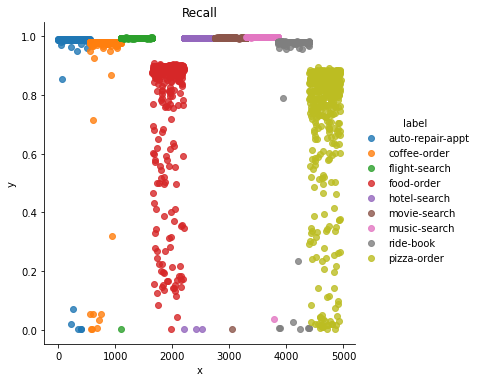

In [507]:
# graphing evaluation
recalls = pd.DataFrame(list(zip(eval_recall, eval_label)), columns=['y', 'label'])
recalls['x'] = recalls.index
print(recalls.head(5))
recall_graph = sns.lmplot(data=recalls, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_recalls = plt.gca()
ax_recalls.set_title("Recall")

          y             label  x
0  0.990909  auto-repair-appt  0
1  0.989091  auto-repair-appt  1
2  0.990909  auto-repair-appt  2
3  0.987273  auto-repair-appt  3
4  0.989091  auto-repair-appt  4


[Text(0.5, 6.79999999999999, 'i-th utterance'),
 Text(17.784999999999997, 0.5, 'F1 score')]

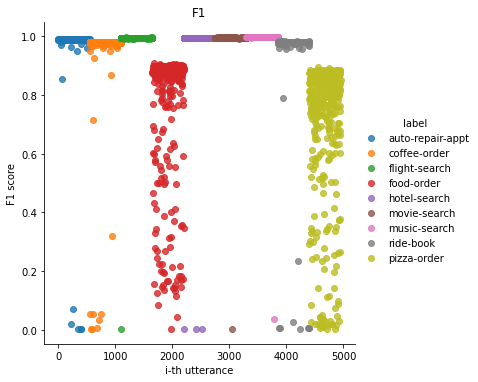

In [508]:
f1 = pd.DataFrame(list(zip(eval_f1, eval_label)), columns=['y', 'label'])
f1['x'] = f1.index
print(f1.head(5))
f1_graph = sns.lmplot(data=f1, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_f1 = plt.gca()
ax_f1.set_title("F1")
ax_f1.set(xlabel = 'i-th utterance', ylabel = 'F1 score')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'auto-repair-appt'),
  Text(1, 0, 'coffee-order'),
  Text(2, 0, 'flight-search'),
  Text(3, 0, 'food-order'),
  Text(4, 0, 'hotel-search'),
  Text(5, 0, 'movie-search'),
  Text(6, 0, 'music-search'),
  Text(7, 0, 'ride-book'),
  Text(8, 0, 'pizza-order')])

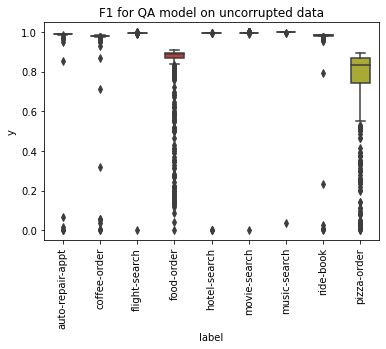

In [510]:
ax_test = sns.boxplot(data=f1, x='label', y='y', width = 0.5)
plt.title("F1 for QA model on uncorrupted data")
plt.xticks(rotation=90)

In [ ]:
f1.head(5)

In [ ]:
eval_f1_means, eval_f1_stds = [], []
for label in ['pizza-order'] + clean_data_labels:
    eval_f1_means.append((label, f1[f1['label'] == label]['y'].mean()))
    eval_f1_stds.append((label, f1[f1['label'] == label]['y'].std()))
print("f1 means by label: ", eval_f1_means)
print("f1 STD by label: ", eval_f1_stds)

In [ ]:
precision = pd.DataFrame(list(zip(eval_precision, eval_label)), columns=['y', 'label'])
precision['x'] = precision.index
print(f1.head(5))
f1_graph = sns.lmplot(data=precision, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)

### Appendix: previous data cleaning attempts

In [183]:
# # train_dev_test_split = [0.6, 0.2, 0.2]
# train_corpus, dev_corpus, test_corpus = [], [], []
# for idx in corpus_label_counts.index.tolist():
#     label = idx[0]
#     all_data = dataset[dataset['label'] == label].reset_index(drop=True)
#     train_corpus.append(all_data[:int(len(all_data) * 0.6)])
#     dev_corpus.append(all_data[int(len(all_data) * 0.6) : int(len(all_data) * 0.7)])
#     test_corpus.append(all_data[int(len(all_data) * 0.7):])
# train_corpus = pd.concat(train_corpus)
# dev_corpus = pd.concat(dev_corpus)
# test_corpus = pd.concat(test_corpus)
# print("train data size: ", len(train_corpus), ", dev data size: ", len(dev_corpus), ", test data size: ", len(test_corpus))

train data size:  10228 , dev data size:  1706 , test data size:  5121


In [184]:
# print("train:\n")
# print(train_corpus['label'].value_counts())
# print("\n dev: \n")
# print(dev_corpus['label'].value_counts())
# print("\n test: \n")
# print(test_corpus['label'].value_counts())

train:

restaurant-search    1825
movie-search         1601
flight-search        1375
music-search          916
pizza-order           825
coffee-order          756
movie-ticket          727
auto-repair-appt      658
food-order            605
ride-book             598
restaurant-book       342
Name: label, dtype: int64

 dev: 

restaurant-search    304
movie-search         267
flight-search        230
music-search         152
pizza-order          138
coffee-order         126
movie-ticket         122
auto-repair-appt     110
food-order           101
ride-book             99
restaurant-book       57
Name: label, dtype: int64

 test: 

restaurant-search    913
movie-search         801
flight-search        688
music-search         459
pizza-order          413
coffee-order         378
movie-ticket         364
auto-repair-appt     330
food-order           303
ride-book            300
restaurant-book      172
Name: label, dtype: int64
